In [5]:
#%autoreload
import pickle
import numpy as np
import pandas as pd
import plotly.graph_objs as go
import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.widgets import LassoSelector
from matplotlib.path import Path
import matplotlib.colors as mcolors

#import seaborn as sns
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, plot
import time
import os.path
import time
from datetime import datetime, timezone
import pytz
from itertools import cycle
from scipy import stats, ndimage
from skimage.transform import hough_line, hough_line_peaks
from skimage.filters import threshold_yen
from functions.HXRSS_tool_plotter_limit import Bragg_plotter_limit # Crystal model 
import scipy.optimize as opt
from scipy.optimize import curve_fit
from scipy.optimize import leastsq
from bayes_opt import BayesianOptimization, UtilityFunction
from functions.HXRSS_Bragg_fun_lstsq import HXRSSopt, HXRSSopt_roll
from functions.HXRSS_tool_plotter import Bragg_plotter, Bragg_plotter_roll
from functions.HXRSS_Bragg_fun import HXRSS_singleLine#
import json

import re

In [2]:
#%load_ext autoreload
%autoreload
from functions.HXRSS_Bragg_fun import HXRSS_singleLine#


UsageError: Line magic function `%autoreload` not found.


## Crystal model setup

In [6]:
def getlocal_Hplanes(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll_angle,ph_vals,pitches):
    phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll_angle)
    phenH, pitches_H, Hs = [],[], []    
    for phen, pangle, gid in zip(phen_list, p_angle_list, gid_list):
        ph_axis, pa_axis = [], []
        for ph_value, pa_value in zip(phen, pangle):
            # Only keep photon energies within a close range of the spectrometer image range
            if ph_value > ph_vals[0]-170 and ph_value < ph_vals[-1]+170 and pa_value >= min(pitches)-1.2 and pa_value <= max(pitches)+1.2:
                ph_axis.append(ph_value)
                pa_axis.append(pa_value)
        if len(ph_axis)>0:
            phenH.append(ph_axis)
            pitches_H.append(pa_axis)
            Hs.append(gid)
    return phenH, pitches_H, Hs

def getlocal_Hplanes_roll(hmax, kmax, lmax, dthp, dthy, dthr, alpha, pitch_angle,ph_vals,rolls):
    phen_list, r_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_roll(hmax, kmax, lmax, dthp, dthy, dthr, alpha, pitch_angle)
    phenH, rolls_H, Hs = [],[], []    
    for phen, rangle, gid in zip(phen_list, r_angle_list, gid_list):
        ph_axis, ra_axis = [], []
        for ph_value, ra_value in zip(phen, rangle):
            # Only keep photon energies within a close range of the spectrometer image range
            if ph_value > ph_vals[0]-170 and ph_value < ph_vals[-1]+170 and ra_value >= min(rolls)-1.2 and ra_value <= max(rolls)+1.2:
                ph_axis.append(ph_value)
                ra_axis.append(ra_value)
        if len(ph_axis)>0:
            phenH.append(ph_axis)
            rolls_H.append(ra_axis)
            Hs.append(gid)
    return phenH, rolls_H, Hs


In [14]:
colors=['r','w','b','m','c','r','g']

# Model parameters, these should remain unchanged unless the photon energy is above 15 keV where hmax = 6, kmax = 6, lmax = 7.
hmax = 4
kmax = 4
lmax = 5
dthp = 1.14473852e+00
dthy = 1.10991002e+00
dthr = -1.01729259e+00
alpha =  1.07575895e-02#0.00815
en = 0#63#0#-16.85196215
Ecorr = 0#-1.68970353e+01

# [ 1.14473852e+00  1.10991002e+00 -1.01729259e+00  1.07575895e-02
#  -1.68970353e+01]
#[  1.15581834   1.78199812   0.66586982  -0.03075924 -16.85196215]

## Iterate scans and plot model on top

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
1
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



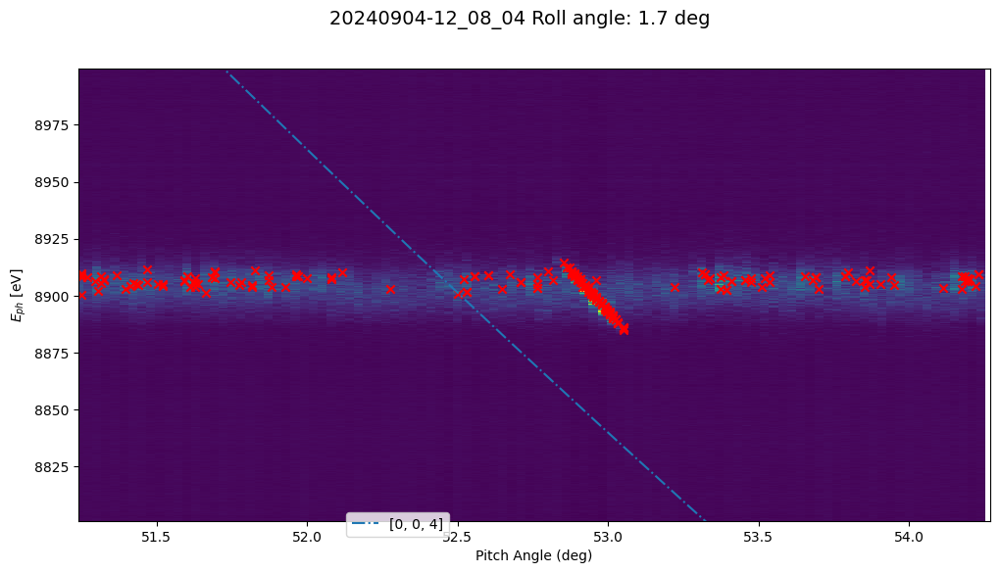

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
2
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



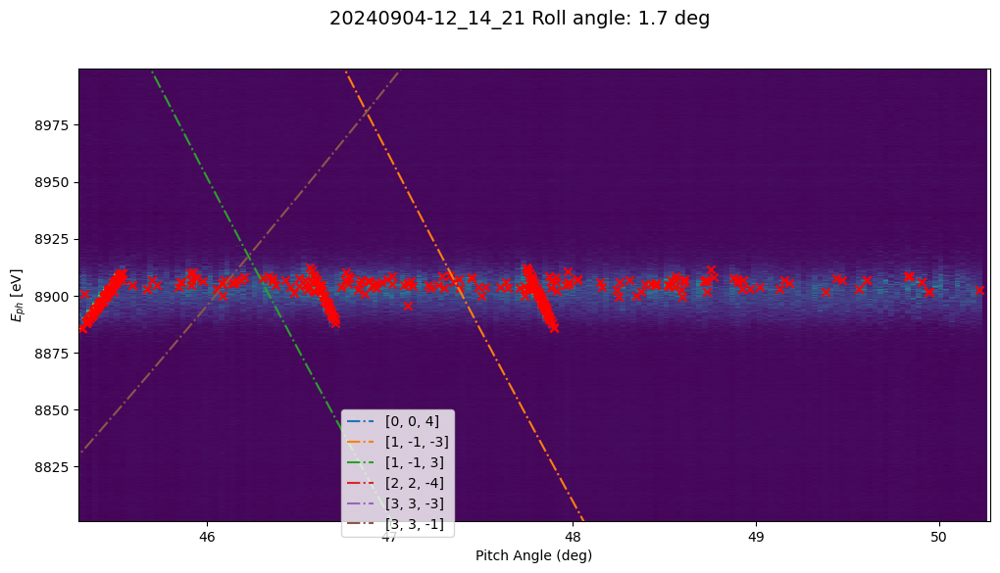

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
3
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



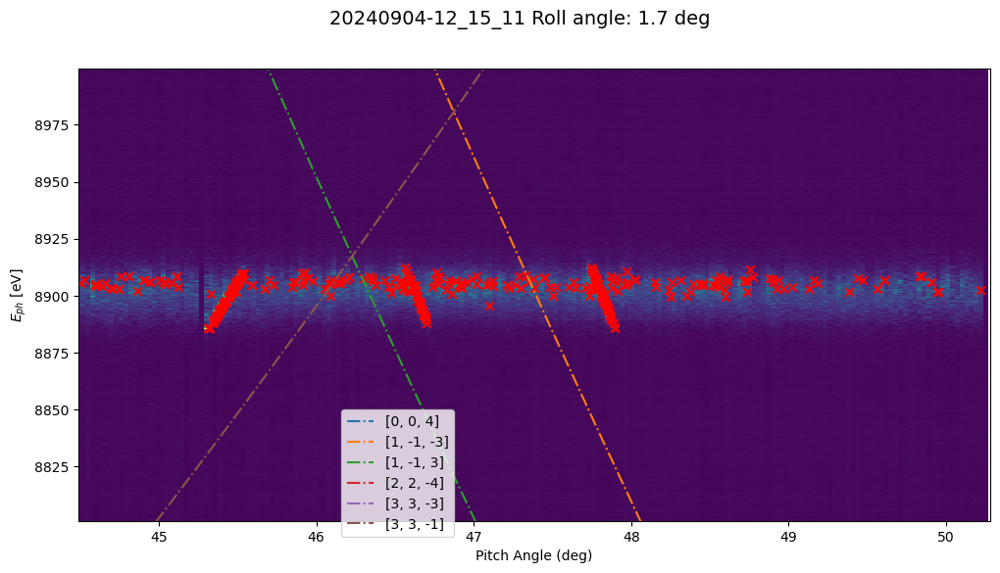

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
4
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



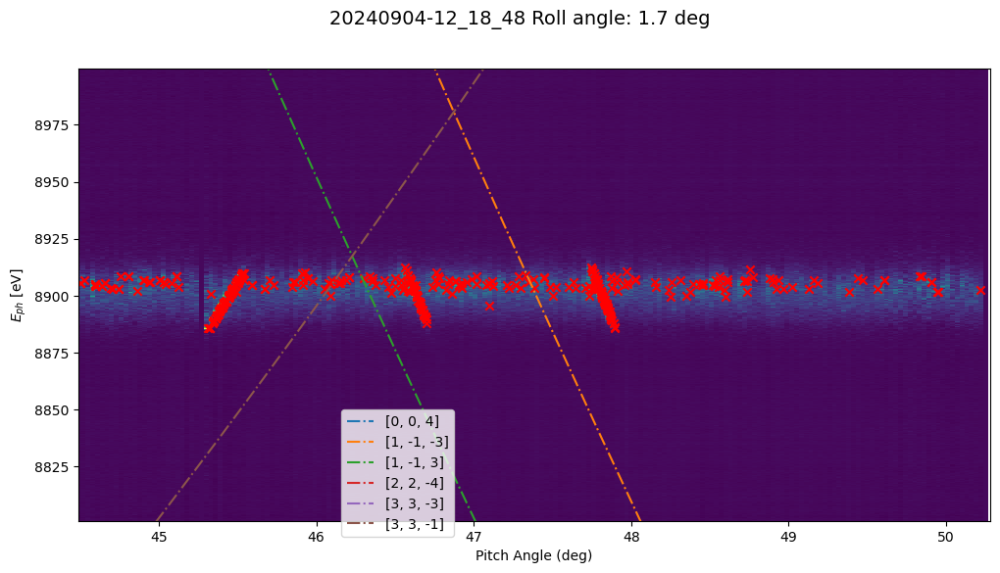

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
5
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



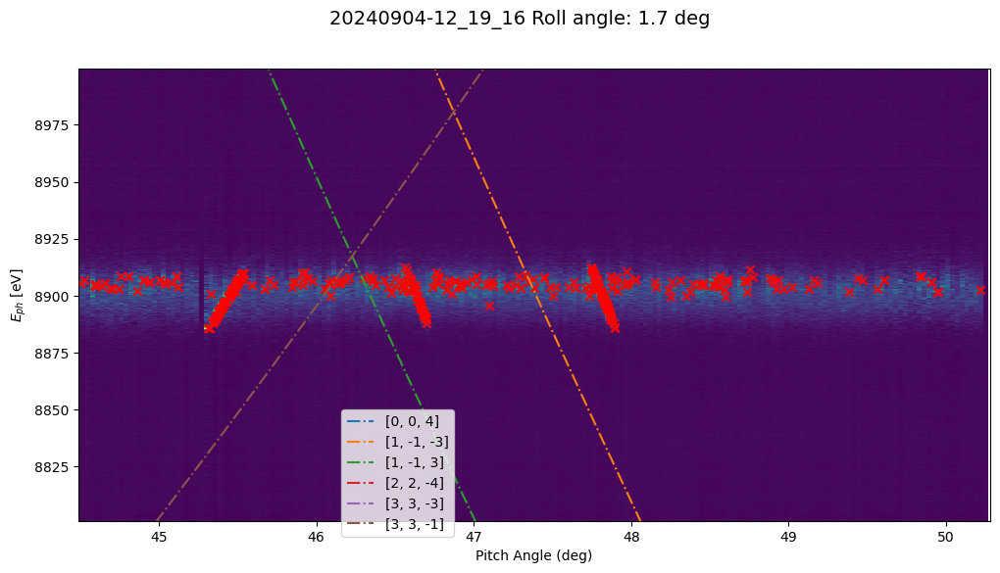

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
6
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



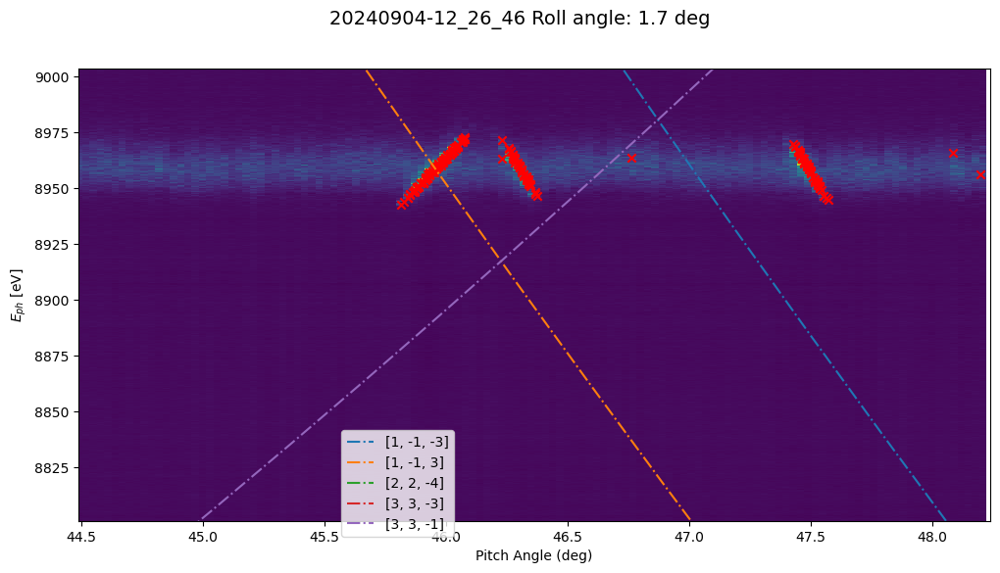

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
7
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



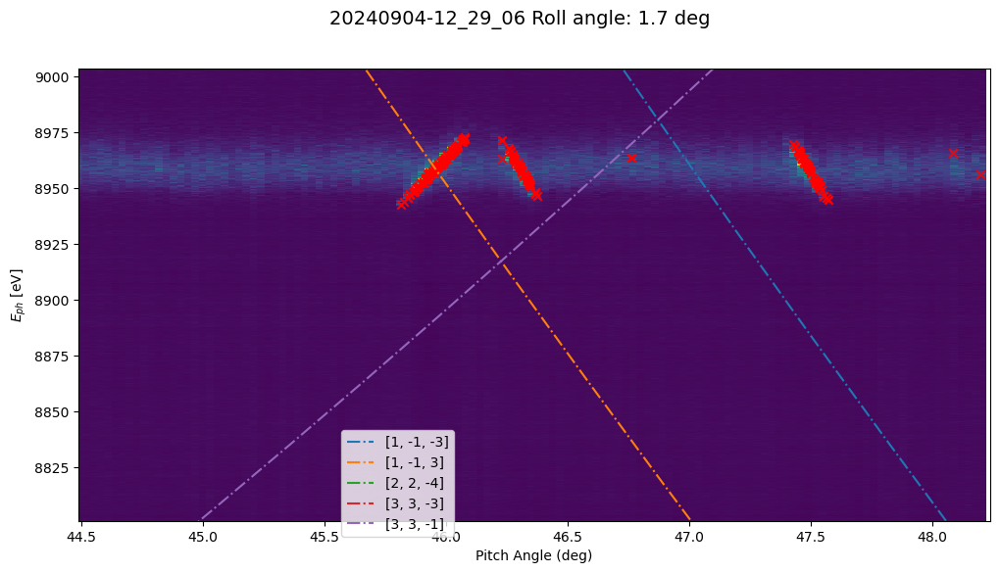

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
8
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



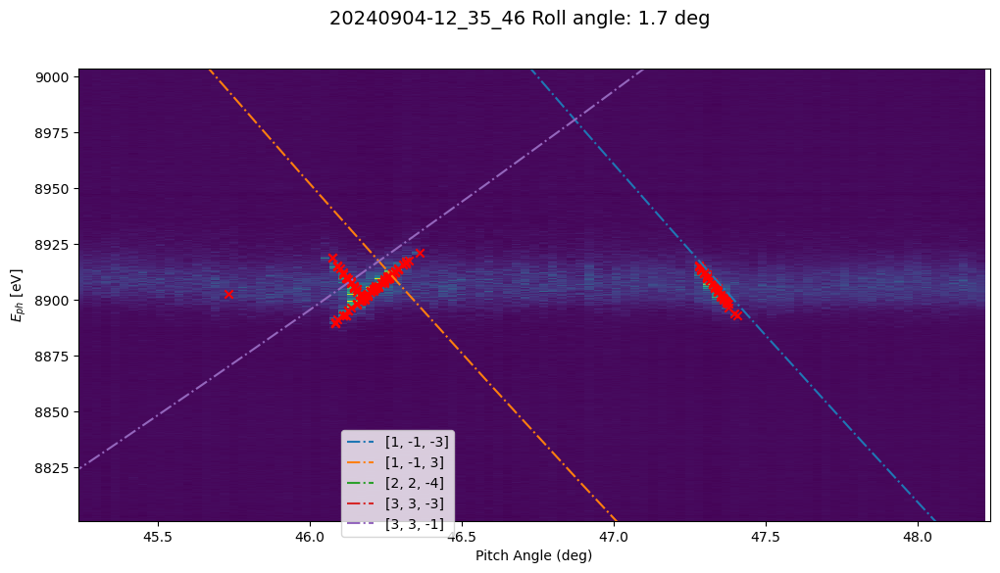

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
9
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



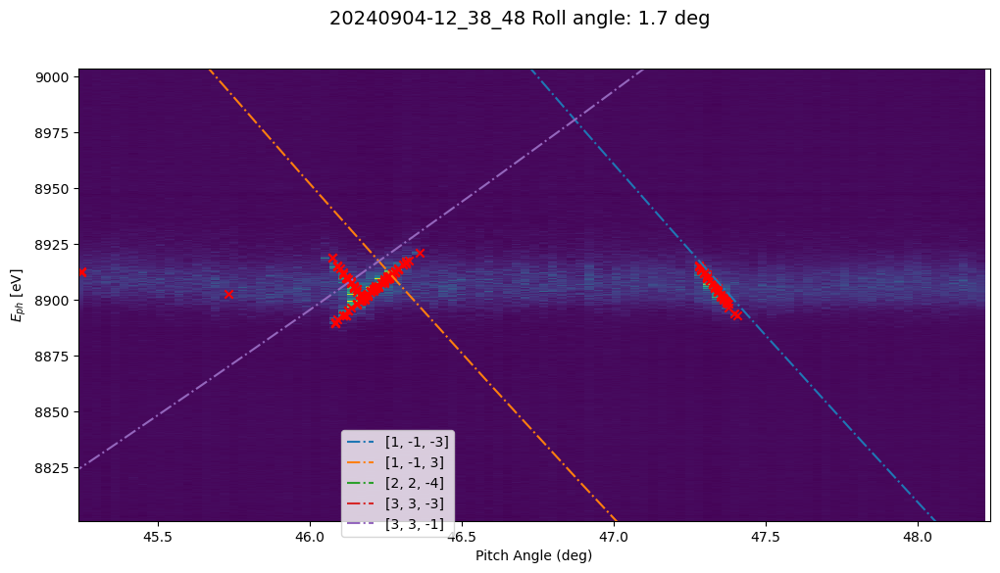

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
10
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



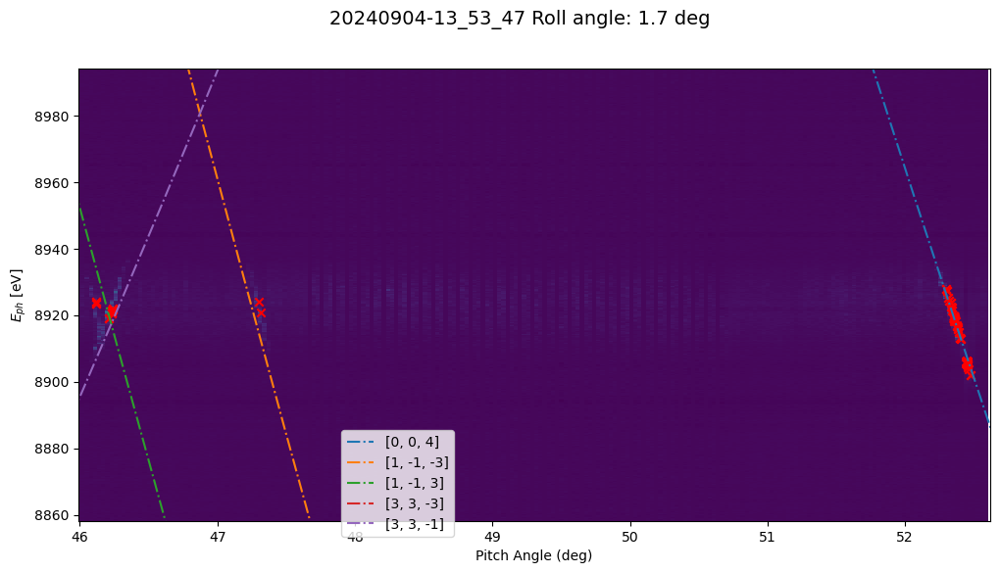

XFEL.MAGNETS/CHICANE/HXRSS02/DT_FS_RBV
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
11
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



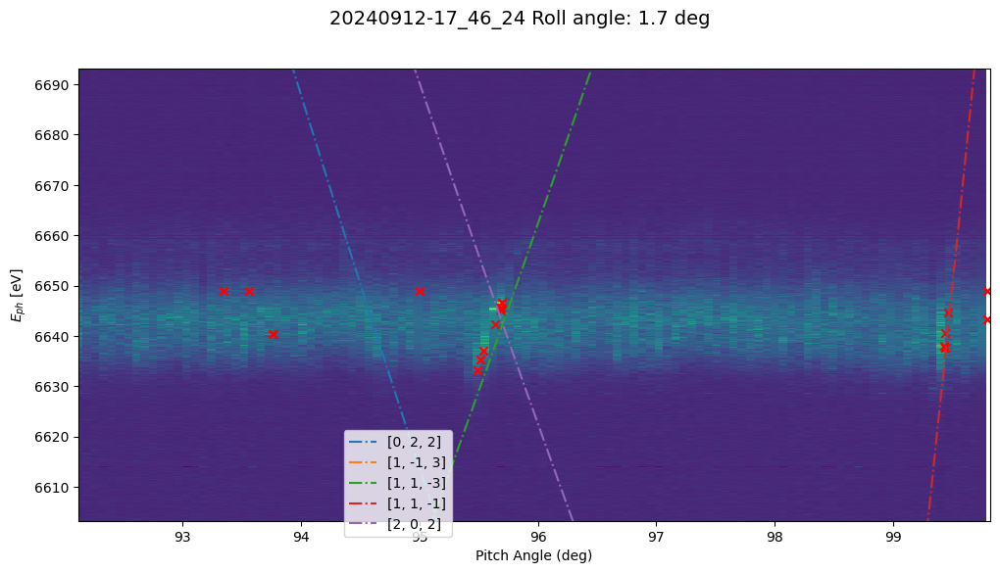

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
12
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



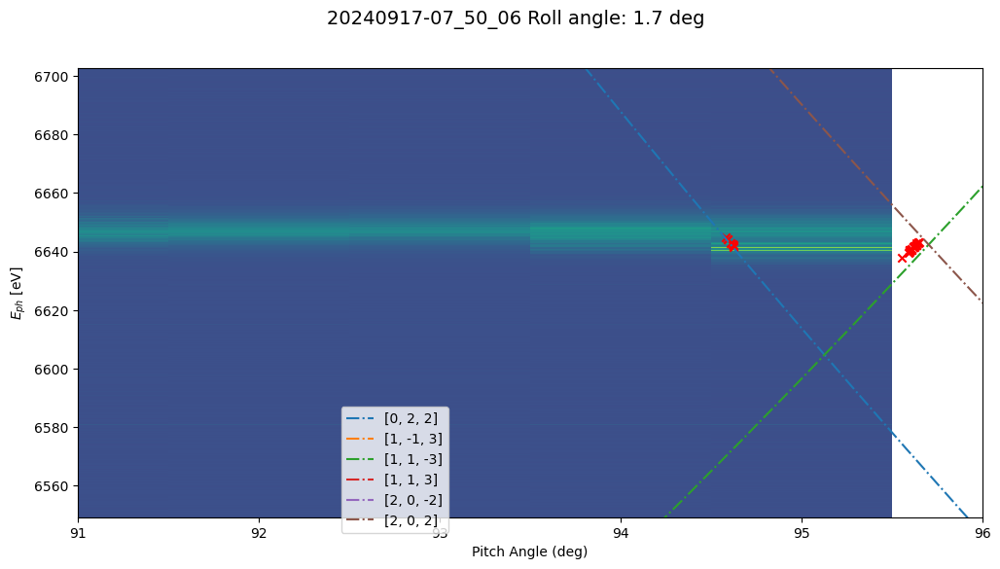

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
13
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



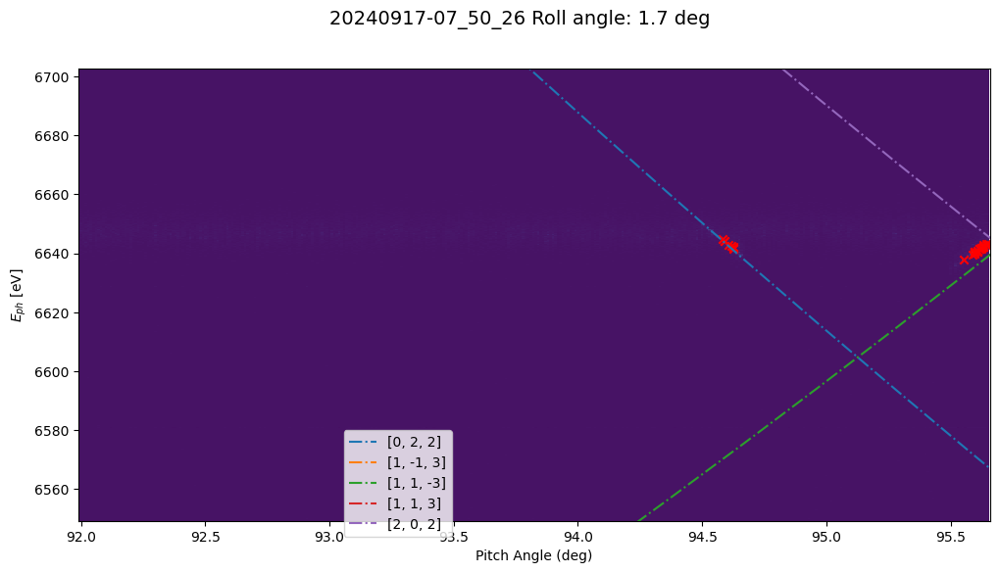

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
14
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



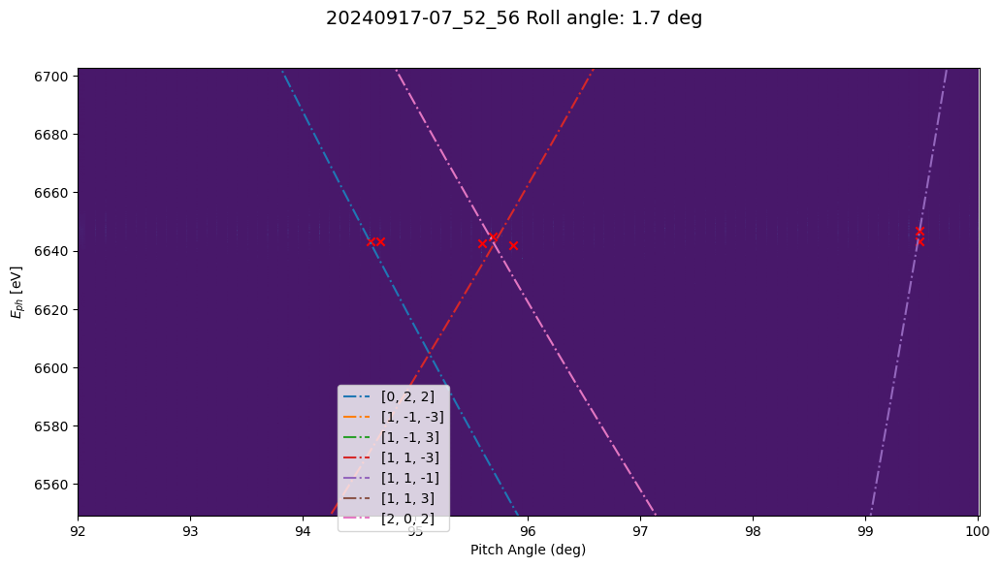

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
15
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



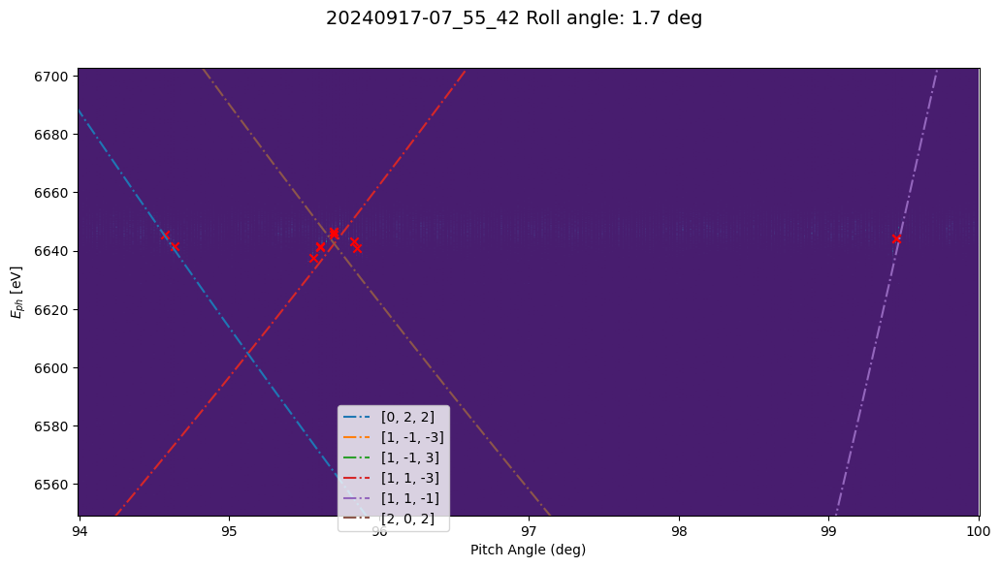

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
16
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



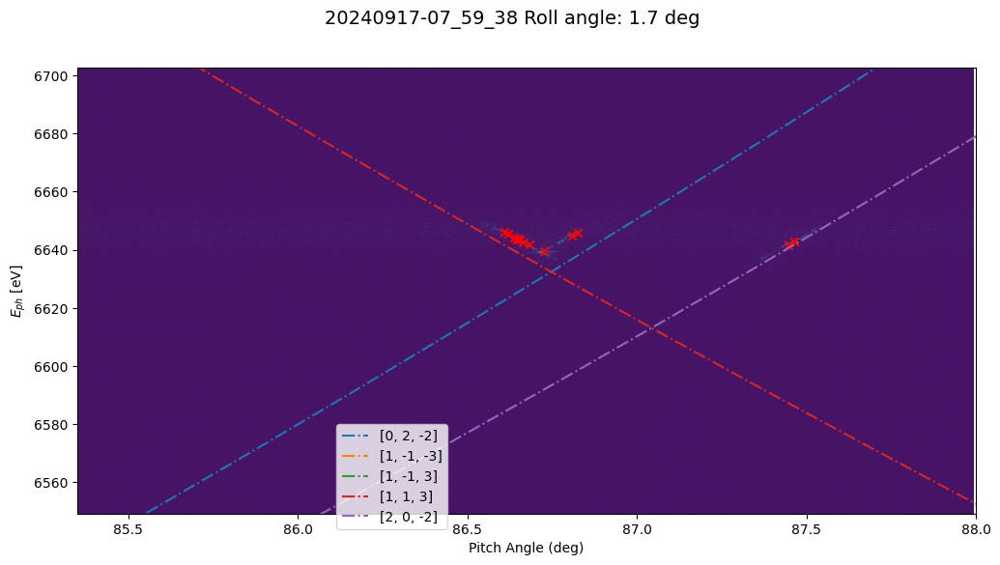

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
17
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



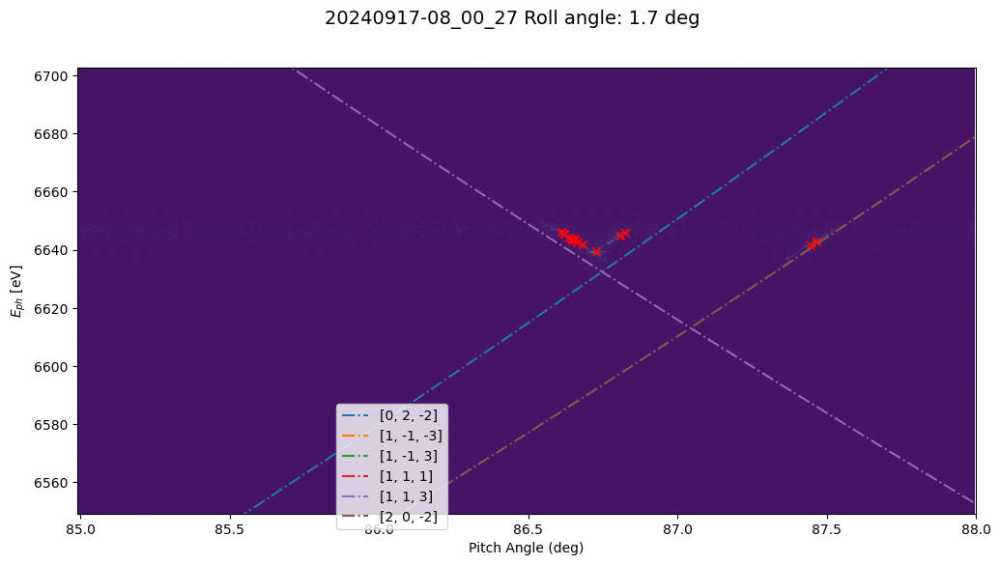

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
18
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



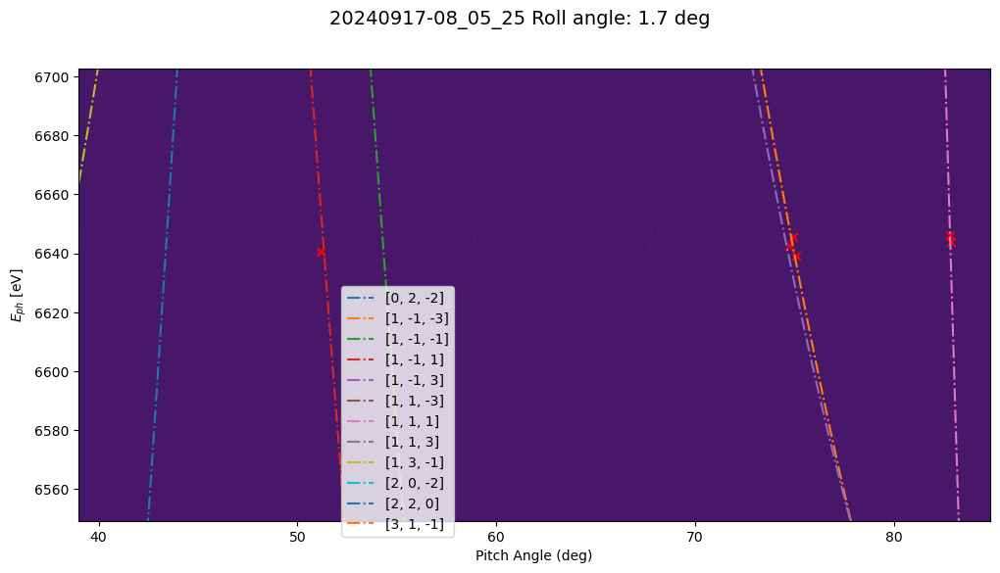

XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
19
Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 



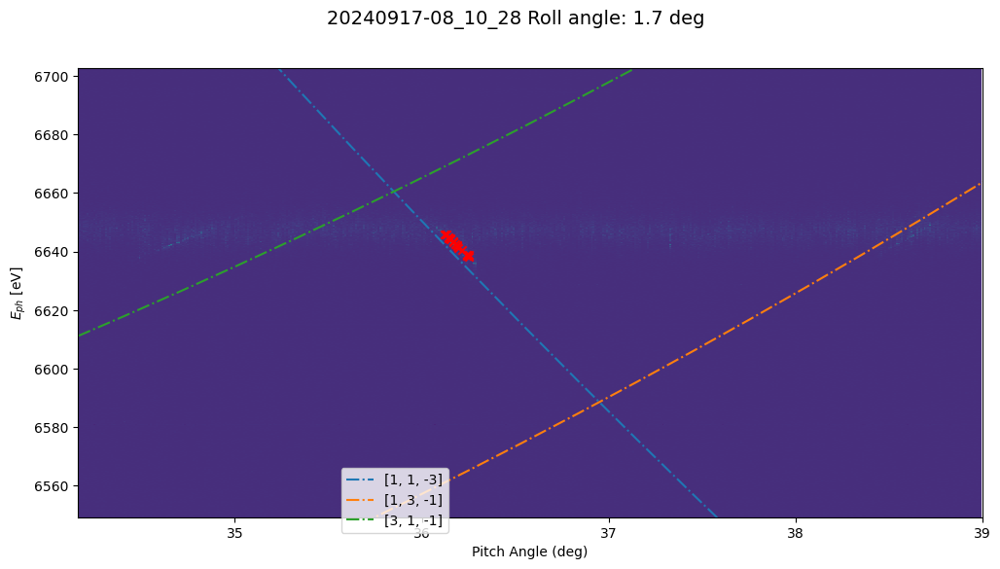

In [15]:
directory = r'sep2024.nosync/' 
pitch_tot = []
pitch_dict = {}
seeding_energy_tot = []
seeding_energy_dict = {}
roll_tot = []
roll_dict = {}
Hquery_dict = {}
m=0
datafiles = []
for file in sorted(os.listdir(directory)):  
    # if m>1:
        # break
    filename = os.fsdecode(file)
    if filename.endswith('cor2d.npz'):# and (filename.find("20240831")>=0 or filename.find("20240901")>=0):
        xfromnpphen = False
        filepath=os.path.join(directory, file)
        #datafiles.append(filepath)
        tt = np.load(filepath, allow_pickle=True)
        corr2d = tt['corr2d']
        orig_image = tt['corr2d'].T
        spec_hist = tt['spec_hist']
        doocs_scale = tt['doocs_scale']
        np_phen = tt['phen_scale']#+en
        doocs_vals_hist = tt['doocs_vals_hist']
        doocs_label = tt['doocs_channel']
        date_raw=filename[ 0 : 17 ]
        date_time_obj = datetime.strptime(date_raw, '%Y%m%d-%H_%M_%S')
        # check if the image corresponds to a crystal pitch angle scan. MONOPA 
        print(doocs_label)
        if "XFEL.FEL/UNDULATOR.SASE2/MONOPA.2252.SA2/ANGLE" in doocs_label or "XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE" in doocs_label:
            datafiles.append(filepath)
            date_raw=filename[ 0 : 17 ]
            date_time_obj = datetime.strptime(date_raw, '%Y%m%d-%H_%M_%S') #strip date from image filename
            m=m+1
            print(m)
            # Search for corresponding roll angle from the status file or the database pickle file.
            if "XFEL.FEL/UNDULATOR.SASE2/MONOPA.2252.SA2/ANGLE" in doocs_label:#
                mono_no_pitch = 1
                try:
                    filedata = np.loadtxt(
                        filepath+'_status.txt', dtype='str', delimiter=',', skiprows=1)
                    ra_pos = np.where(
                        filedata == 'XFEL.FEL/UNDULATOR.SASE2/MONORA.2252.SA2/ANGLE')
                    ra_row = ra_pos[0][0]
                    roll_angle = float(filedata[ra_row][1])
                    print('Monochromator 1 image found; \nMachine status file found: roll angle=' + str(np.round(roll_angle, 4)) + ' deg \n')
                except:
                    try:
                        berlin = pytz.timezone('Europe/Berlin')
                        df_db['date_full'] = pd.to_datetime(df_db['date_full'], utc=True)
                        df_db['date_full'] = df_db['date_full'].dt.tz_convert("Europe/Paris")
                        dt = date_time_obj
                        dt = dt.replace(tzinfo=berlin)
                        roll = df_db['roll_angle'].loc[(df_db['date_full'] == nearest(df_db['date_full'], dt)) ]
                        roll_angle = float(roll.iloc[0])
                        print('Monochromator 1 image found; from database: roll angle=' + str(np.round(roll_angle, 4)) + ' deg \n')
                    except:
                        roll_angle = 1
                        print('Monochromator 1 image found; Default roll angle set (1 deg).')
            elif "XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE" in doocs_label:
                mono_no_pitch = 2
                try:
                    filedata = np.loadtxt(
                        filepath+'_status.txt', dtype='str', delimiter=',', skiprows=1)
                    ra_pos = np.where(
                        filedata == 'XFEL.FEL/UNDULATOR.SASE2/MONORA.2307.SA2/ANGLE')
                    ra_row = ra_pos[0][0]
                    roll_angle = float(filedata[ra_row][1])
                    print('Monochromator 2 image found; \nMachine status file found: roll angle=' + str(np.round(roll_angle, 4)) + ' deg \n')
                except:
                    try:
                        berlin = pytz.timezone('Europe/Berlin')
                        df_db['date_full'] = pd.to_datetime(df_db['date_full'], utc=True)
                        df_db['date_full'] = df_db['date_full'].dt.tz_convert("Europe/Paris")
                        dt = date_time_obj
                        dt = dt.replace(tzinfo=berlin)
                        roll = df_db['roll_angle'].loc[(df_db['date_full'] == nearest(df_db['date_full'], dt)) ]
                        roll_angle = float(roll.iloc[0])
                        print('Monochromator 2 image found; from database: roll angle=' + str(np.round(roll_angle, 4)) + ' deg \n')
                    except:
                        roll_angle = 1
                        print('Monochromator 2 image found; Default roll angle set (1 deg).')
            else: 
                mono_no_pitch = 0
                print('No roll angle')
              

            xfromnpphen = True

            if len(doocs_scale) != len(orig_image):
                np_doocs=doocs_scale[:-1]
            else:
                np_doocs=doocs_scale
            # if np_phen.min()>9100:
            #     np_phen -= 220.205399303666535
            np_phen += en
            # Original image plot
            fig, ax = plt.subplots(1, 1, figsize=(12, 6))
            fig.suptitle(date_raw+' Roll angle: '+str(np.round(roll_angle,3))+' deg', fontsize=14)
            
            plot = ax.pcolormesh(np_doocs, np_phen, orig_image, cmap='viridis', shading='auto')
            # phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll_angle)
            
            # for phen, pangle, gid in zip(phen_list, p_angle_list, gid_list):
            #     ph_axis, pa_axis = [], []
            #     for ph_value, pa_value in zip(phen, pangle):
            #         # Only keep photon energies within a close range of the spectrometer image range
            #         if ph_value > np_phen[0]-170 and ph_value < np_phen[-1]+170 and pa_value >= min(doocs_scale)-1.2 and pa_value <= max(doocs_scale)+1.2:
            #             ph_axis.append(ph_value)
            #             pa_axis.append(pa_value)
            #     if ph_axis == []:
            #         pass
            #     else:
            #         plt.plot(pa_axis, ph_axis, '--', label=gid, linewidth=3)
            #         pass
            Eph_H, pitches_H, Hquery = getlocal_Hplanes(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll_angle,np_phen,np_doocs)
            Hquery_dict[str(m)] = Hquery
            for Hidx, (ph_axis,pa_axis,gid) in enumerate(zip(Eph_H,pitches_H,Hquery)):
                EBragg = [ph + Ecorr for ph in ph_axis]
                plt.plot(pa_axis, EBragg, '-.', label=gid)
            ax.set_xlabel('Pitch Angle (deg)')
            ax.set_ylabel(r'$E_{ph}$ [eV]')
            ax.set_ylim(np_phen[0], np_phen[-1])
            ax.set_xlim(doocs_scale[0], doocs_scale[-1])
            ax.legend(loc=8, bbox_to_anchor=(0.35,-0.05))


            #extract pitch, roll and energy
            


            filter_arr = []
            seeding_energy = []
            thres = spec_hist.max()/3


            # en = 72
            #x = np_phen
            if xfromnpphen:
                x = np_phen.copy()
                
            else:
                E0=9010
                px1=1000
                ev_px = 0.35
                
                start = E0 - px1*ev_px
                stop = E0 + (1280 - px1) * ev_px
                x = np.linspace(start, stop, num=1280)
            for spectrum in spec_hist:

                if np.max(spectrum) > thres: ## Adjust this number to adjust threshold 
                    filter_arr.append(True)
                    seeding_energy.append(x[np.argmax(spectrum)])
                else:
                    filter_arr.append(False)
            
            #seems to be somewhat incorrect --> use different
            # for idx,spectrum in enumerate(corr2d):
            #     x = np_phen
            #     if np.max(spectrum) > thres: ## Adjust this number to adjust threshold 
            #         filter_arr.append(True)
            #         seeding_energy.append(x[np.argmax(spectrum)])
            #     else:
            #         filter_arr.append(False)

            pitch = tt['doocs_vals_hist'][filter_arr]
        # pitch = np_doocs[filter_arr]
            roll = np.ones(pitch.size)*roll_angle
            pitch_tot += pitch.tolist()
            roll_tot += roll.tolist()
            seeding_energy_tot += seeding_energy
            pitch_dict[str(m)] = pitch
            roll_dict[str(m)] = roll_angle
            seeding_energy_dict[str(m)] = seeding_energy
            
            ax.scatter(pitch,seeding_energy,color='r',marker='x')

            plt.show()
        elif "XFEL.FEL/UNDULATOR.SASE2/MONORA.2252.SA2/ANGLE" in doocs_label or "XFEL.FEL/UNDULATOR.SASE2/MONORA.2307.SA2/ANGLE" in doocs_label:
            datafiles.append(filepath)
            date_raw=filename[ 0 : 17 ]
            date_time_obj = datetime.strptime(date_raw, '%Y%m%d-%H_%M_%S') #strip date from image filename
            m=m+1
            print(m)
            # Search for corresponding roll angle from the status file or the database pickle file.
            if "XFEL.FEL/UNDULATOR.SASE2/MONORA.2252.SA2/ANGLE" in doocs_label:#
                mono_no_pitch = 1
                try:
                    filedata = np.loadtxt(
                        filepath+'_status.txt', dtype='str', delimiter=',', skiprows=1)
                    pa_pos = np.where(
                        filedata == 'XFEL.FEL/UNDULATOR.SASE2/MONOPA.2252.SA2/ANGLE')
                    pa_row = pa_pos[0][0]
                    pitch_angle = float(filedata[pa_row][1])
                    print('Monochromator 1 image found; \nMachine status file found: pitch angle=' + str(np.round(pitch_angle, 4)) + ' deg \n')
                except:
                    try:
                        berlin = pytz.timezone('Europe/Berlin')
                        df_db['date_full'] = pd.to_datetime(df_db['date_full'], utc=True)
                        df_db['date_full'] = df_db['date_full'].dt.tz_convert("Europe/Paris")
                        dt = date_time_obj
                        dt = dt.replace(tzinfo=berlin)
                        pitch = df_db['pitch_angle'].loc[(df_db['date_full'] == nearest(df_db['date_full'], dt)) ]
                        pitch_angle = float(pitch.iloc[0])
                        print('Monochromator 1 image found; from database: roll angle=' + str(np.round(pitch_angle, 4)) + ' deg \n')
                    except:
                        pitch_angle = 90
                        print('Monochromator 1 image found; Default pitch angle set (90 deg).')
            elif "XFEL.FEL/UNDULATOR.SASE2/MONORA.2307.SA2/ANGLE" in doocs_label:
                mono_no_pitch = 2
                try:
                    filedata = np.loadtxt(
                        filepath+'_status.txt', dtype='str', delimiter=',', skiprows=1)
                    pa_pos = np.where(
                        filedata == 'XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE')
                    pa_row = pa_pos[0][0]
                    pitch_angle = float(filedata[pa_row][1])
                    print('Monochromator 2 image found; \nMachine status file found: pitch angle=' + str(np.round(pitch_angle, 4)) + ' deg \n')
                except:
                    try:
                        berlin = pytz.timezone('Europe/Berlin')
                        df_db['date_full'] = pd.to_datetime(df_db['date_full'], utc=True)
                        df_db['date_full'] = df_db['date_full'].dt.tz_convert("Europe/Paris")
                        dt = date_time_obj
                        dt = dt.replace(tzinfo=berlin)
                        pitch = df_db['pitch_angle'].loc[(df_db['date_full'] == nearest(df_db['date_full'], dt)) ]
                        pitch_angle = float(pitch.iloc[0])
                        print('Monochromator 2 image found; from database: pitch angle=' + str(np.round(pitch_angle, 4)) + ' deg \n')
                    except:
                        pitch_angle = 1
                        print('Monochromator 2 image found; Default pitch angle set (1 deg).')
            else: 
                mono_no_roll = 0
                print('No pitch angle')
              

            if len(doocs_scale) != len(orig_image):
                np_doocs=doocs_scale[:-1]
            else:
                np_doocs=doocs_scale
            if np_phen.min()>9100:
                np_phen -= 220.205399303666535
                xfromnpphen = True
                
            # Original image plot
            fig, ax = plt.subplots(1, 1, figsize=(12, 6))
            fig.suptitle(date_raw+' pitch angle: '+str(np.round(pitch_angle,3))+' deg', fontsize=14)
            
            plot = ax.pcolormesh(np_doocs, np_phen, orig_image, cmap='viridis', shading='auto')
            # phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll_angle)
            
            # for phen, pangle, gid in zip(phen_list, p_angle_list, gid_list):
            #     ph_axis, pa_axis = [], []
            #     for ph_value, pa_value in zip(phen, pangle):
            #         # Only keep photon energies within a close range of the spectrometer image range
            #         if ph_value > np_phen[0]-170 and ph_value < np_phen[-1]+170 and pa_value >= min(doocs_scale)-1.2 and pa_value <= max(doocs_scale)+1.2:
            #             ph_axis.append(ph_value)
            #             pa_axis.append(pa_value)
            #     if ph_axis == []:
            #         pass
            #     else:
            #         plt.plot(pa_axis, ph_axis, '--', label=gid, linewidth=3)
            #         pass
            Eph_H, rolls_H, Hquery = getlocal_Hplanes_roll(hmax, kmax, lmax, dthp, dthy, dthr, alpha, pitch_angle,np_phen,np_doocs)
            Hquery_dict[str(m)] = Hquery
            for Hidx, (ph_axis,ra_axis,gid) in enumerate(zip(Eph_H,rolls_H,Hquery)):
                EBragg = [ph + Ecorr for ph in ph_axis]
                plt.plot(ra_axis, EBragg, '-.', label=gid)
            ax.set_xlabel('Roll Angle (deg)')
            ax.set_ylabel(r'$E_{ph}$ [eV]')
            ax.set_ylim(np_phen[0], np_phen[-1])
            ax.set_xlim(doocs_scale[0], doocs_scale[-1])
            ax.legend(loc=8, bbox_to_anchor=(0.35,-0.05))


            #extract pitch, roll and energy
            


            filter_arr = []
            seeding_energy = []
            thres = spec_hist.max()/3


            # en = 72
            #x = np_phen
            if xfromnpphen:
                x = np_phen.copy()
                # for spectrum in spec_hist:
                #     if np.max(spectrum) > thres: ## Adjust this number to adjust threshold 
                #         filter_arr.append(True)
                #         seeding_energy.append(x[np.argmax(spectrum)]+en)
                #     else:
                #         filter_arr.append(False)
                # pitch = np_doocs[filter_arr]
                
            else:
                E0=9010
                px1=1000
                ev_px = 0.35
                
                start = E0 - px1*ev_px
                stop = E0 + (1280 - px1) * ev_px
                x = np.linspace(start, stop, num=1280)
            for spectrum in spec_hist:

                if np.max(spectrum) > thres: ## Adjust this number to adjust threshold 
                    filter_arr.append(True)
                    seeding_energy.append(x[np.argmax(spectrum)])
                else:
                    filter_arr.append(False)
            
            #seems to be somewhat incorrect --> use different
            # for idx,spectrum in enumerate(corr2d):
            #     x = np_phen
            #     if np.max(spectrum) > thres: ## Adjust this number to adjust threshold 
            #         filter_arr.append(True)
            #         seeding_energy.append(x[np.argmax(spectrum)])
            #     else:
            #         filter_arr.append(False)

            roll = tt['doocs_vals_hist'][filter_arr]
        # pitch = np_doocs[filter_arr]
            pitch = np.ones(roll.size)*roll_angle
            pitch_tot += pitch.tolist()
            roll_tot += roll.tolist()
            seeding_energy_tot += seeding_energy
            pitch_dict[str(m)] = pitch_angle
            roll_dict[str(m)] = roll
            seeding_energy_dict[str(m)] = seeding_energy
            
            ax.scatter(roll,seeding_energy,color='r',marker='x')

            plt.show()
            
            #if m ==13:
            #    break
            



In [12]:
for datafile in datafiles:
    print(datafile)

august24.nosync/20240831-11_02_04_cor2d.npz
august24.nosync/20240831-11_02_08_cor2d.npz
august24.nosync/20240831-11_09_22_cor2d.npz
august24.nosync/20240831-11_21_15_cor2d.npz
august24.nosync/20240831-11_21_28_cor2d.npz
august24.nosync/20240831-12_47_54_cor2d.npz
august24.nosync/20240831-16_59_43_cor2d.npz
august24.nosync/20240831-17_09_42_cor2d.npz
august24.nosync/20240831-17_24_07_cor2d.npz
august24.nosync/20240831-17_50_47_cor2d.npz
august24.nosync/20240831-18_17_12_cor2d.npz
august24.nosync/20240831-18_21_31_cor2d.npz
august24.nosync/20240831-18_32_45_cor2d.npz
august24.nosync/20240831-18_36_10_cor2d.npz
august24.nosync/20240831-18_45_12_cor2d.npz
august24.nosync/20240831-18_54_51_cor2d.npz
august24.nosync/20240831-18_59_43_cor2d.npz
august24.nosync/20240831-19_04_38_cor2d.npz
august24.nosync/20240831-19_08_48_cor2d.npz
august24.nosync/20240831-19_12_20_cor2d.npz
august24.nosync/20240831-19_18_00_cor2d.npz
august24.nosync/20240831-19_21_02_cor2d.npz
august24.nosync/20240831-19_27_3

In [5]:
# for file in sorted(os.listdir(directory)):  
#     filename = os.fsdecode(file)
#     if filename.endswith('cor2d.npz') and (filename.find("20240831")>=0 or filename.find("20240901")>=0):
#         filepath=os.path.join(directory, file)
#         tt = np.load(filepath, allow_pickle=True)
#         print(tt['spec_hist'].shape)
#         print(tt['phen_scale'].shape)

In [6]:
# m=0
# for file in sorted(os.listdir(directory)):  
#     filename = os.fsdecode(file)
#     if filename.endswith('cor2d.npz'):
#         filepath=os.path.join(directory, file)
#         datafiles.append(filepath)
#         tt = np.load(filepath, allow_pickle=True)
#         corr2d = tt['corr2d']
#         orig_image = tt['corr2d'].T
#         spec_hist = tt['spec_hist']
#         doocs_scale = tt['doocs_scale']
#         np_phen = tt['phen_scale']+en
#         doocs_vals_hist = tt['doocs_vals_hist']
#         doocs_label = tt['doocs_channel']
#         m+=1
#         print(m)
#         print(spec_hist.shape)
#         print(doocs_scale.shape)
#         print(doocs_vals_hist.shape)
#         print("\n")
#         # if m>5:
#         #     break


## Extract lines from spectral data for specific set (scan #3)

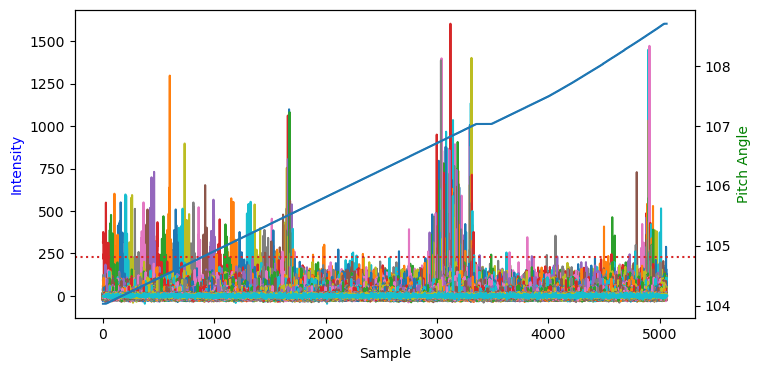

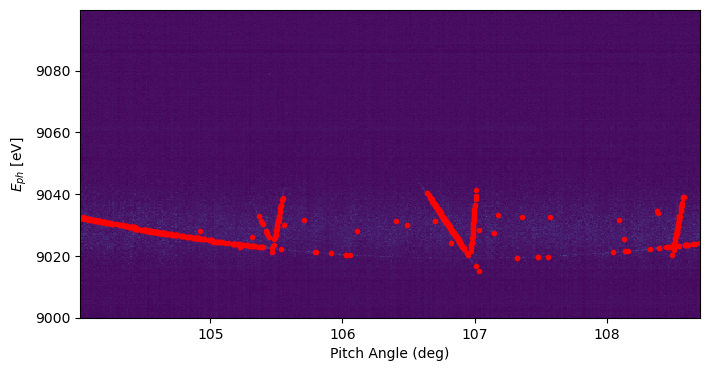

In [7]:
fidx = 3
tt = np.load(datafiles[fidx-1], allow_pickle=True)
fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
thresh = tt['spec_hist'].max()/7
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()

filter_arr = []
seeding_energy = []
en = 0
for spectrum in tt['spec_hist']:
    E0=9010
    px1=1000
    ev_px = 0.35
    
    start = E0 - px1*ev_px
    stop = E0 + (1280 - px1) * ev_px
    x = np.linspace(start, stop, num=1280)

    if np.max(spectrum) > thresh and x[np.argmax(spectrum)]>9000 and x[np.argmax(spectrum)]<9045: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
# Plot extracted lines
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,tt['phen_scale'],tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()

## use local model

In [8]:
# from dynamic_diffraction_module import *

# bm = bmirror
# from dynamic_diffraction_module import material_data as md
# # from dynamic_diffraction_module.utils import *

In [9]:
# cr = crystal()
# #cr.set_crystal_planes("111")
# cr.set_crystal_planes("100")
# cr.Tbase = 293#300
# cr.thickness = 100E-6

# cr.pitch = np.deg2rad(90)#np.pi/2
# cr.roll = 0
# #setting the Bragg angle to a specific degree
# #Theta_B = deg2rad(45.)
# #cr.roll = np.arccos(np.sin(Theta_B)/#np.sin(cr.pitch))
# cr.calc_RLab2Cryst()
# #H0 = np.array([3, 3, 3])
# H0 = np.array([4, 0, 0])
# bmir = bm(H0, cryst=cr)

In [ ]:
#fidx = 3
pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
roll = roll_dict[str(fidx)]
Hquery = Hquery_dict[str(fidx)]
print(Hquery)

['[0, 2, -2]', '[1, 1, -1]', '[1, 1, 5]', '[1, 3, 3]', '[2, 0, -2]', '[2, 2, 4]', '[3, 1, 3]']


In [ ]:
#bmir.cryst.yaw = np.deg2rad(dY)
# Pitch = np.deg2rad(pitches)
# _,_,PreSampling = getlocal_Hplanes(hmax,kmax,lmax,-1,-1.7,-1.5,0.001,roll,Eph_seed,pitches)
# Hquery = PreSampling[1]
# print(Hquery)

[1, 1, -1]


In [ ]:
%matplotlib widget

### select points and groups by hand

In [ ]:
%matplotlib widget

NameError: name 'pitches' is not defined

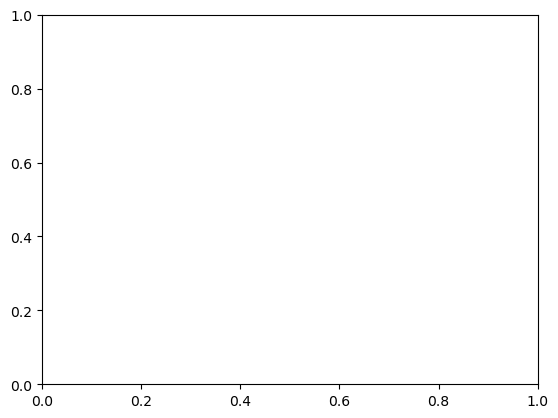

In [ ]:
fig, ax = plt.subplots()
scatter = ax.scatter(pitches, Eph_seed,picker=True)

# Interactive point selection
#cursor = mplcursors.cursor(sc, hover=True)
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
#selected_points_by_group = {label: [] for label in group_labels}

current_group_idx = 0
deselect_mode = False

# Function to change the color of the selected points based on the current group
def update_point_colors(selected, colors):
    scatter.set_facecolor(['gray'] * len(pitches))  # Reset all points to default color
    for idx, (group, points) in enumerate(selected_points_by_group.items()):
        if points:
            color = group_colors[idx]
            selected_points = np.array(points)
            scatter._facecolors[selected_points[:].astype(int)]=np.repeat([mcolors.to_rgba(color)],selected_points.shape[0],axis=0)
            # scatter._facecolors[selected_points[:, 0].astype(int)] = mcolors.to_rgb(color)
    fig.canvas.draw()

# Function to handle point selection with lasso
def onselect_lasso(verts):
    global current_group_idx
    path = Path(verts)
    selected = path.contains_points(np.column_stack((pitches, Eph_seed)))
    selected_indices = np.where(selected)[0]

    for i in selected_indices:
        if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
            del selected_points_by_group[group_labels[current_group_idx]][i]
        elif not deselect_mode:  # Select point if 'd' is not pressed
            selected_points_by_group[group_labels[current_group_idx]].append(i)

    print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
    update_point_colors(selected_indices, group_colors)

def on_pick(event):
    if event.mouseevent.button == 1:
        selected_indices = event.ind
        for i in selected_indices:
            if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
                loc_idx = np.where(selected_points_by_group[group_labels[current_group_idx]]==i)
                print(loc_idx[0][0])
                del selected_points_by_group[group_labels[current_group_idx]][loc_idx[0][0]]
            elif not deselect_mode:  # Select point if 'd' is not pressed
                selected_points_by_group[group_labels[current_group_idx]].append(i)
        #print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
        update_point_colors(selected_indices, group_colors)
    # xdata = x[ind[0]]
    # ydata = y[ind[0]]

    
    #xdata, ydata = line.get_data()
    #ind = event.ind
    
    #print(f'on pick line: {xdata[ind]}, {ydata[ind]}')

cid = fig.canvas.mpl_connect('pick_event', on_pick)

# Lasso and Rectangle selectors
lasso = LassoSelector(ax, onselect_lasso)


# Function to handle key press events (switch groups with 'n' or 'p')
def on_key(event):
    global current_group_idx, deselect_mode
    if event.key == 'n':  # Switch to the next group on pressing 'n'
        current_group_idx = (current_group_idx + 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'm' and current_group_idx>1:  # Switch to the previous group on pressing 'p'
        current_group_idx = (current_group_idx - 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'd':  # Switch deselect mode
        if deselect_mode:
            deselect_mode = False
            print("Switched off deselect mode")
        else:
            deselect_mode = True
            print("Switched on deselect mode")

    

# Connect the key press event
fig.canvas.mpl_connect('key_press_event', on_key)

plt.show()

In [ ]:
%matplotlib inline

In [ ]:
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label:[] for label in group_labels}
selected_points_by_group['Group 1'] = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 297, 298, 299, 300, 302, 303, 305, 306, 309, 314, 341, 349, 350, 351, 352, 353, 354, 536, 537, 539, 540, 541, 543, 546, 547, 548, 551, 552, 600, 601, 602, 603, 604, 605, 606, 607, 608, 600, 601, 602, 603, 604, 605, 606, 607, 582, 608, 609, 610, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 139, 140, 157, 158, 551, 552, 553, 554, 555, 556]
selected_points_by_group['Group 2']= [301, 304, 307, 308, 310, 311, 312, 313]
selected_points_by_group['Group 3']= [323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 342, 343, 344, 345, 346, 321, 322, 318, 319, 320, 316, 317, 315]
selected_points_by_group['Group 4']= [358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 376, 377, 378, 379, 380, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 374, 376, 377, 378, 379, 380, 381, 382]
selected_points_by_group['Group 5']= [500, 501, 502, 503, 504, 505, 506, 507, 508, 509, 510, 511, 512, 513, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 531, 499, 498]
selected_points_by_group['Group 6']= [598, 599, 597, 598, 599, 596, 594, 595, 593, 591, 592, 565, 566, 567, 568, 569, 570, 571, 572, 573, 574, 575, 576, 577, 578, 579, 580, 581, 583, 584, 585, 586, 587, 588, 589, 590, 563, 564, 562, 563, 560, 558, 557, 559, 561, 562]

0 : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 

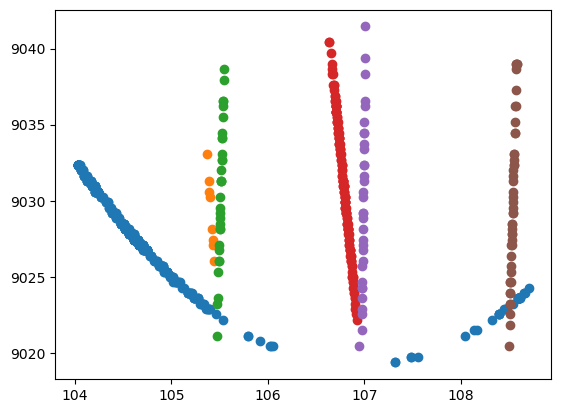

In [ ]:
pitches_H = []
E_H = []
plt.figure()
for lidx, points in enumerate(selected_points_by_group.values()):
    sort_idx = np.argsort(pitches[points].squeeze())
    pitches_H.append(pitches[points].squeeze()[sort_idx])
    
    E_H.append(Eph_seed[points].squeeze()[sort_idx])
    print(lidx,':',points)
    # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
    plt.scatter(pitches_H[lidx],E_H[lidx])
    #plt.plot(test_p[lidx],test_E[lidx])
plt.show()

99

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from matplotlib.widgets import LassoSelector, RectangleSelector
# from matplotlib.path import Path
# import matplotlib.colors as mcolors

# # Sample data
# x = np.random.rand(100)
# y = np.random.rand(100)

# # Plot the points
# fig, ax = plt.subplots()
# scatter = ax.scatter(x, y,picker=True)
# plt.subplots_adjust(bottom=0.2)

# # To keep track of the current group and selected points for each group
# group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
# group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4']
# selected_points_by_group = {label: [] for label in group_labels}
# current_group_idx = 0

# # Function to change the color of the selected points based on the current group
# def update_point_colors(selected, colors):
#     scatter.set_facecolor(['gray'] * len(x))  # Reset all points to default color
#     for idx, (group, points) in enumerate(selected_points_by_group.items()):
#         if points:
#             color = group_colors[idx]
#             selected_points = np.array(points)
#             scatter._facecolors[selected_points[:, 0].astype(int)]=np.repeat([mcolors.to_rgba(color)],selected_points.shape[0],axis=0)
#             # scatter._facecolors[selected_points[:, 0].astype(int)] = mcolors.to_rgb(color)
#     fig.canvas.draw()

# # Function to handle point selection with lasso
# def onselect_lasso(verts):
#     global current_group_idx
#     path = Path(verts)
#     selected = path.contains_points(np.column_stack((x, y)))
#     selected_indices = np.where(selected)[0]

#     selected_points_by_group[group_labels[current_group_idx]].extend(
#         [i] for i in selected_indices)

#     print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
#     update_point_colors(selected_indices, group_colors)

# def on_pick(event):
#     selected_indices = event.ind
#     selected_points_by_group[group_labels[current_group_idx]].extend(
#         [i] for i in selected_indices)
#     print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
#     update_point_colors(selected_indices, group_colors)
#     # xdata = x[ind[0]]
#     # ydata = y[ind[0]]

    
#     #xdata, ydata = line.get_data()
#     #ind = event.ind
    
#     #print(f'on pick line: {xdata[ind]}, {ydata[ind]}')

# cid = fig.canvas.mpl_connect('pick_event', on_pick)
# # Function to handle rectangle selection
# # def onselect_rectangle(eclick, erelease):
# #     global current_group_idx
# #     x1, y1 = eclick.xdata, eclick.ydata
# #     x2, y2 = erelease.xdata, erelease.ydata
# #     selected = (x > min(x1, x2)) & (x < max(x1, x2)) & (y > min(y1, y2)) & (y < max(y1, y2))
# #     selected_indices = np.where(selected)[0]

# #     selected_points_by_group[group_labels[current_group_idx]].extend(
# #         [(i, color) for i, color in zip(selected_indices, [group_colors[current_group_idx]] * len(selected_indices))])

# #     print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
# #     update_point_colors(selected_indices, group_colors[current_group_idx])

# # Lasso and Rectangle selectors
# lasso = LassoSelector(ax, onselect_lasso)
# # rect_selector = RectangleSelector(ax, onselect_rectangle, drawtype='box', useblit=True,
# #                                   button=[1],  # Left mouse button only
# #                                   minspanx=5, minspany=5,  # Minimum box size
# #                                   spancoords='data', interactive=True)

# # Function to handle key press events (switch groups with 'n')
# def on_key(event):
#     global current_group_idx
#     if event.key == 'n':  # Switch to the next group on pressing 'n'
#         current_group_idx = (current_group_idx + 1) % len(group_labels)
#         print(f"Switched to {group_labels[current_group_idx]}")
#     if event.key == 'p' and current_group_idx>1:  # Switch to the previous group on pressing 'p'
#         current_group_idx = (current_group_idx - 1) % len(group_labels)
#         print(f"Switched to {group_labels[current_group_idx]}")
    

# # Connect the key press event
# fig.canvas.mpl_connect('key_press_event', on_key)

# plt.show()


In [ ]:
# plt.figure()
# dP_split = 0.2
# dE_del = 10
# sort = np.argsort(pitches)
# pitch_sort = pitches[sort]
# Eph_sort = Eph_seed[sort]

# splitIdx = np.append(np.append([0],np.arange(1,pitch_sort.size)[np.logical_or(np.diff(pitch_sort)>dP_split, np.logical_or(pitch_sort[:-1]==105.23370361328125,pitch_sort[:-1]==106.90779876708984))]),[pitch_sort.size])
# pitches_H = [pitch_sort[splitIdx[idx]:splitIdx[idx+1]] for idx in range(splitIdx.size-1)]
# E_H = [Eph_sort[splitIdx[idx]:splitIdx[idx+1]] for idx in range(splitIdx.size-1)]


# # del_bool_l = np.array([pline.size<8 for pline in pitches_H])
# # for lidx in range(del_bool_l.size-1,0-1,-1):
# #     if del_bool_l[lidx]:
# #         del (pitches_H[lidx])
# #         del (E_H[lidx])

# # pitches_H[0]=np.delete(pitches_H[0],0)
# # E_H[0]=np.delete(E_H[0],0)
# for lidx in range(len(pitches_H)):
#     dEH = np.diff(E_H[lidx])
#     idx = np.hstack((True,dEH < dE_del))
#     E_dummy = E_H[lidx][idx]
#     pitches_dummy = pitches_H[lidx][idx]
#     E_H[lidx] = E_dummy
#     pitches_H[lidx] = pitches_dummy

#     plt.scatter(pitches_dummy,E_dummy,marker='x')

### get an idea about the actual angles

In [ ]:
#from functions import HXRSS_Bragg_fun2

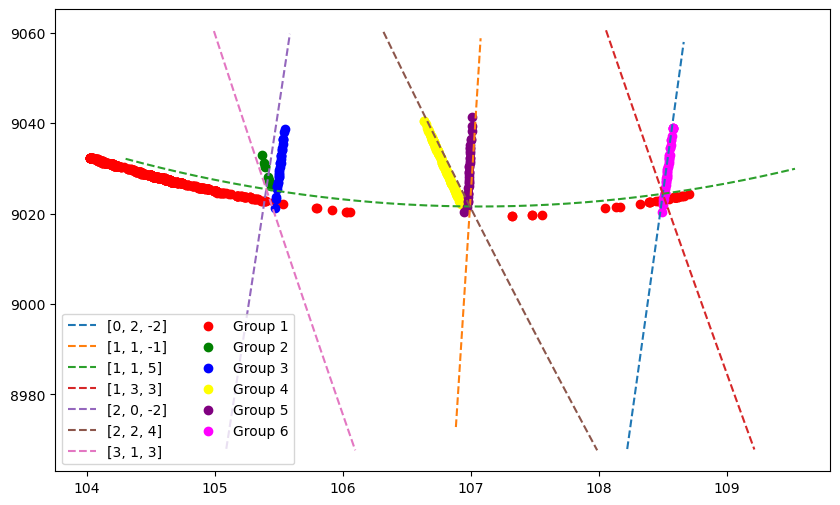

In [ ]:
dthp,dthy,dthr,alpha,Ecorr = 1.272266,   -2.15,  -1.47031689, 0, -15.50615063
pitch_list = np.linspace(min(pitches)-1,max(pitches),400) 
RollQuery = np.deg2rad(np.linspace(-3,3,9))
phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dthp, dthy, dthr, alpha, roll, pitch_list)

fig, ax = plt.subplots(figsize=(10,6))
#plt.plot(pitch, seed_energy, 'r.')

for phen, pangle, gid in zip(phen_list, p_angle_list, gid_list):
        ph_axis, pa_axis = [], []
        for ph_value, pa_value in zip(phen, pangle):
            # Only keep photon energies within a close range of the spectrometer image range
            if ph_value > np.min(Eph_seed)-40 and ph_value < np.max(Eph_seed)+40 and pa_value >= min(pitch_list)-1 and pa_value <= max(pitch_list)+1:
                ph_axis.append(ph_value+Ecorr)
                pa_axis.append(pa_value)
                
        if ph_axis == []:
            pass
        else:
            plt.plot(pa_axis, ph_axis, '--', label=gid)

for lidx,pitchi in enumerate(pitches_H):
        if pitchi.size>0:
            ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx],label=group_labels[lidx])
plt.legend(ncols=2)
# RollQuery = np.deg2rad(np.linspace(-3,3,9))
# Yaw = 0#-dY#np.deg2rad()
# #bmir.cryst.yaw = Yaw
# dP = -1#-dP
# Eoffset = 10#-Ecorr
# EBragg = np.zeros((RollQuery.size,Pitch.size,Hquery.size))
# for Ridx, Roll in enumerate(RollQuery):
#     bmir.cryst.roll = Roll+np.deg2rad(roll)
#     for Pidx,P in enumerate(Pitch):
#         bmir.cryst.pitch = P+np.deg2rad(dP)
#         for Hidx,H in enumerate(Hquery):
#             bmir.initialize()
#             EBragg[Ridx,Pidx,Hidx] = bmir.bragg_wavelength(H=H)[1]-Eoffset

# now parse 
# fig_parse, axs = plt.subplots(nrows=3,ncols=3,tight_layout=True,figsize=(15,12))
# ylims = np.array([Eph_seed.min(),Eph_seed.max()])
# #ylims = [-0.25,0.25]
# for idx, ax in enumerate(axs.flatten()):
#     #Ridx = idx*int((Roll.size-1)/8)
#     ax.tick_params(labelsize=28)
#     ax.grid()
#     ax.set_title("$\\Delta $Roll = {:.2f}°\nRoll = {:.2f}".format(np.rad2deg(RollQuery[idx]),np.rad2deg(RollQuery[idx])+roll),fontsize=32)
#     if idx%3>0:
#         ax.tick_params(labelleft=False)
#     if idx<6:
#         ax.tick_params(labelbottom=False)
#         #ax.set_xlabel("$\\Delta E$[meV]",fontsize=32)
#     for Hidx in range(Hquery.shape[0]):
#         #ax.scatter(pitches,Eph_seed,color='red',s=1)
#         ax.plot(pitches,EBragg[idx,:,Hidx].squeeze(),label=str(Hquery[Hidx]))
#         #ax.fill_between((Pitch-np.pi/2)*1E3,(E_Hs[Ridx,:,Hidx]*(1+bw_Hs[Ridx,:,Hidx,0])).squeeze()-bmir.E_c,(E_Hs[Ridx,:,Hidx]*(1+bw_Hs[Ridx,:,Hidx,1])).squeeze()-bmir.E_c)
#     for lidx,pitchi in enumerate(pitches_H):
#         if pitchi.size>0:
#             ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx])

#     ax.set_ylim(ylims)
    #ax.set_xlim((Pitch[0]-np.pi/2)*1E3,(Pitch[-1]-np.pi/2)*1E3)
# axs[2,1].set_xlabel("Pitch [°]",fontsize=32)
# axs[1,0].set_ylabel("$\\Delta E$ [eV]",fontsize=32)
# axs[0,0].legend()

In [ ]:
HtoMeas = [5, 4, 0, 6, 2, 3, 1]

In [ ]:
# def HtoMeasf(dP,dR,dY,Ecorr):
#     peval = np.linspace(pitches.min(),pitches.max(),num=10001)
#     HtoMeas = np.zeros(Hquery.size,dtype=int)
#     for Hidx, H  in enumerate(Hquery):
#         cost = np.zeros(len(pitches_H))
#         for lidx in range(len(pitches_H)):        
#             peval = pitches_H[lidx]
#             eval = getBragg(np.deg2rad(peval+dP),np.deg2rad(roll+dR),np.deg2rad(dY),H) + Ecorr
#             cost[lidx] = np.sum((E_H[lidx]-eval)**2)/peval.size**2
#         HtoMeas[Hidx] = cost.argmin()
#     return HtoMeas
# def getBragg(PQuery,RQuery,YQuery,H):
#     bmir.cryst.roll = RQuery 
#     bmir.cryst.yaw = YQuery 
#     EBraggs = np.zeros(PQuery.size)
#     for Pidx,P in enumerate(PQuery):
#         bmir.cryst.pitch = P
#         bmir.cryst.calc_RLab2Cryst()
#         EBraggs[Pidx] = bmir.bragg_wavelength(H=H,exact=False)[1]
#     return EBraggs
# HtoMeas = [1, 2, 3, 0 ] #HtoMeasf(-1,0.32,4.5,0)
# def optFuncp(dP,dR,dY,Ecorr):
#     #peval = np.linspace(pitches.min(),pitches.max(),3001)
#     cost = 0

#     Emid = 0.5*(Eph_seed.min()+Eph_seed.max())
#     for Hidx, H in enumerate(Hquery):
#         lidx = HtoMeas[Hidx]
#         peval = pitches_H[lidx]
#         EBraggs = getBragg(np.deg2rad(peval+dP),np.deg2rad(roll+dR),np.deg2rad(dY),H)+Ecorr
#         cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2

#     return 1/cost



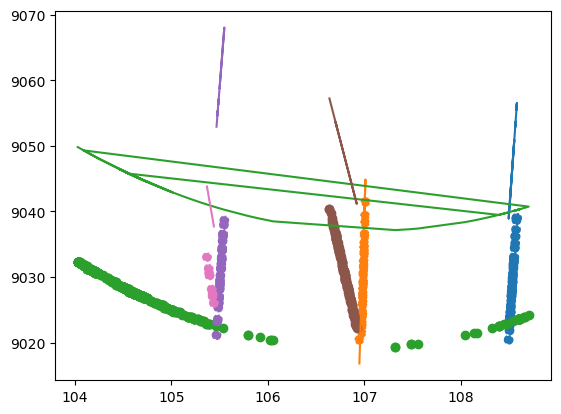

In [ ]:
# dP = -1
# dR = -2.3
# dY = 0.01
HtoMeas = [5, 4, 0, 6, 2, 3, 1]
#MeastoH = [6, 4, 1, 5, 0, 2]

# for lidx,peval in enumerate(pitches_H):
#     if peval.size>0:
#         Hidx = MeastoH[lidx]
#         H = Hquery[Hidx]
#         EBragg = getBragg(np.deg2rad(peval+dP), np.deg2rad(roll+dR), np.deg2rad(dY), H)
#         plt.scatter(pitches_H[lidx],E_H[lidx])
#         plt.plot(peval, EBragg)
for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    # print(lidx)
    # P0 = P0s[lidx]
    peval = pitches_H[lidx]
    
    #dP, dR, Ecorr = res.x

    EBragg,linestyle = HXRSS_singleLine(json.loads(H),peval,[roll],dthp,dthy,dthr,alpha)
    plt.scatter(pitches_H[lidx],E_H[lidx],ls=linestyle)
    plt.plot(peval, EBragg)

#plt.scatter(pitches,Eph_seed,color='red',marker='x')
#plt.ylim(Eph_seed.min(),Eph_seed.max())

### do the actual fit

1
[ 1.3358793  -2.15       -1.47031689 10.        ] 134.13717114426453


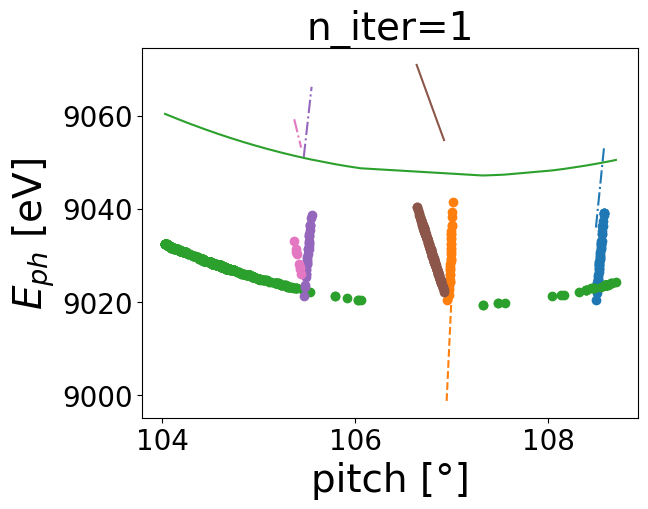

51
[  1.36856699  -2.60998689  -3.39138313 -14.28062672] 18.073250741106463


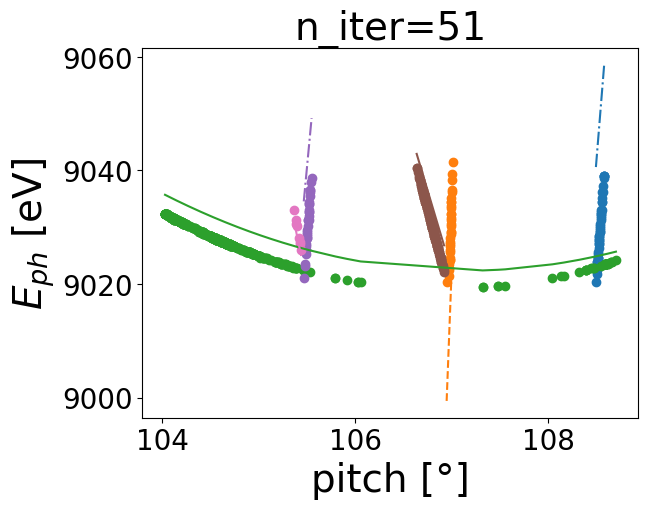

101
[  1.30162625  -2.34288742  -2.33284398 -14.99501292] 12.954282961627364


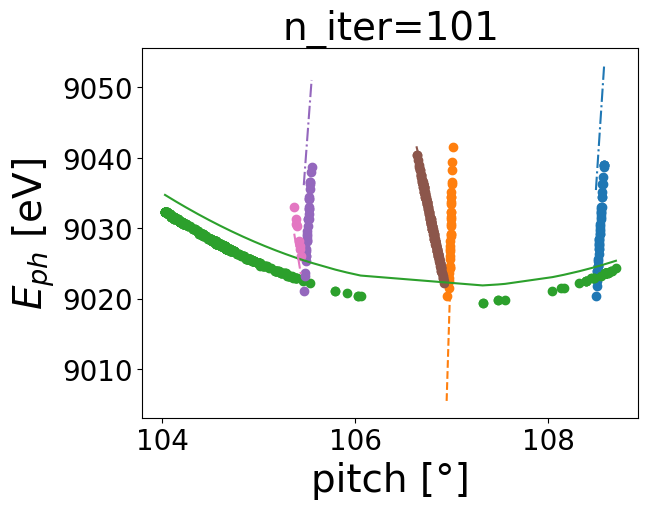

151
[  1.22368845  -1.85630252  -0.61403469 -15.02072055] 3.9396957714540117


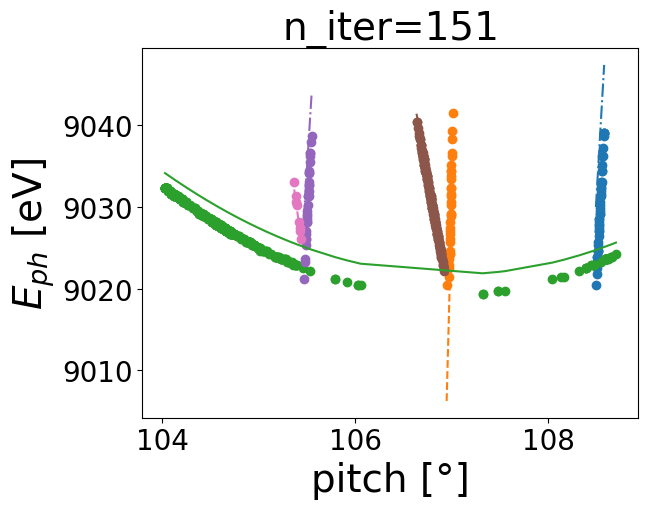

201
[  1.13004141  -1.22286292   1.66275366 -16.28269569] 0.12572521074458184


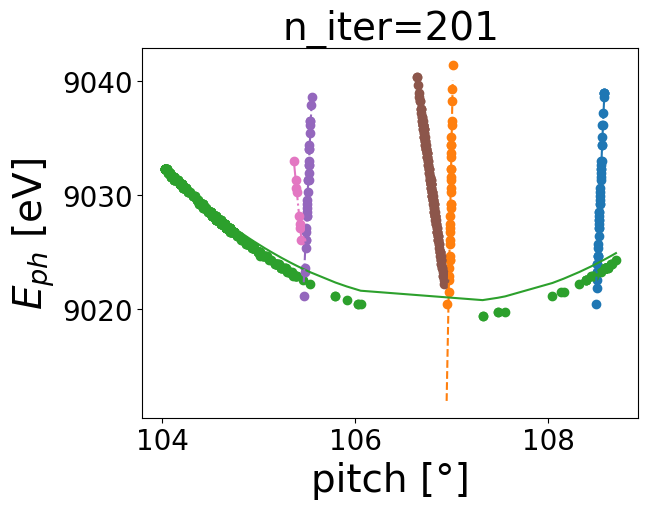

251
[  1.12973348  -1.22016271   1.67293663 -16.34327398] 0.12470701370523715


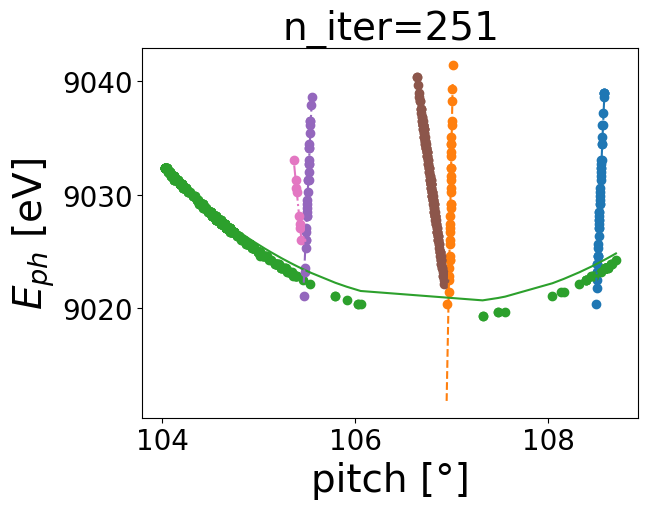

301
[  1.12973404  -1.22017006   1.6729091  -16.34332894] 0.12470701185262141


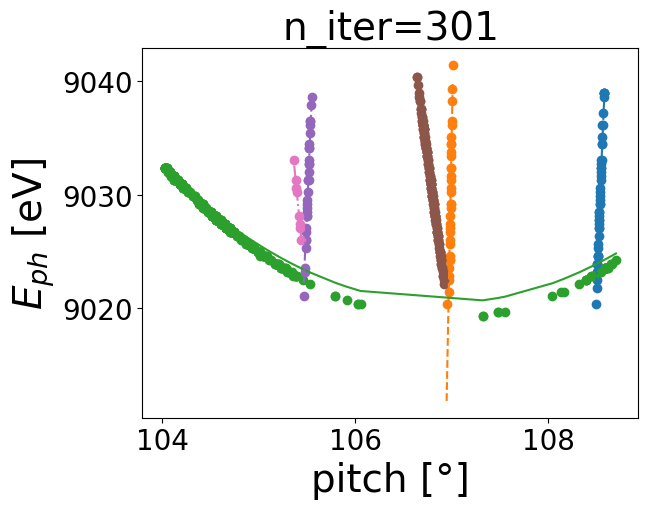

351
[  1.12973404  -1.22017002   1.67290925 -16.34332996] 0.12470701185216156


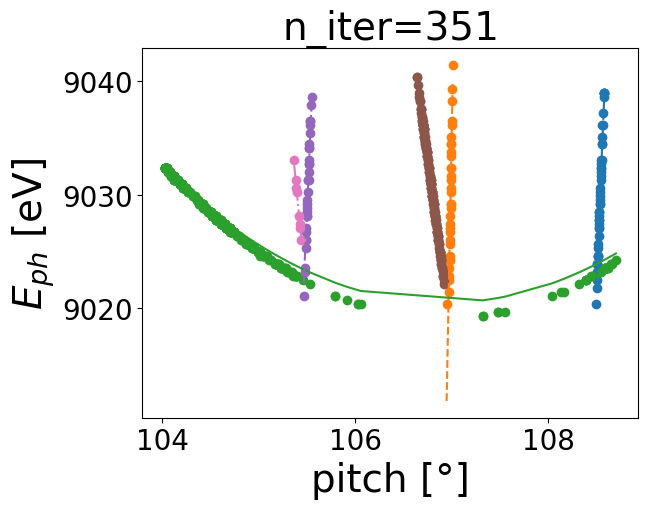

Optimization terminated successfully.
         Current function value: 0.124707
         Iterations: 397
         Function evaluations: 747
398
[  1.12973404  -1.22017002   1.67290925 -16.34332996] 0.12470701185213276


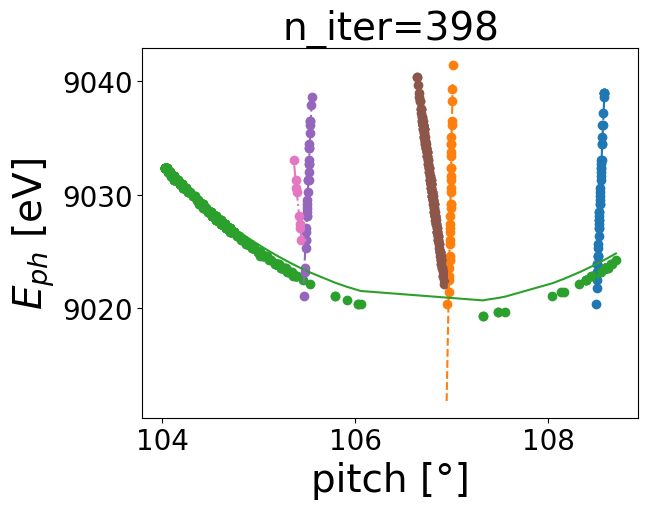

In [ ]:
def optFuncp(dP,dR,dY,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0

    Emid = 0.5*(Eph_seed.min()+Eph_seed.max())
    for Hidx, H in enumerate(Hquery):
        lidx = HtoMeas[Hidx]
        peval = pitches_H[lidx]
        if peval.size>0:
            EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,0)
            EBraggs = np.array(EBraggs) +Ecorr
            cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2
    return 1/cost
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp(x[0],x[1],x[2],x[3])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        #plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery):
            lidx = HtoMeas[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            peval = pitches_H[lidx]
            EBragg,linestyle = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,0)
            EBragg = np.array(EBragg)+Ecorr

            #print(peval_sub.min(),peval_sub.max())
            plt.plot(peval,EBragg,ls=linestyle)
            plt.scatter(peval,E_H[lidx])
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
x0 = np.array([dthp, dthy, dthr, 10])
bounds = ([-3,3],[-5,5],[-10,10],[-50,50])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)

In [ ]:
#dP,dR,dY,Ecorr = res.x
dP,dR,dY,Ecorr = (1.129734040951929,  -1.220170023967058,  1.6729092544963866,  -16.343329955463762)

In [ ]:
# ### plot the individual lines
# dP,dR,dY,Ecorr = [-1.1232266   -2.04977349  -1.77031689 -15.50615063]  #res.x
# fig, axs = plt.subplots(ncols=3,nrows=np.ceil(Hquery.size/3).astype(int),figsize=(12,12),gridspec_kw={'hspace':0.25})
# #dP,dR,dY = intermediate_result.x
# for Hidx, H in enumerate(Hquery):
#         ax = axs.flatten()[Hidx]
#         ax.set_title("H="+str(H),fontsize=24)
#         ax.tick_params(labelsize=18)
#         lidx = HtoMeas[Hidx]

#         #print(lidx)
#         #P0 = P0s[lidx]
#         peval = pitches_H[lidx]
#         EBragg = getBragg(np.deg2rad(peval+dP),np.deg2rad(roll+dR),np.deg2rad(dY),H)+Ecorr
#         #print(peval_sub.min(),peval_sub.max())
#         ax.plot(peval,EBragg)
#         ax.scatter(pitches_H[lidx],E_H[lidx],marker='x',color='red')

ValueError: not enough values to unpack (expected 4, got 1)

0

### use the fit parameters for the other measurements --> not really good

In [ ]:
# for m in range(len(pitch_dict)):#1):#
#     print(m)
#     plt.figure()
#     pitches = pitch_dict[str(m+1)]
#     roll = roll_dict[str(m+1)]
#     Eph_seed = np.array(seeding_energy_dict[str(m+1)])
#     Pitch = np.deg2rad(pitches+dP)
#     bmir.cryst.yaw = np.deg2rad(dY)
#     PreSampling = bmir.BraggCurvesEvsAngles_inRange((Eph_seed.min()-30,Eph_seed.max()+30),PitchRange=[Pitch.min(),Pitch.max()],RollRange=np.deg2rad(roll+dR),numPreSampling=1000)
#     Hquery_i = PreSampling[1]
#     plt.scatter(pitches,Eph_seed,marker='x',color='red')
#     for Hidx, H in enumerate(Hquery_i):
#         #print(lidx)
#         #P0 = P0s[lidx]
        
#         EBragg = getBragg(Pitch,np.deg2rad(roll+dR),np.deg2rad(dY),H)+Ecorr

#         #print(peval_sub.min(),peval_sub.max())
#         plt.plot(pitches,EBragg)
        
#         plt.ylim(Eph_seed.min(),Eph_seed.max())
#     plt.show()

    

## try different model with pitch dependent roll offset

In [ ]:
# def getBragg_wPRcorr(PQuery,RQuery,YQuery,dPR,H):
#     bmir.cryst.yaw = YQuery 
#     EBraggs = np.zeros(PQuery.size)
#     #print(dPR*np.abs(PQuery-np.pi/2).max())
#     for Pidx,P in enumerate(PQuery):
#         bmir.cryst.roll = RQuery + dPR*np.abs(P-np.pi/2)
#         bmir.cryst.pitch = P
#         bmir.cryst.calc_RLab2Cryst()
#         EBraggs[Pidx] = bmir.bragg_wavelength(H=H,exact=False)[1]
#     return EBraggs
# def HtoMeasf_acc(pitches,rolls,E_H,Hquery,dP,dR,dPR,dY,Ecorr):
#     HtoMeas = np.zeros(Hquery.size,dtype=int)
#     for Hidx, H  in enumerate(Hquery):
#         cost = np.ones(len(pitches))*np.inf
#         for lidx in range(len(pitches)):        
#             peval = pitches[lidx]
#             if peval.size>0:
#                 roll = rolls[lidx]
#                 eval = getBragg_wPRcorr(np.deg2rad(peval+dP),np.deg2rad(roll+dR),np.deg2rad(dY),dPR,H) + Ecorr
#                 cost[lidx] = np.sum((E_H[lidx]-eval)**2)/peval.size**2
#         HtoMeas[Hidx] = cost.argmin()
#     return HtoMeas

In [ ]:
#quick estimate on $\alpha$
dR_105 = dR
dR_45 = -0.5
alpha = np.deg2rad(dR_45-dR_105)/np.deg2rad(45-105)
dR0 = dR-alpha*105
print(dR0,alpha)

0.04012751797529379 -0.012002833732784303


In [ ]:
dPconv,dRconv,dYconv,dRPconv,Ecorrconv = (1.129734040951929,  0.0401,  -1.6729092544963866, -0.012, -16.343329955463762)

### repeat the single corr2d fit with pitch dependent $\Delta R$

1
[ 1.12973404e+00  4.01000000e-02 -1.67290925e+00 -1.26000000e-02
 -1.63433300e+01] 965.7139866494764


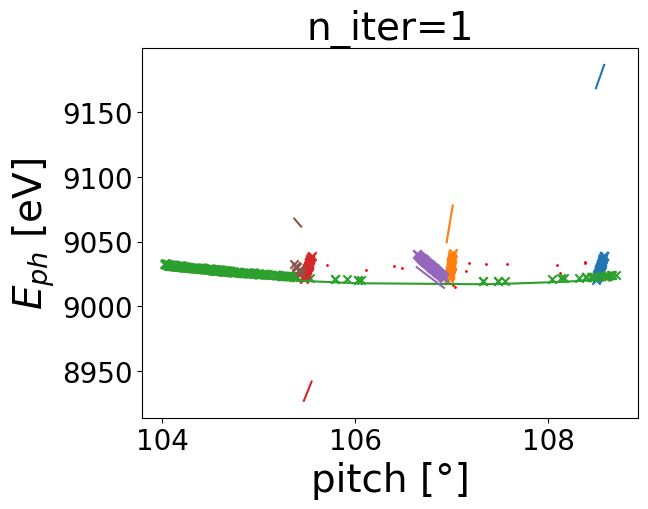

51
[  1.22948423   0.03077595  -1.00293645  -0.01863411 -18.00042897] 2.6968725532649707


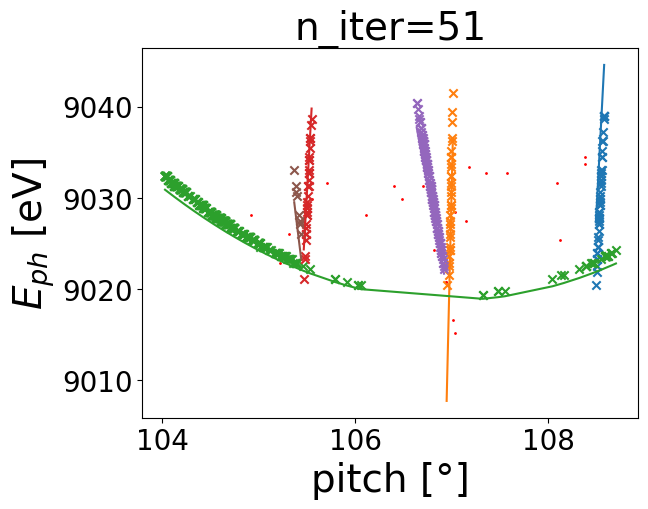

101
[  1.23796219   0.03032342  -1.10004036  -0.01888242 -16.5112747 ] 2.278503112104963


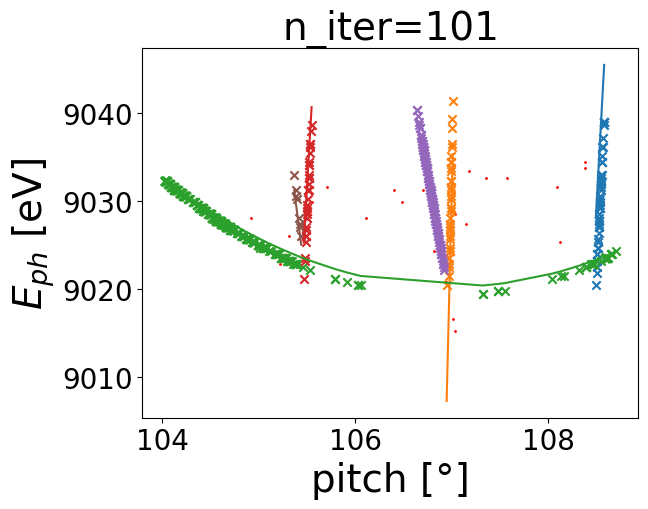

151
[ 1.15647405e+00  5.87231183e-02  7.99915476e-01 -1.42753185e-02
 -1.62249524e+01] 0.15092264574780626


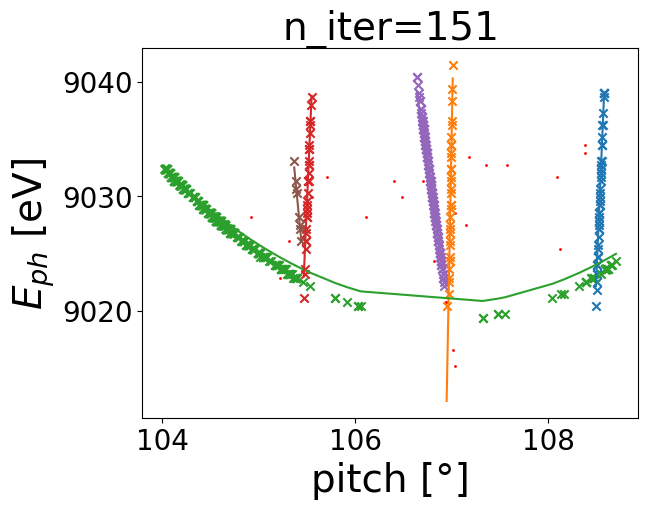

201
[ 1.15230700e+00  6.04985080e-02  9.35756169e-01 -1.39284444e-02
 -1.63443378e+01] 0.12463377310227848


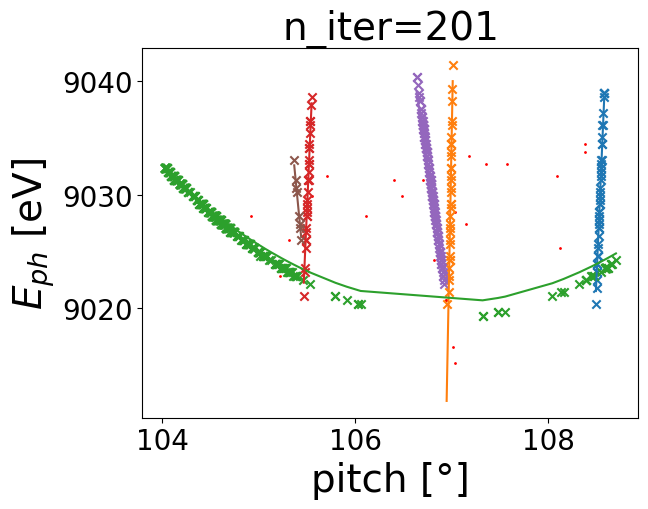

251
[ 1.15235033e+00  6.04786232e-02  9.34281911e-01 -1.39320958e-02
 -1.63462290e+01] 0.12463106503220933


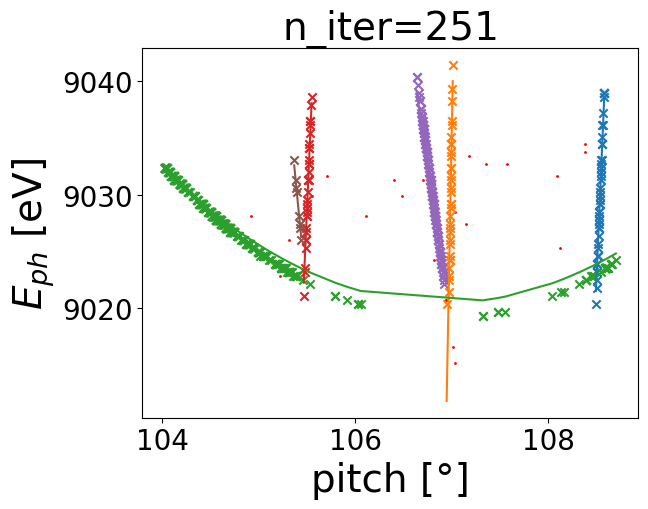

301
[ 1.15235012e+00  6.04787209e-02  9.34291687e-01 -1.39320700e-02
 -1.63462257e+01] 0.12463106470409713


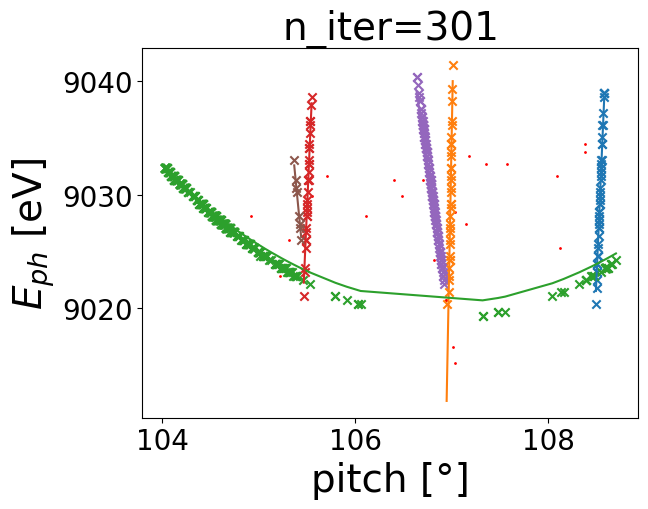

351
[ 1.15235012e+00  6.04787206e-02  9.34291663e-01 -1.39320701e-02
 -1.63462257e+01] 0.1246310647040681


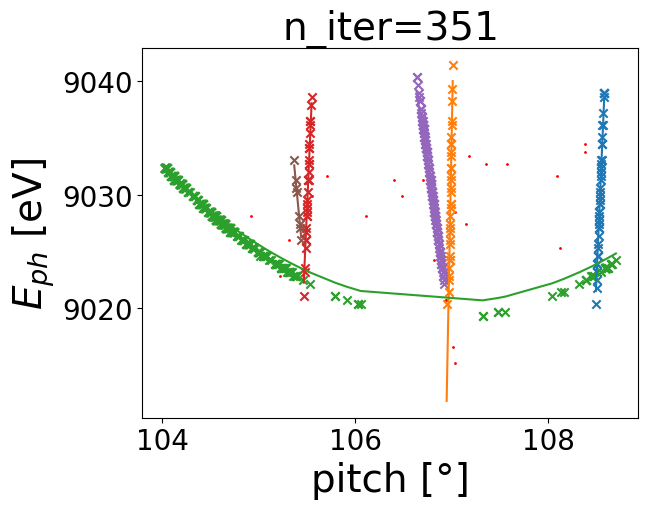

401
[ 1.15235012e+00  6.04787206e-02  9.34291663e-01 -1.39320701e-02
 -1.63462257e+01] 0.1246310647040681


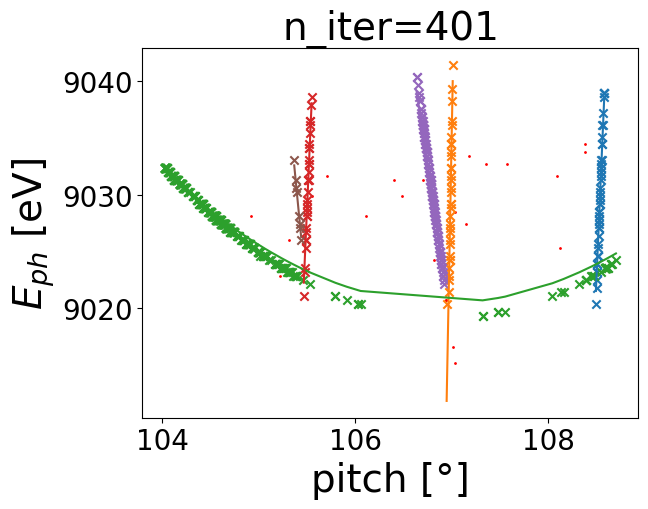

Optimization terminated successfully.
         Current function value: 0.124631
         Iterations: 408
         Function evaluations: 790
409
[ 1.15235012e+00  6.04787206e-02  9.34291663e-01 -1.39320701e-02
 -1.63462257e+01] 0.1246310647040681


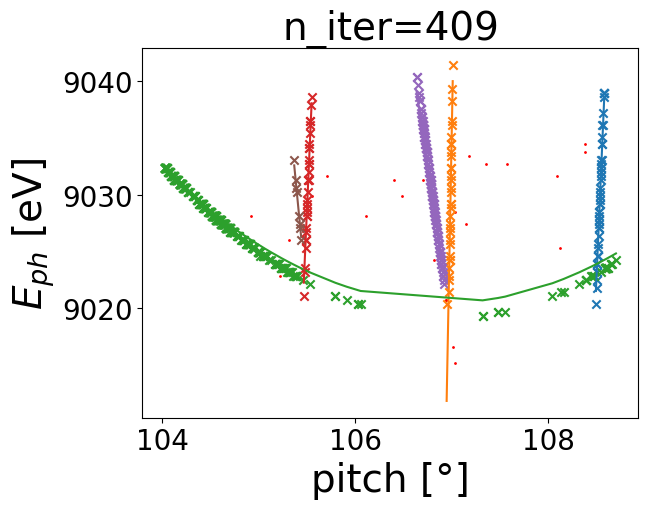

In [ ]:
#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0

    for Hidx, H in enumerate(Hquery):
        lidx = HtoMeas[Hidx]
        peval = pitches_H[lidx]
        if peval.size>0:
            EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
            EBraggs = np.array(EBraggs) +Ecorr
            cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2
    return 1/cost
  
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery):
            lidx = HtoMeas[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            peval = pitches_H[lidx]
            if peval.size>0:
                EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                EBragg = np.array(EBragg) +Ecorr

            #print(peval_sub.min(),peval_sub.max())
                plt.scatter(peval,E_H[lidx],marker='x')
                plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
x0 = np.array([dPconv, dRconv, dYconv, dRPconv, Ecorrconv])
bounds = ([-3,3],[-5,5],[-10,10],[-5,5],[-50,50])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
dPconv,dRconv,dYconv,dRP_conv,Ecorr_conv = res.x

In [ ]:
dPconv, dRconv, dYconv, dRPconv, Ecorrconv = [ 1.15235012e+00,  6.04787206e-02 ,9.34291663e-01, -1.39320701e-02, -1.63462257e+01]

## add points for different crossing, ranges etc. to it

In [ ]:
#start with current fix=3
pitch_acc = pitches_H
E_H_acc = E_H
roll_acc = [roll for idx in range(len(pitch_acc))]

NameError: name 'E_H' is not defined

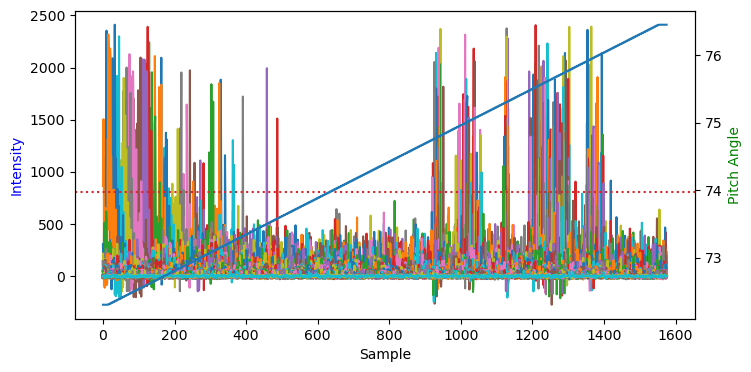

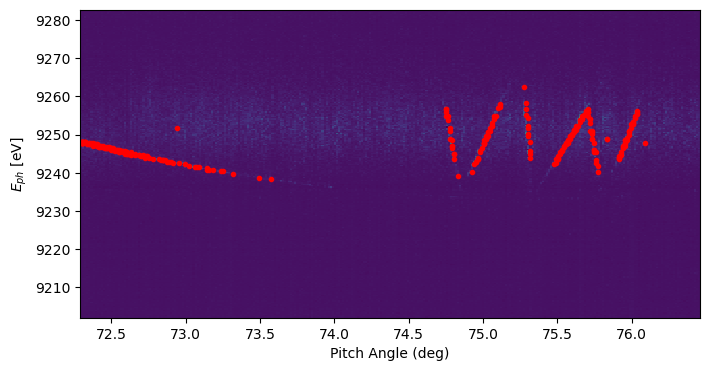

In [ ]:
fidx = 12
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()



doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
thresh = tt['spec_hist'].max()/3
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()

# filter_arr = []
# seeding_energy = []
# en = 0
# x = tt['phen_scale']
# for spectrum in tt['spec_hist']:

#     if np.max(spectrum) > thresh and x[np.argmax(spectrum)]>9230 and x[np.argmax(spectrum)]<9270: ## Adjust this number to adjust threshold 
#         filter_arr.append(True)
#         seeding_energy.append(x[np.argmax(spectrum)]+en)
#     else:
#         filter_arr.append(False)


# pitch = tt['doocs_vals_hist'][filter_arr]
# seeding_energy_dict[str(fidx)] = seeding_energy
# pitch_dict[str(fidx)] = pitch
# Plot extracted lines
seeding_energy = seeding_energy_dict[str(fidx)]
pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,tt['phen_scale'] ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()


#### select by hand

2.299999952316284

In [ ]:
fidx = 12
pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
roll = roll_dict[str(fidx)]
#bmir.cryst.yaw = np.deg2rad(dY)
#Pitch = np.deg2rad(pitches)
Hquery = Hquery_dict[str(fidx)]
print(Hquery)

['[0, 2, 2]', '[1, -3, 3]', '[1, -1, 5]', '[1, 1, -5]', '[1, 1, 1]', '[1, 3, -3]', '[2, 2, -4]', '[3, 1, -3]']


In [ ]:
%matplotlib widget

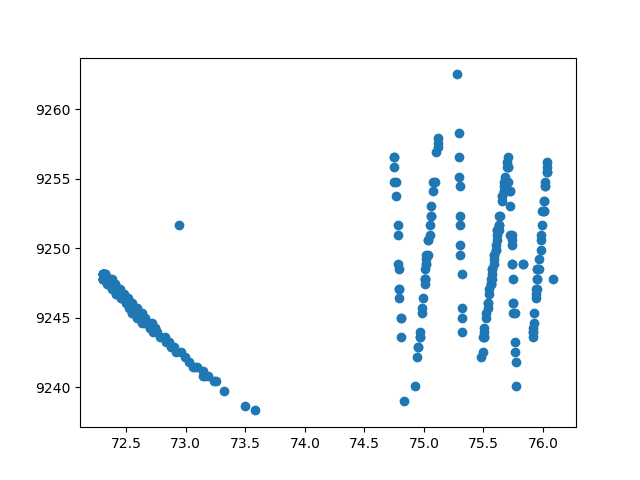

Selected points for Group 1: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127]
Switched to Group 2
Selected points for Group 2: [128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143]
Switched to Group 3
Selected points for Group 3: [145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178]
Switched to Group 4
Selected points for Group 4: [179 180 181 182 183 184 185 186 187 188 189 190 191]
Switched to Group 5
Selected points for Group 5:

In [ ]:
fig, ax = plt.subplots()
scatter = ax.scatter(pitches, Eph_seed,picker=True)

# Interactive point selection
#cursor = mplcursors.cursor(sc, hover=True)
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label: [] for label in group_labels}

current_group_idx = 0
deselect_mode = False

# Function to change the color of the selected points based on the current group
def update_point_colors(selected, colors):
    scatter.set_facecolor(['gray'] * len(pitches))  # Reset all points to default color
    for idx, (group, points) in enumerate(selected_points_by_group.items()):
        if points:
            color = group_colors[idx]
            selected_points = np.array(points)
            scatter._facecolors[selected_points[:].astype(int)]=np.repeat([mcolors.to_rgba(color)],selected_points.shape[0],axis=0)
            # scatter._facecolors[selected_points[:, 0].astype(int)] = mcolors.to_rgb(color)
    fig.canvas.draw()

# Function to handle point selection with lasso
def onselect_lasso(verts):
    global current_group_idx
    path = Path(verts)
    selected = path.contains_points(np.column_stack((pitches, Eph_seed)))
    selected_indices = np.where(selected)[0]

    for i in selected_indices:
        if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
            del selected_points_by_group[group_labels[current_group_idx]][i]
        elif not deselect_mode:  # Select point if 'd' is not pressed
            selected_points_by_group[group_labels[current_group_idx]].append(i)

    print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
    update_point_colors(selected_indices, group_colors)

def on_pick(event):
    if event.mouseevent.button == 1:
        selected_indices = event.ind
        for i in selected_indices:
            if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
                loc_idx = np.where(selected_points_by_group[group_labels[current_group_idx]]==i)
                print(loc_idx[0][0])
                del selected_points_by_group[group_labels[current_group_idx]][loc_idx[0][0]]
            elif not deselect_mode:  # Select point if 'd' is not pressed
                selected_points_by_group[group_labels[current_group_idx]].append(i)
        #print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
        update_point_colors(selected_indices, group_colors)
    # xdata = x[ind[0]]
    # ydata = y[ind[0]]

    
    #xdata, ydata = line.get_data()
    #ind = event.ind
    
    #print(f'on pick line: {xdata[ind]}, {ydata[ind]}')

cid = fig.canvas.mpl_connect('pick_event', on_pick)

# Lasso and Rectangle selectors
lasso = LassoSelector(ax, onselect_lasso)


# Function to handle key press events (switch groups with 'n' or 'p')
def on_key(event):
    global current_group_idx, deselect_mode
    if event.key == 'n':  # Switch to the next group on pressing 'n'
        current_group_idx = (current_group_idx + 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'm' and current_group_idx>1:  # Switch to the previous group on pressing 'p'
        current_group_idx = (current_group_idx - 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'd':  # Switch deselect mode
        if deselect_mode:
            deselect_mode = False
            print("Switched off deselect mode")
        else:
            deselect_mode = True
            print("Switched on deselect mode")

    

# Connect the key press event
fig.canvas.mpl_connect('key_press_event', on_key)

plt.show()

In [ ]:
%matplotlib inline

0 : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127]
1 : [128, 129, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143]
2 : [145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178]
3 : [179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191]
4 : [192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 

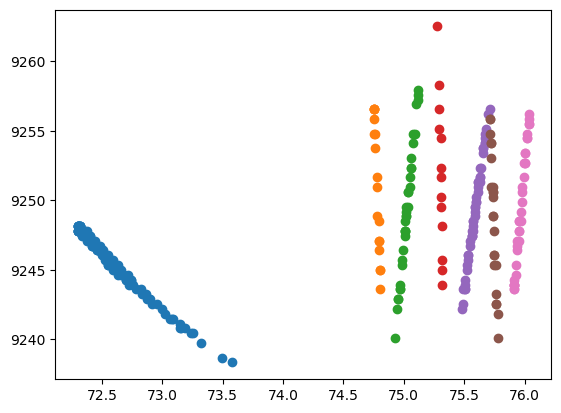

In [ ]:

pitches_H = []
E_H = []
plt.figure()
for lidx, points in enumerate(selected_points_by_group.values()):
    
    pitches_H.append(pitches[points].squeeze())
    E_H.append(Eph_seed[points].squeeze())
    print(lidx,':',points)
    # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
    plt.scatter(pitches_H[lidx],E_H[lidx])
plt.show()

In [ ]:
# pitch_acc += pitches_H
# E_H_acc += E_H
# roll_acc += [roll for idx in range(len(pitch_acc))]

#### compare with simulated lines and assert Hplanes

ValueError: operands could not be broadcast together with shapes (1000,) (1903,) 

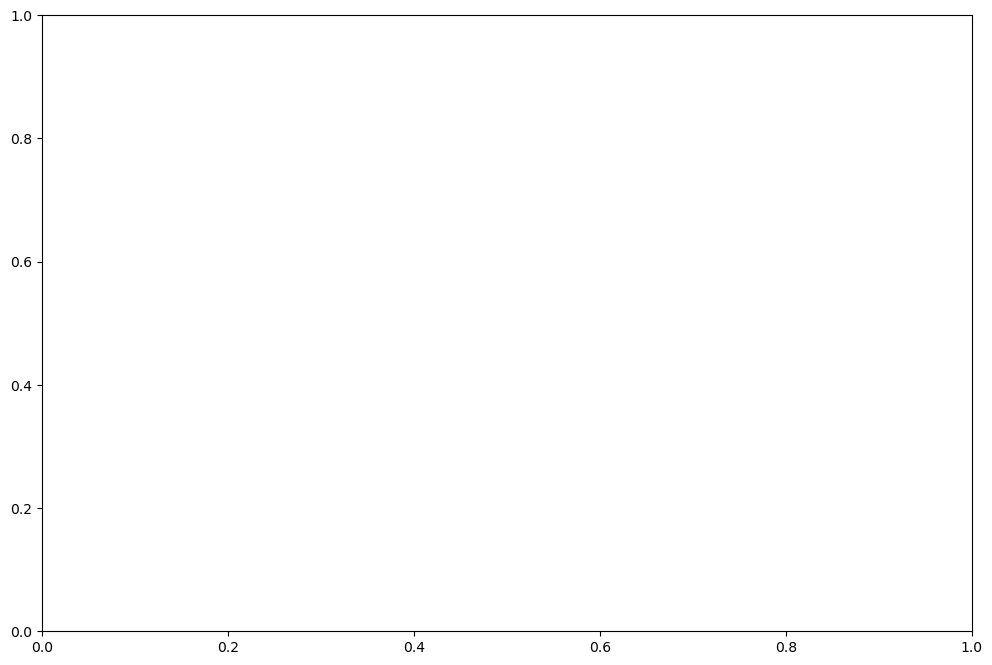

In [ ]:
# dPconv, dRconv, dYconv, dRPconv, Ecorrconv =  [2.41322609e+00, -5.00000000e+00, -9.33453740e+00, -9.44353028e-03,  4.65311758e+01]
# dPconv, dRconv, dYconv, dRPconv, Ecorrconv = [1.15235012e+00,  6.04787206e-02,  9.34291663e-01, -1.39320701e-02, -1.63462257e+01]
dPconv, dRconv, dYconv, dRPconv, Ecorrconv=[0.55665728, -1.54318923, -2.18807843,  0.02009495,  1.04564738]
#[ 1.4,  -2.3 ,0.2, 0, -1.63462257e+01]
pitch_list = np.linspace(min(pitches),max(pitches),1000) 
RollQuery = np.deg2rad(np.linspace(-3,3,9))
# phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dPconv, dRconv, dYconv, dRPconv, roll, pitch_list)
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll],dPconv,dRconv,dYconv,dRPconv)
    EBragg = np.array(EBragg) + Ecorrconv
    plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
for lidx,pitchi in enumerate(pitches_H):
        if pitchi.size>0:
            ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)
plt.ylim(min(Eph_seed)-400,max(Eph_seed)+400)


# fig, ax = plt.subplots(figsize=(10,6))
# #plt.plot(pitch, seed_energy, 'r.')

# for phen, pangle, gid in zip(phen_list, p_angle_list, gid_list):
#         ph_axis, pa_axis = [], []
#         for ph_value, pa_value in zip(phen, pangle):
#             # Only keep photon energies within a close range of the spectrometer image range
#             if ph_value > np.min(Eph_seed)-150 and ph_value < np.max(Eph_seed)+140 and pa_value >= min(pitch_list)-1 and pa_value <= max(pitch_list)+1:
#                 ph_axis.append(ph_value+Ecorr)
#                 pa_axis.append(pa_value)
                
#         if ph_axis == []:
#             pass
#         else:
#             plt.plot(pa_axis, ph_axis, '--', label=gid)

# for lidx,pitchi in enumerate(pitches_H):
#         if pitchi.size>0:
#             ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx],label=group_labels[lidx])
# plt.legend(ncols=2)

# Pitch = np.deg2rad(np.array([p for parray in pitches_H for p in parray]))

# RollQuery = np.deg2rad(np.linspace(-1.5,1.5,9))
# Yaw = np.deg2rad(dYconv)
# bmir.cryst.yaw = Yaw
# dPi = dPconv
# Eoffset = -Ecorrconv
# EBragg = np.zeros((RollQuery.size,Pitch.size,Hquery.size))
# for Ridx, Roll in enumerate(RollQuery):
#     bmir.cryst.roll = Roll+np.deg2rad(roll+dRconv)
#     for Pidx,P in enumerate(Pitch):
#         bmir.cryst.pitch = P+np.deg2rad(dPi)
#         for Hidx,H in enumerate(Hquery):
#             bmir.initialize()
#             EBragg[Ridx,Pidx,Hidx] = bmir.bragg_wavelength(H=H)[1]-Eoffset

# # now parse 
# fig_parse, axs = plt.subplots(nrows=3,ncols=3,tight_layout=True,figsize=(15,12))
# ylims = np.array([Eph_seed.min(),Eph_seed.max()])
# #ylims = [-0.25,0.25]
# for idx, ax in enumerate(axs.flatten()):
#     #Ridx = idx*int((Roll.size-1)/8)
#     ax.tick_params(labelsize=28)
#     ax.grid()
#     ax.set_title("Roll = {:.2f}°".format(np.rad2deg(RollQuery[idx])),fontsize=32)
#     if idx%3>0:
#         ax.tick_params(labelleft=False)
#     if idx<6:
#         ax.tick_params(labelbottom=False)
#         #ax.set_xlabel("$\\Delta E$[meV]",fontsize=32)
#     for lidx, peval in enumerate(pitches_H):
#         ax.scatter(peval,E_H[lidx])
#     for Hidx in range(Hquery.shape[0]):
        
#         ax.plot(np.rad2deg(Pitch),EBragg[idx,:,Hidx].squeeze(),label=str(Hquery[Hidx]))
#         #ax.fill_between((Pitch-np.pi/2)*1E3,(E_Hs[Ridx,:,Hidx]*(1+bw_Hs[Ridx,:,Hidx,0])).squeeze()-bmir.E_c,(E_Hs[Ridx,:,Hidx]*(1+bw_Hs[Ridx,:,Hidx,1])).squeeze()-bmir.E_c)

#     ax.set_ylim(ylims)
#     #ax.set_xlim((Pitch[0]-np.pi/2)*1E3,(Pitch[-1]-np.pi/2)*1E3)
# axs[2,1].set_xlabel("Pitch [°]",fontsize=32)
# axs[1,0].set_ylabel("$\\Delta E$ [eV]",fontsize=32)
# axs[0,0].legend()

In [ ]:
#HtoMeas = [5,None,None,0,3,6,4,2]
HtoMeas = [5,None,None,None,None,None,None,2]

### try to fit

1
[ 0.00015  0.00015  0.00015 -0.0005   0.00015] 1347.3667337114052


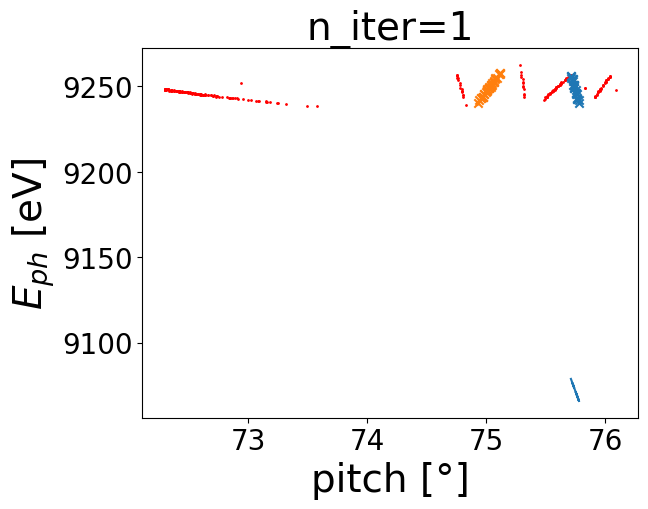

51
[ 0.00495918 -0.00055063  0.00419724 -0.01382336  0.00250717] 147.6523022747369


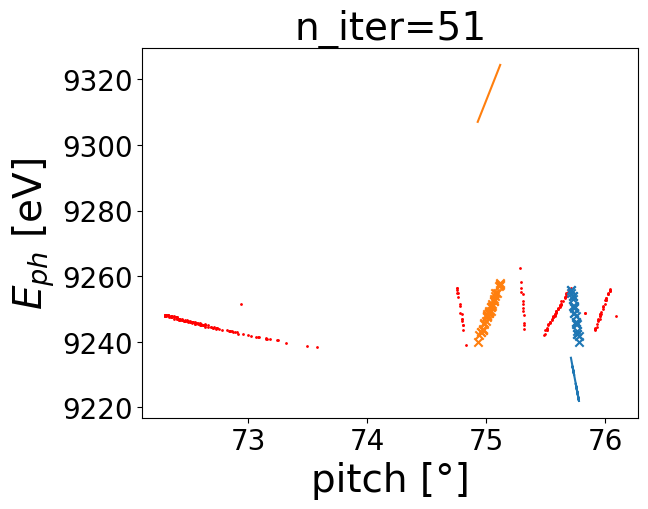

101
[ 0.14754809 -0.09945218 -0.0626961  -0.01229918  0.08373479] 89.72441607582046


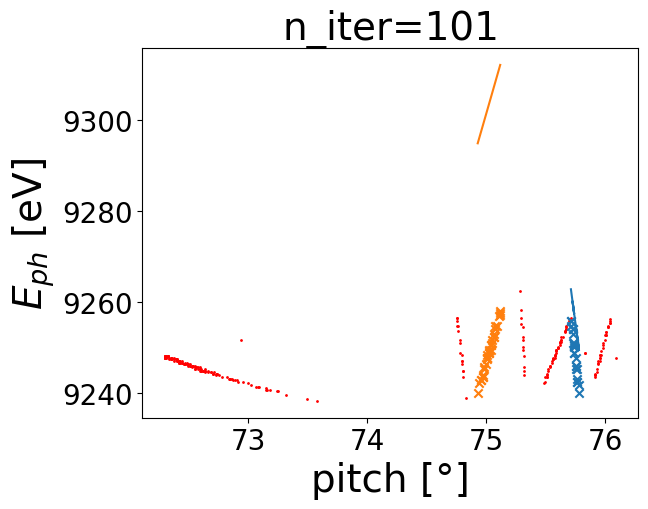

151
[ 0.4485247  -0.30945218 -0.20309754 -0.00348273  0.25437824] 0.06469881462045964


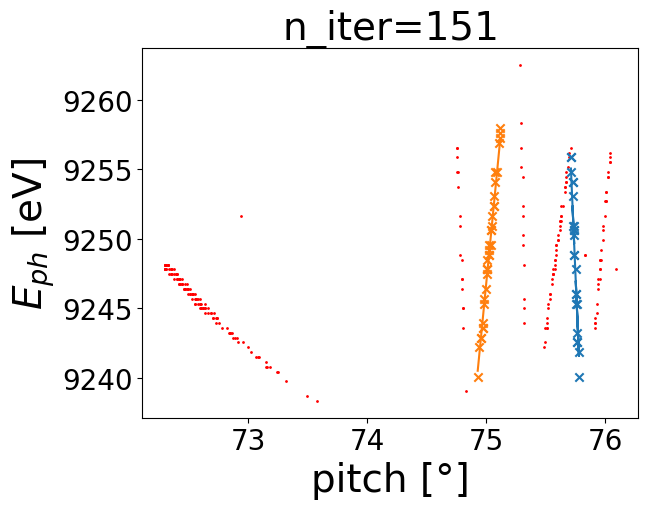

201
[ 0.44714863 -0.30849189 -0.20245447 -0.00351672  0.25359603] 0.06326775865504479


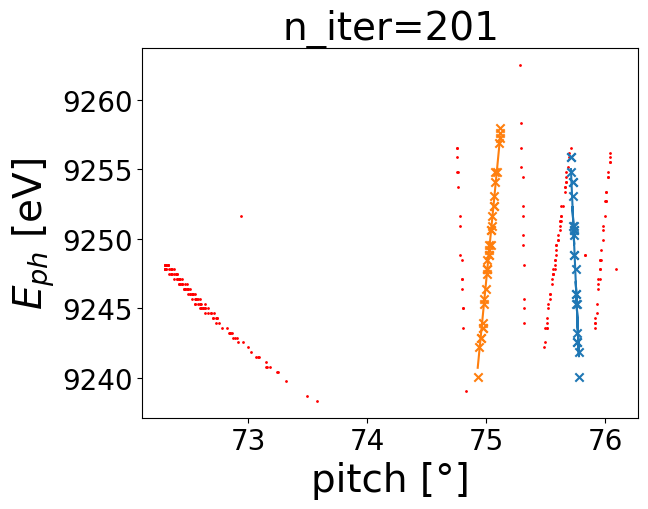

251
[ 0.44714762 -0.3084912  -0.20245401 -0.00351671  0.25359546] 0.06326775285297247


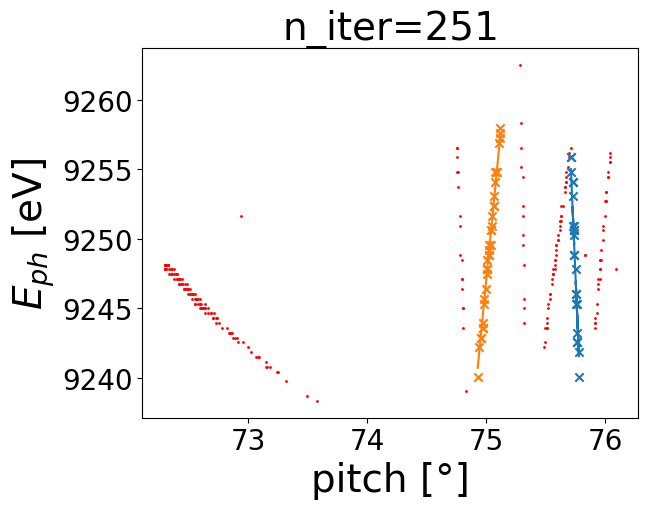

301
[ 0.44714526 -0.30851842 -0.20250107 -0.00351632  0.25361231] 0.06326764825091462


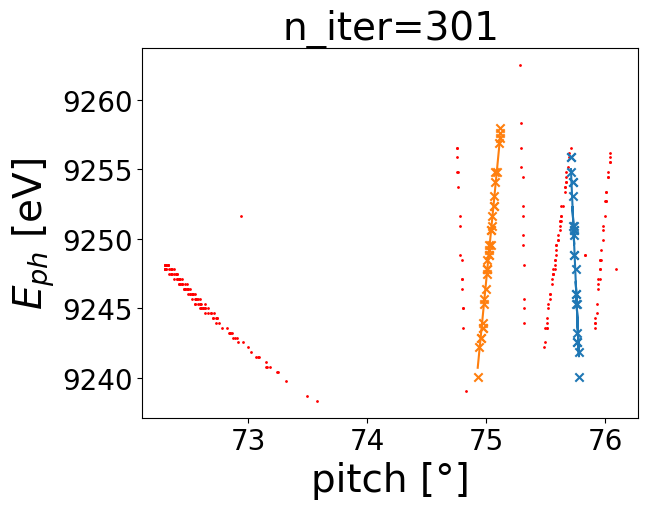

351
[ 0.44744439 -0.31116314 -0.20670793 -0.00346608  0.25531727] 0.06325897222217862


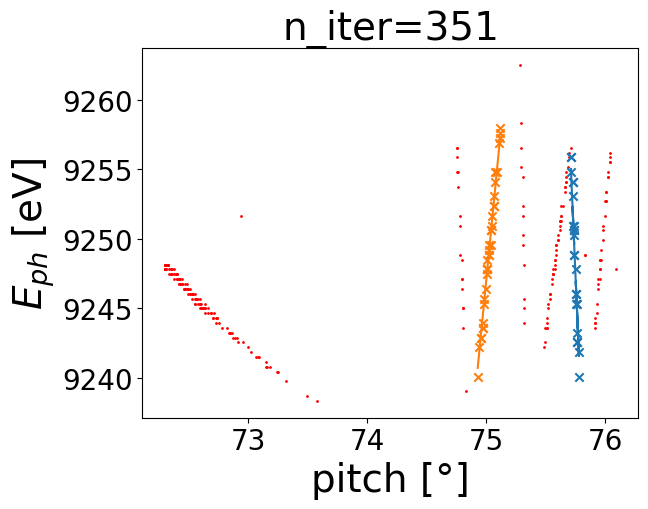

401
[ 0.48412564 -0.70496401 -0.83874589  0.00404373  0.50816754] 0.06167384051438744


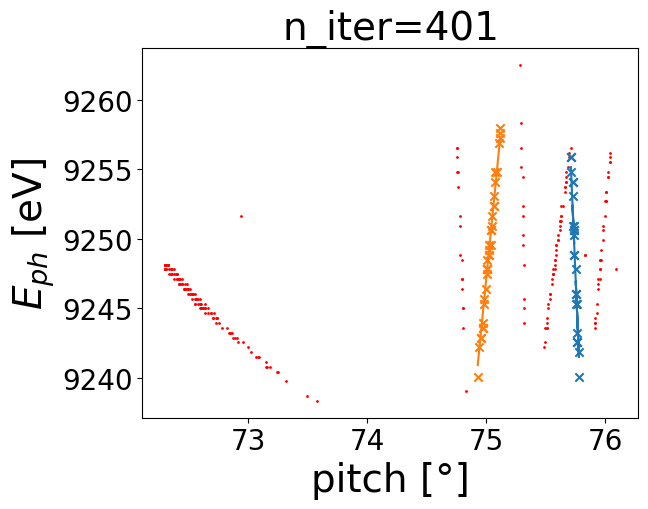

451
[ 0.51934318 -1.10136778 -1.47619308  0.01162011  0.76246669] 0.060821987909570226


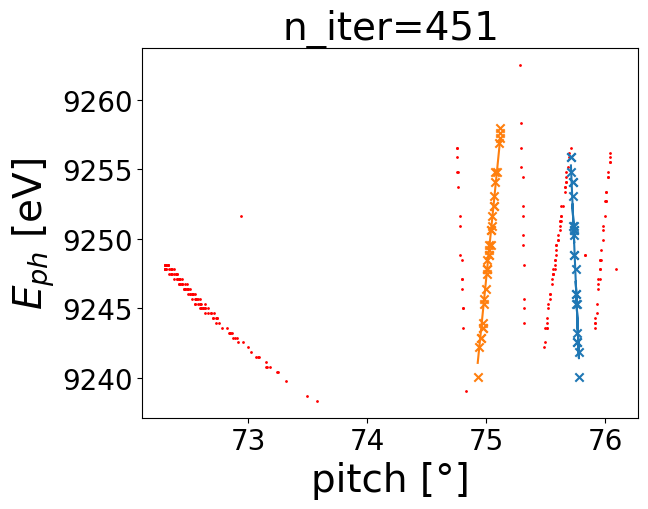

501
[ 0.55655255 -1.54158109 -2.18546532  0.02006418  1.04462068] 0.05996232925951536


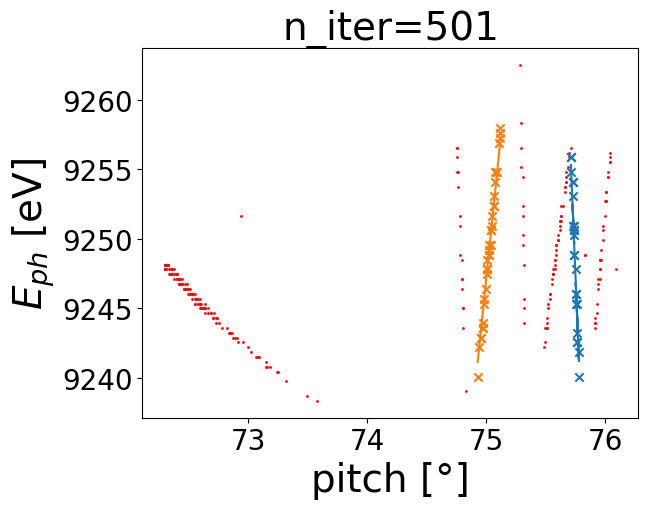

551
[ 0.55666593 -1.54329557 -2.18825001  0.02009699  1.04571549] 0.05996138303030867


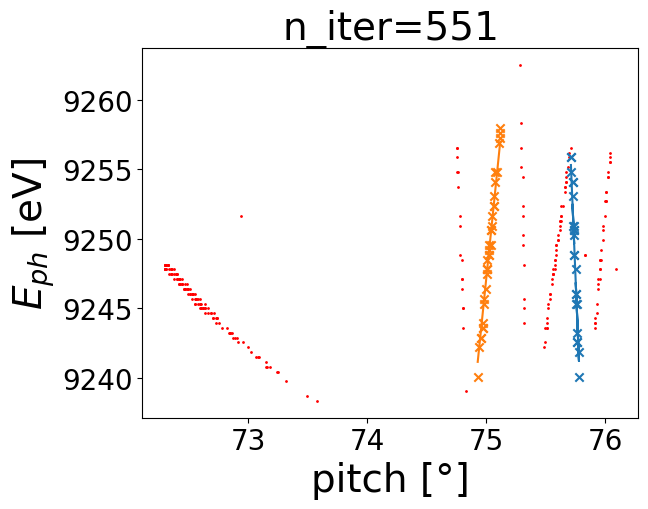

601
[ 0.55665728 -1.54318923 -2.18807843  0.02009495  1.04564738] 0.05996138300490381


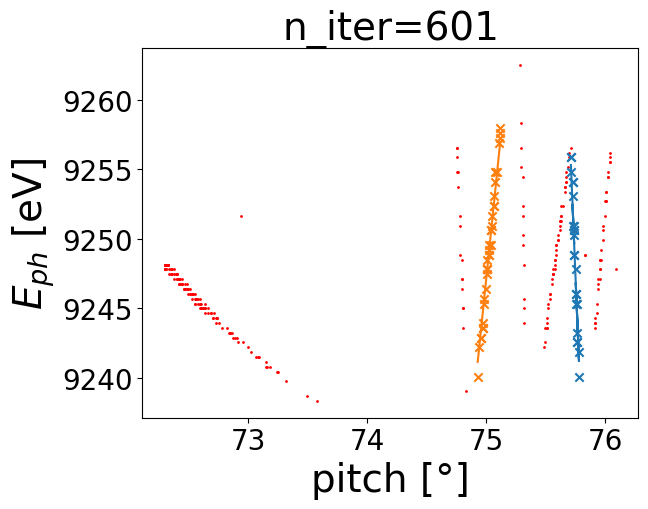

651
[ 0.55665728 -1.54318923 -2.18807843  0.02009495  1.04564738] 0.05996138300490244


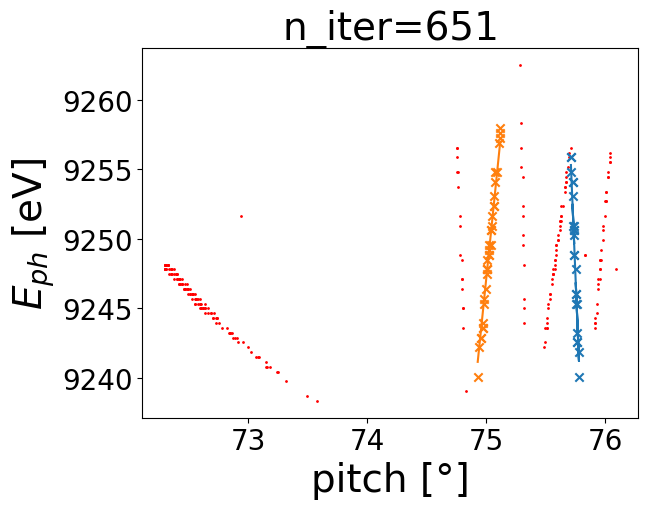

701
[ 0.55665728 -1.54318923 -2.18807843  0.02009495  1.04564738] 0.059961383004885314


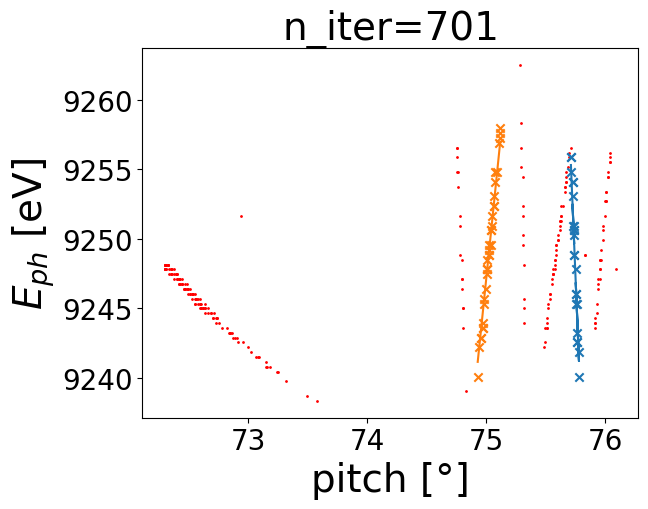

Optimization terminated successfully.
         Current function value: 0.059961
         Iterations: 707
         Function evaluations: 1286
708
[ 0.55665728 -1.54318923 -2.18807843  0.02009495  1.04564738] 0.05996138300488457


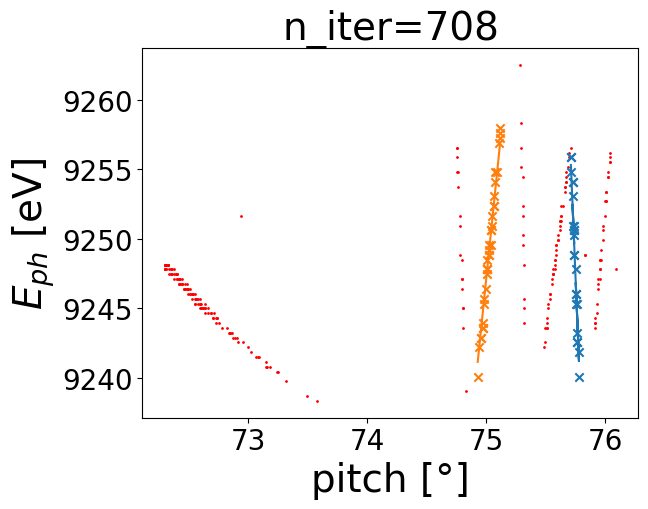

In [ ]:
#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0

    for Hidx, H in enumerate(Hquery):
        lidx = HtoMeas[Hidx]
        if lidx is not None:
            peval = pitches_H[lidx]
            if peval.size>0 :
                EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                EBraggs = np.array(EBraggs) +Ecorr
                cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2
    return 1/cost
  
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery):
            lidx = HtoMeas[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            if lidx is not None:
                peval = pitches_H[lidx]
                if peval.size>0:
                    EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                    EBragg = np.array(EBragg) +Ecorr

            #print(peval_sub.min(),peval_sub.max())
                    plt.scatter(peval,E_H[lidx],marker='x')
                    plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
x0 = np.array([0, 0, 0, 0, 0])
bounds = ([-4,4],[-10,10],[-10,10],[-1,1],[-50,50])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
dPconv,dRconv,dYconv,dRP_conv,Ecorr_conv = res.x

In [ ]:
pitches_H

[array([72.30010223, 72.30010223, 72.30010223, 72.30010223, 72.30010223,
        72.30010223, 72.30010223, 72.30010223, 72.30010223, 72.30010223,
        72.30789948, 72.30789948, 72.30789948, 72.30789948, 72.32150269,
        72.32150269, 72.32150269, 72.32150269, 72.3348999 , 72.3348999 ,
        72.34850311, 72.34850311, 72.34850311, 72.34850311, 72.36199951,
        72.36199951, 72.37539673, 72.37539673, 72.37539673, 72.38899994,
        72.38899994, 72.40239716, 72.40239716, 72.40239716, 72.40239716,
        72.41590118, 72.41590118, 72.41590118, 72.41590118, 72.41590118,
        72.42949677, 72.42949677, 72.44300079, 72.44300079, 72.44300079,
        72.44300079, 72.45639801, 72.45639801, 72.47000122, 72.47000122,
        72.47000122, 72.47000122, 72.48349762, 72.48349762, 72.49690247,
        72.49690247, 72.49690247, 72.51049805, 72.51049805, 72.51049805,
        72.52390289, 72.52390289, 72.52390289, 72.53749847, 72.53749847,
        72.5510025 , 72.5510025 , 72.5510025 , 72.5

## add points for different crossing, ranges etc. to it (scan # 6)

In [ ]:
#start with current fix=3
pitch_acc = pitches_H
E_H_acc = E_H
roll_acc = [roll for idx in range(len(pitch_acc))]
Hquery_acc = Hquery

NameError: name 'E_H' is not defined

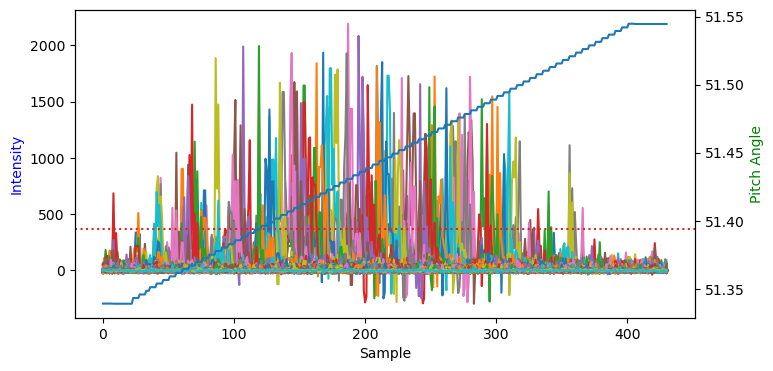

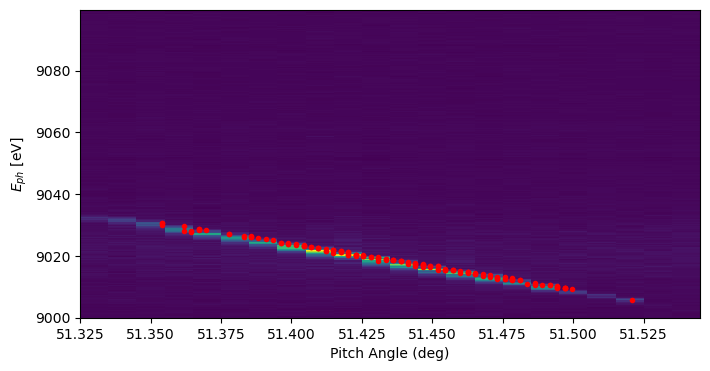

In [ ]:
fidx = 6
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()



doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()

# filter_arr = []
# seeding_energy = []
# en = 0
# x = tt['phen_scale']
# for spectrum in tt['spec_hist']:

#     if np.max(spectrum) > thresh and x[np.argmax(spectrum)]>9230 and x[np.argmax(spectrum)]<9270: ## Adjust this number to adjust threshold 
#         filter_arr.append(True)
#         seeding_energy.append(x[np.argmax(spectrum)]+en)
#     else:
#         filter_arr.append(False)


# pitch = tt['doocs_vals_hist'][filter_arr]
# seeding_energy_dict[str(fidx)] = seeding_energy
# pitch_dict[str(fidx)] = pitch
# Plot extracted lines
seeding_energy = seeding_energy_dict[str(fidx)]
pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,tt['phen_scale'] ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()


#### select by hand

In [ ]:
#fidx = 12
pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
roll = roll_dict[str(fidx)]
#bmir.cryst.yaw = np.deg2rad(dY)
#Pitch = np.deg2rad(pitches)
Hquery = Hquery_dict[str(fidx)]
Hquery_acc += Hquery
print(Hquery_acc)

NameError: name 'Hquery_acc' is not defined

In [ ]:
%matplotlib widget

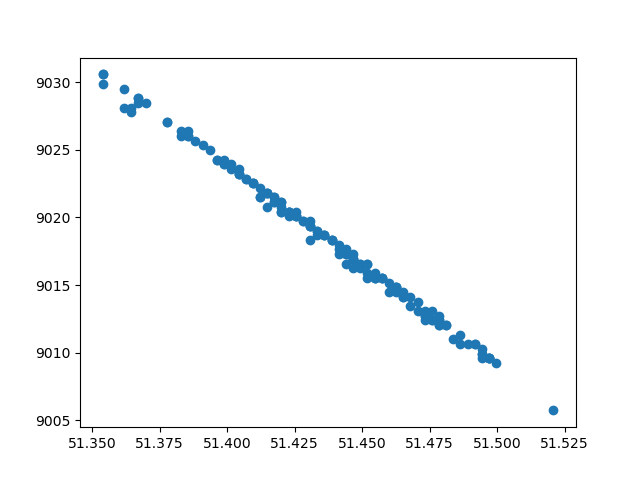

Selected points for Group 1: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146]


In [ ]:
fig, ax = plt.subplots()
scatter = ax.scatter(pitches, Eph_seed,picker=True)

# Interactive point selection
#cursor = mplcursors.cursor(sc, hover=True)
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label: [] for label in group_labels}

current_group_idx = 0
deselect_mode = False

# Function to change the color of the selected points based on the current group
def update_point_colors(selected, colors):
    scatter.set_facecolor(['gray'] * len(pitches))  # Reset all points to default color
    for idx, (group, points) in enumerate(selected_points_by_group.items()):
        if points:
            color = group_colors[idx]
            selected_points = np.array(points)
            scatter._facecolors[selected_points[:].astype(int)]=np.repeat([mcolors.to_rgba(color)],selected_points.shape[0],axis=0)
            # scatter._facecolors[selected_points[:, 0].astype(int)] = mcolors.to_rgb(color)
    fig.canvas.draw()

# Function to handle point selection with lasso
def onselect_lasso(verts):
    global current_group_idx
    path = Path(verts)
    selected = path.contains_points(np.column_stack((pitches, Eph_seed)))
    selected_indices = np.where(selected)[0]

    for i in selected_indices:
        if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
            del selected_points_by_group[group_labels[current_group_idx]][i]
        elif not deselect_mode:  # Select point if 'd' is not pressed
            selected_points_by_group[group_labels[current_group_idx]].append(i)

    print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
    update_point_colors(selected_indices, group_colors)

def on_pick(event):
    if event.mouseevent.button == 1:
        selected_indices = event.ind
        for i in selected_indices:
            if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
                loc_idx = np.where(selected_points_by_group[group_labels[current_group_idx]]==i)
                print(loc_idx[0][0])
                del selected_points_by_group[group_labels[current_group_idx]][loc_idx[0][0]]
            elif not deselect_mode:  # Select point if 'd' is not pressed
                selected_points_by_group[group_labels[current_group_idx]].append(i)
        #print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
        update_point_colors(selected_indices, group_colors)
    # xdata = x[ind[0]]
    # ydata = y[ind[0]]

    
    #xdata, ydata = line.get_data()
    #ind = event.ind
    
    #print(f'on pick line: {xdata[ind]}, {ydata[ind]}')

cid = fig.canvas.mpl_connect('pick_event', on_pick)

# Lasso and Rectangle selectors
lasso = LassoSelector(ax, onselect_lasso)


# Function to handle key press events (switch groups with 'n' or 'p')
def on_key(event):
    global current_group_idx, deselect_mode
    if event.key == 'n':  # Switch to the next group on pressing 'n'
        current_group_idx = (current_group_idx + 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'm' and current_group_idx>1:  # Switch to the previous group on pressing 'p'
        current_group_idx = (current_group_idx - 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'd':  # Switch deselect mode
        if deselect_mode:
            deselect_mode = False
            print("Switched off deselect mode")
        else:
            deselect_mode = True
            print("Switched on deselect mode")

    

# Connect the key press event
fig.canvas.mpl_connect('key_press_event', on_key)

plt.show()

In [ ]:
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label: [] for label in group_labels}

selected_points_by_group['Group 1'] = [  0,   1,   2,   3,  4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,   24,  25,  26,   27,  28, 29, 30, 31, 32, 33, 34, 35,  36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125, 126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146]

In [ ]:
%matplotlib inline

0 : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146]
1 : []
2 : []
3 : []
4 : []
5 : []
6 : []


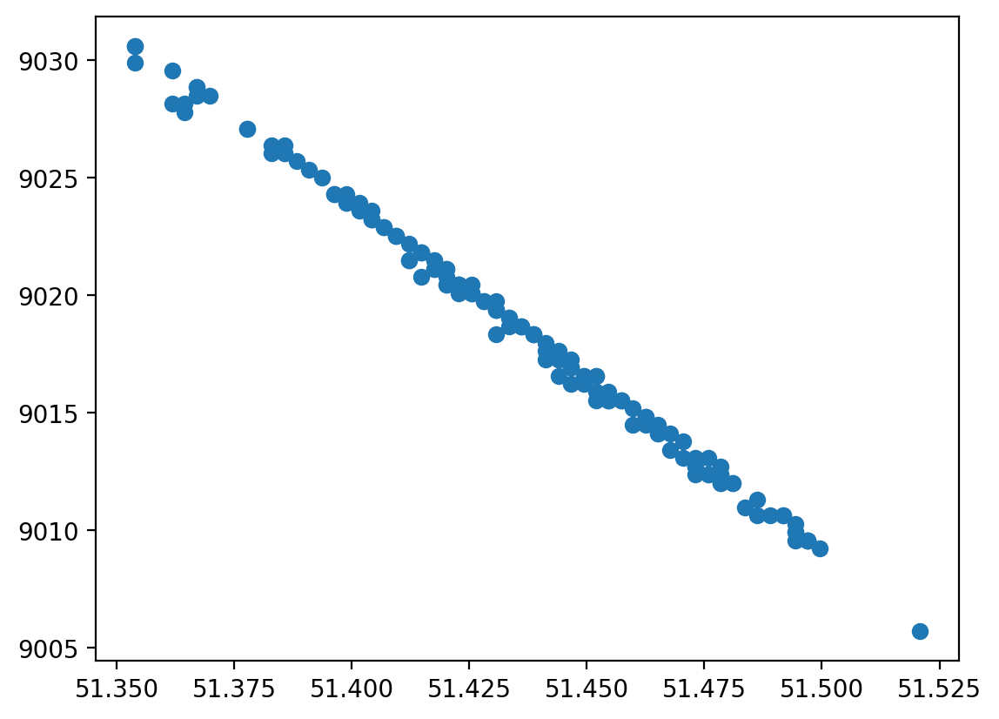

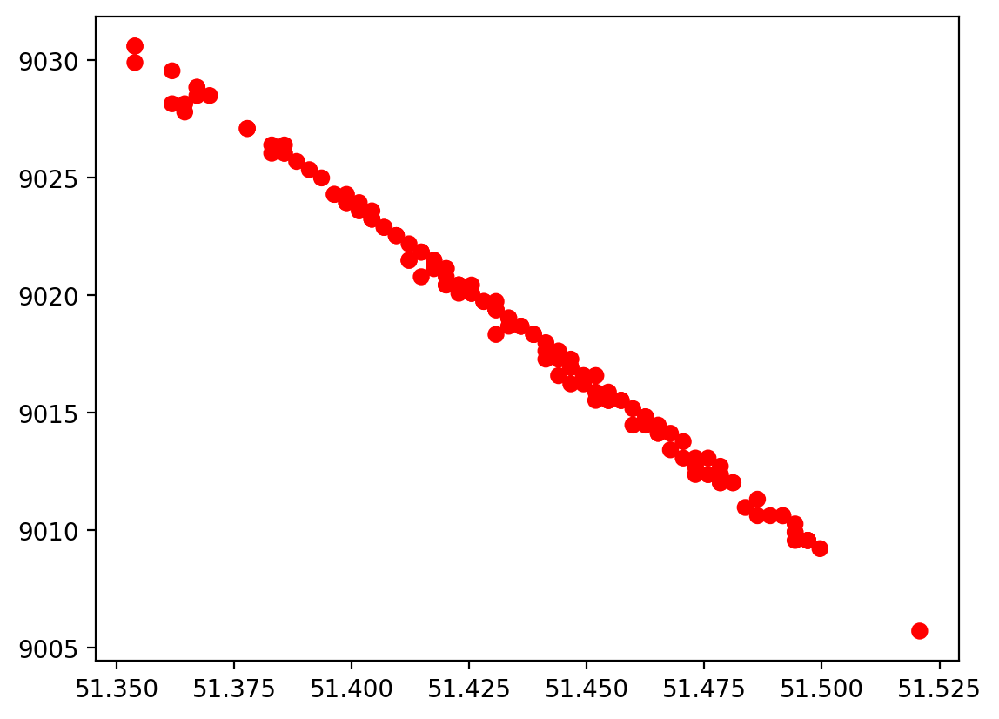

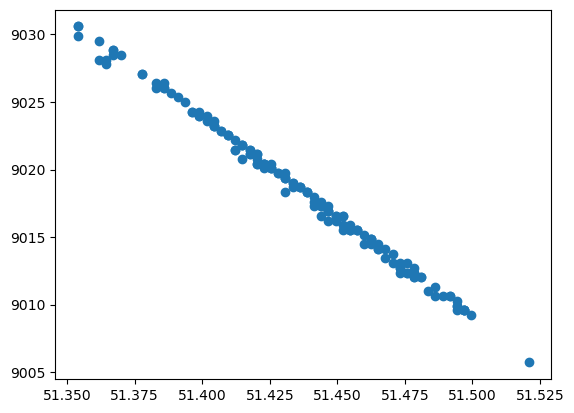

In [ ]:

pitches_H = []
E_H = []
plt.figure()
for lidx, points in enumerate(selected_points_by_group.values()):
    
    pitches_H.append(pitches[points].squeeze())
    E_H.append(Eph_seed[points].squeeze())
    print(lidx,':',points)
    # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
    plt.scatter(pitches_H[lidx],E_H[lidx])
plt.show()

In [ ]:
# pitch_acc += pitches_H
# E_H_acc += E_H
# roll_acc += [roll for idx in range(len(pitch_acc))]

#### compare with simulated lines and assert Hplanes

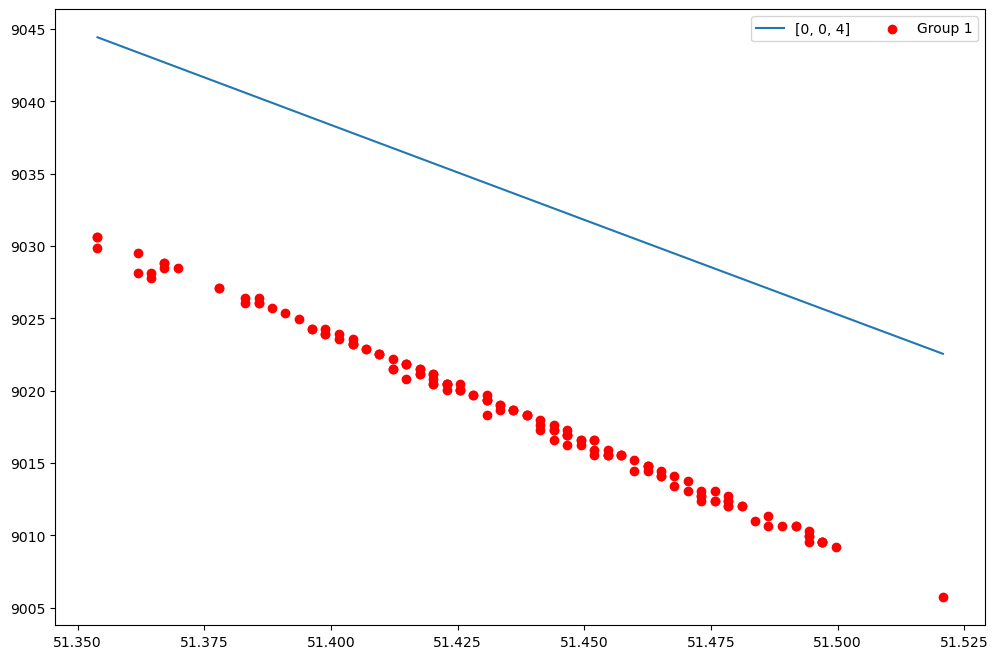

In [ ]:
# dPconv, dRconv, dYconv, dRPconv, Ecorrconv =  [2.41322609e+00, -5.00000000e+00, -9.33453740e+00, -9.44353028e-03,  4.65311758e+01]
dPconv, dRconv, dYconv, dRPconv, Ecorrconv = [1.15235012e+00,  6.04787206e-02,  9.34291663e-01, -1.39320701e-02, -1.63462257e+01]
#dP,dR,dY,Ecorr = res.x

# dPconv, dRconv, dYconv, dRPconv, Ecorrconv=[0.55665728, -1.54318923, -2.18807843,  0.02009495,  1.04564738]
#[ 1.4,  -2.3 ,0.2, 0, -1.63462257e+01]
pitch_list = np.linspace(min(pitches),max(pitches),1000) 
RollQuery = np.deg2rad(np.linspace(-3,3,9))
# phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dPconv, dRconv, dYconv, dRPconv, roll, pitch_list)
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll],dPconv,dRconv,dYconv,dRPconv)
    EBragg = np.array(EBragg) + Ecorrconv
    plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
for lidx,pitchi in enumerate(pitches_H):
        if pitchi.size>0:
            ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)
#plt.ylim(min(Eph_seed)-250,max(Eph_seed)+250)


# fig, ax = plt.subplots(figsize=(10,6))
# #plt.plot(pitch, seed_energy, 'r.')

# for phen, pangle, gid in zip(phen_list, p_angle_list, gid_list):
#         ph_axis, pa_axis = [], []
#         for ph_value, pa_value in zip(phen, pangle):
#             # Only keep photon energies within a close range of the spectrometer image range
#             if ph_value > np.min(Eph_seed)-150 and ph_value < np.max(Eph_seed)+140 and pa_value >= min(pitch_list)-1 and pa_value <= max(pitch_list)+1:
#                 ph_axis.append(ph_value+Ecorr)
#                 pa_axis.append(pa_value)
                
#         if ph_axis == []:
#             pass
#         else:
#             plt.plot(pa_axis, ph_axis, '--', label=gid)

# for lidx,pitchi in enumerate(pitches_H):
#         if pitchi.size>0:
#             ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx],label=group_labels[lidx])
# plt.legend(ncols=2)

# Pitch = np.deg2rad(np.array([p for parray in pitches_H for p in parray]))

# RollQuery = np.deg2rad(np.linspace(-1.5,1.5,9))
# Yaw = np.deg2rad(dYconv)
# bmir.cryst.yaw = Yaw
# dPi = dPconv
# Eoffset = -Ecorrconv
# EBragg = np.zeros((RollQuery.size,Pitch.size,Hquery.size))
# for Ridx, Roll in enumerate(RollQuery):
#     bmir.cryst.roll = Roll+np.deg2rad(roll+dRconv)
#     for Pidx,P in enumerate(Pitch):
#         bmir.cryst.pitch = P+np.deg2rad(dPi)
#         for Hidx,H in enumerate(Hquery):
#             bmir.initialize()
#             EBragg[Ridx,Pidx,Hidx] = bmir.bragg_wavelength(H=H)[1]-Eoffset

# # now parse 
# fig_parse, axs = plt.subplots(nrows=3,ncols=3,tight_layout=True,figsize=(15,12))
# ylims = np.array([Eph_seed.min(),Eph_seed.max()])
# #ylims = [-0.25,0.25]
# for idx, ax in enumerate(axs.flatten()):
#     #Ridx = idx*int((Roll.size-1)/8)
#     ax.tick_params(labelsize=28)
#     ax.grid()
#     ax.set_title("Roll = {:.2f}°".format(np.rad2deg(RollQuery[idx])),fontsize=32)
#     if idx%3>0:
#         ax.tick_params(labelleft=False)
#     if idx<6:
#         ax.tick_params(labelbottom=False)
#         #ax.set_xlabel("$\\Delta E$[meV]",fontsize=32)
#     for lidx, peval in enumerate(pitches_H):
#         ax.scatter(peval,E_H[lidx])
#     for Hidx in range(Hquery.shape[0]):
        
#         ax.plot(np.rad2deg(Pitch),EBragg[idx,:,Hidx].squeeze(),label=str(Hquery[Hidx]))
#         #ax.fill_between((Pitch-np.pi/2)*1E3,(E_Hs[Ridx,:,Hidx]*(1+bw_Hs[Ridx,:,Hidx,0])).squeeze()-bmir.E_c,(E_Hs[Ridx,:,Hidx]*(1+bw_Hs[Ridx,:,Hidx,1])).squeeze()-bmir.E_c)

#     ax.set_ylim(ylims)
#     #ax.set_xlim((Pitch[0]-np.pi/2)*1E3,(Pitch[-1]-np.pi/2)*1E3)
# axs[2,1].set_xlabel("Pitch [°]",fontsize=32)
# axs[1,0].set_ylabel("$\\Delta E$ [eV]",fontsize=32)
# axs[0,0].legend()

2.299999952316284

In [ ]:
#HtoMeas = [5,None,None,0,3,6,4,2]
HtoMeas = [0]

### try to fit

1
[ 9.50852157e-01 -8.80076050e-01  3.08945908e-01 -1.42107115e-02
 -1.66731502e+01] 0.04420903015658866


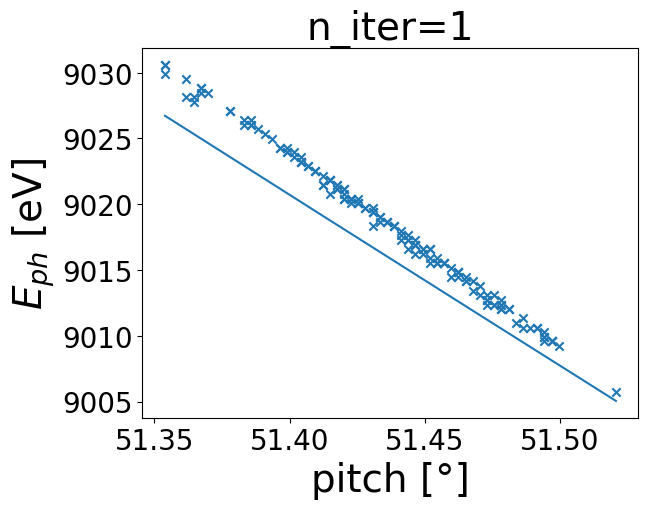

51
[ 9.75075806e-01 -8.51342540e-01  3.13052891e-01 -1.39428097e-02
 -1.69166787e+01] 0.003334951400168505


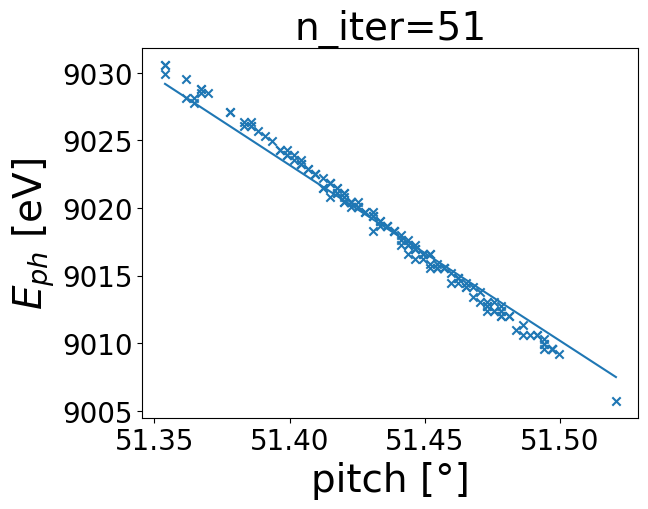

101
[ 9.84170854e-01 -8.47854113e-01  3.14938227e-01 -1.26609896e-02
 -1.73515996e+01] 0.0033167628831013585


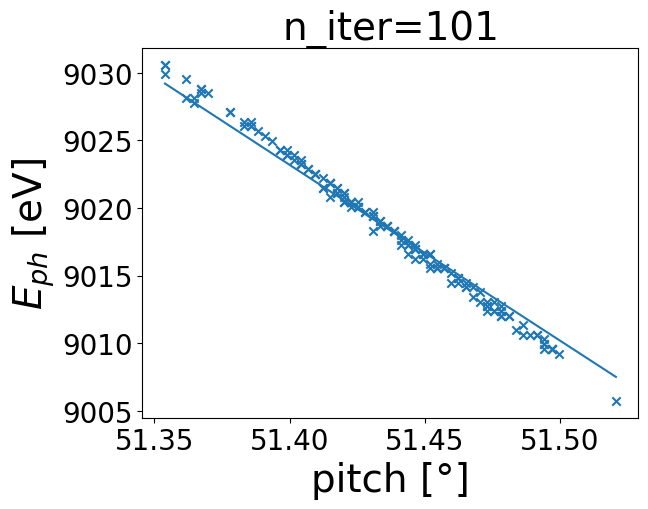

151
[ 1.09947626e+00 -8.36844297e-01  3.44098100e-01  6.22501700e-03
 -2.34460750e+01] 0.0030697451008547447


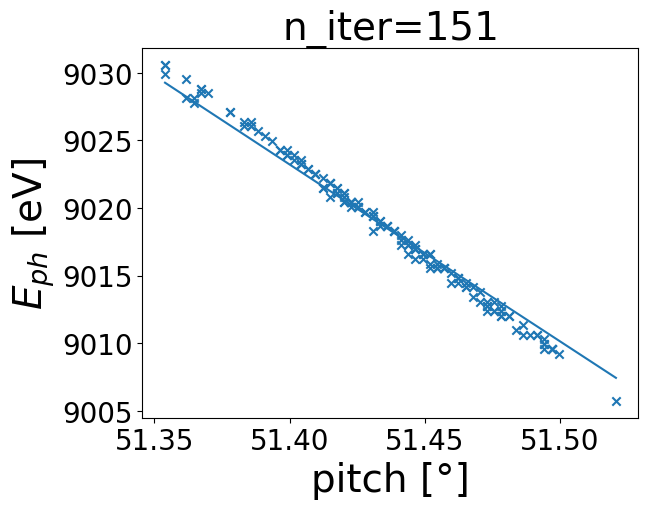

201
[ 1.16840135e+00 -8.63478111e-01  3.66414342e-01  2.03223120e-02
 -2.76959729e+01] 0.0029501768967274255


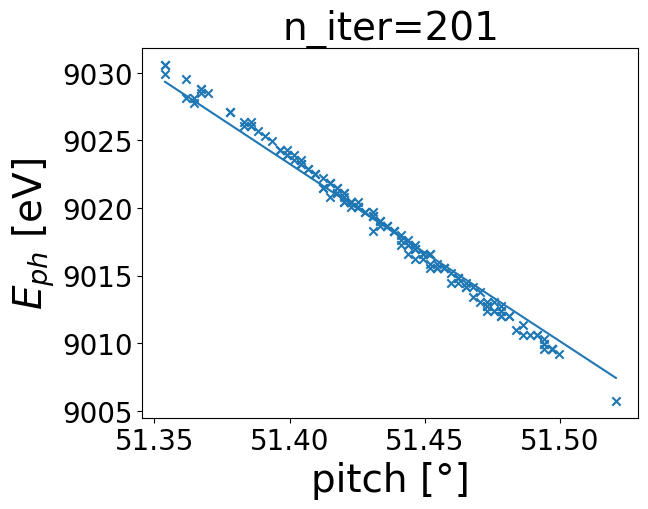

251
[  1.22788015  -0.92581845   0.39101734   0.03565056 -32.03537357] 0.002831899890610954


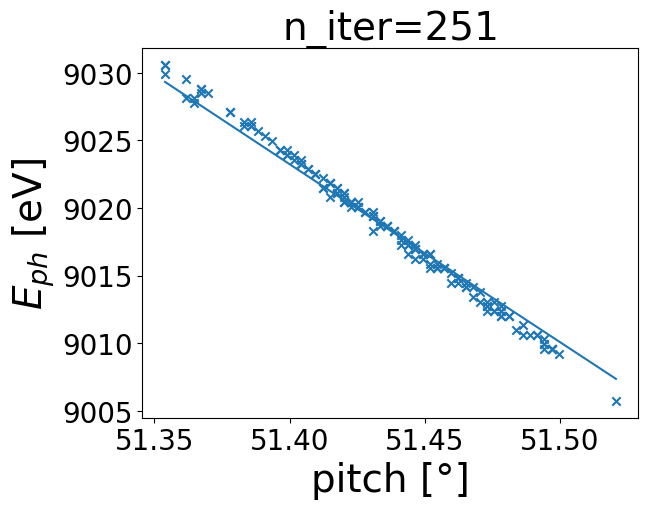

301
[  1.27607806  -1.02150018   0.41762528   0.05167567 -36.33174782] 0.0027619212542148177


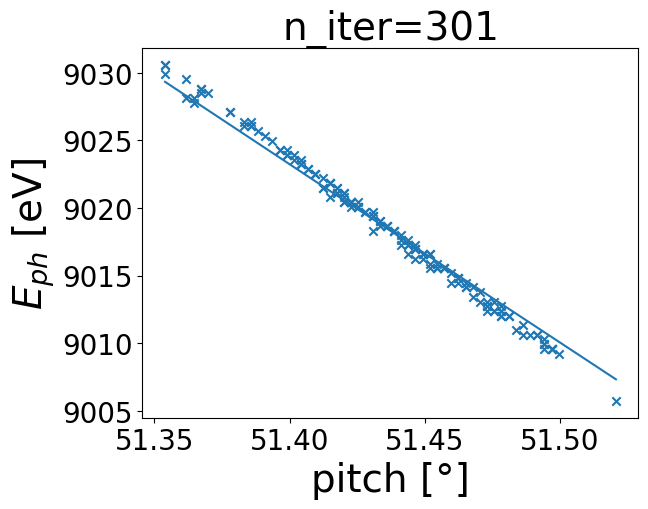

351
[  1.30400391  -1.11138768   0.43820904   0.0637116  -39.41917625] 0.0027339254399194853


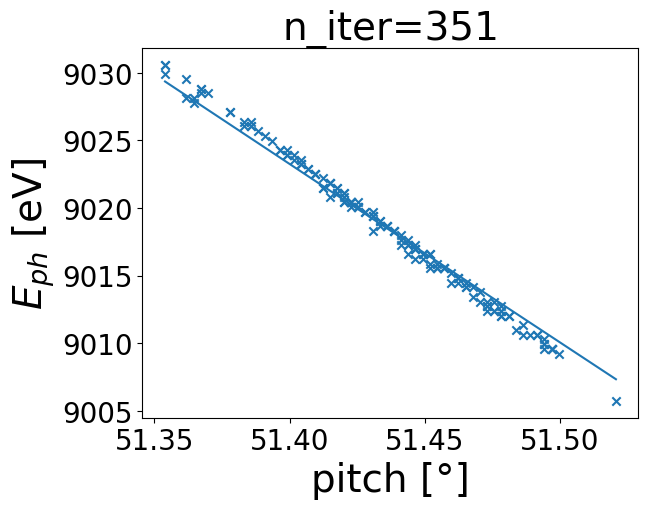

401
[  1.32344097  -1.20593753   0.45730753   0.07464004 -42.12194169] 0.002722442019039522


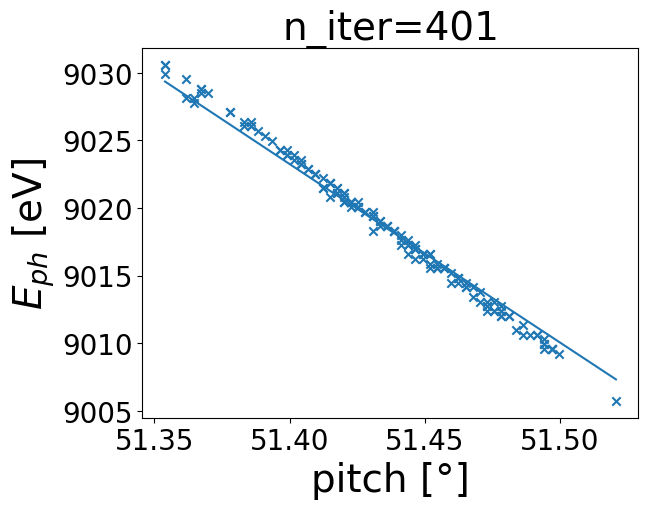

451
[  1.32756874  -1.23207935   0.46226968   0.07744451 -42.80098781] 0.002721777335922098


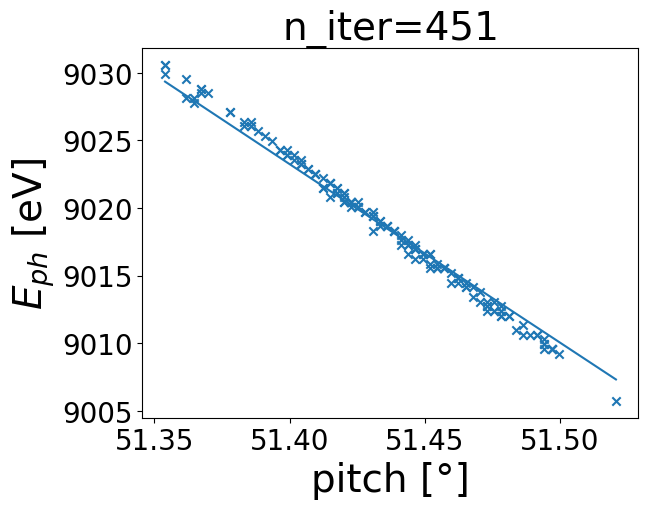

501
[  1.32753744  -1.2318786    0.46223195   0.07742307 -42.79580928] 0.002721777231103226


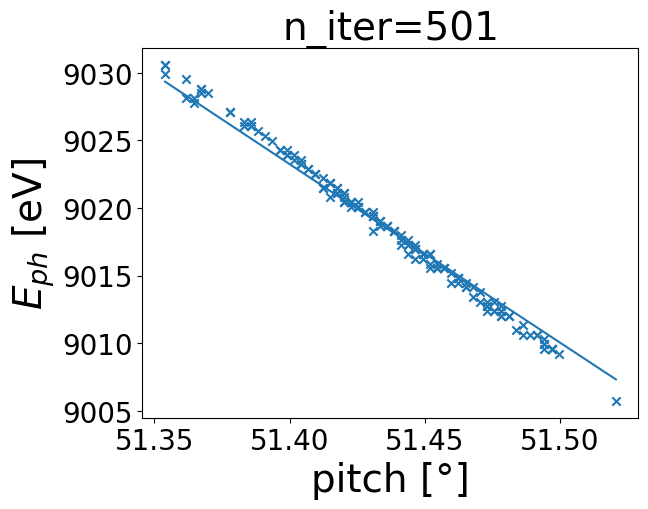

551
[  1.32679231  -1.22612508   0.46142014   0.0768531  -42.66788389] 0.002721695154609545


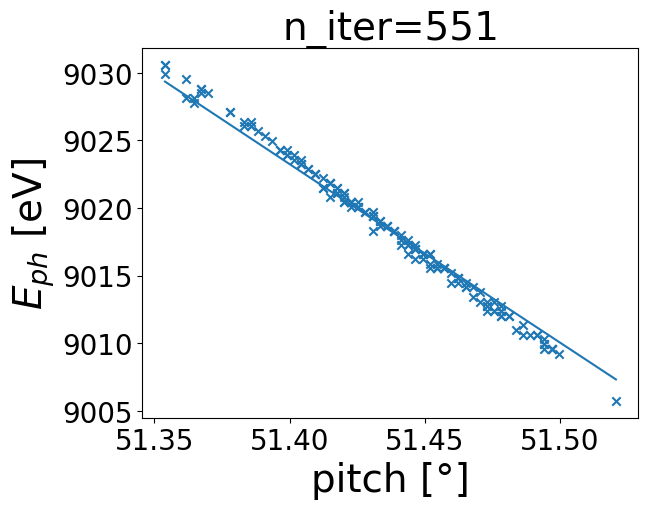

601
[  1.3189095   -1.06787884   0.47155273   0.06567234 -41.3815262 ] 0.0027127428183440815


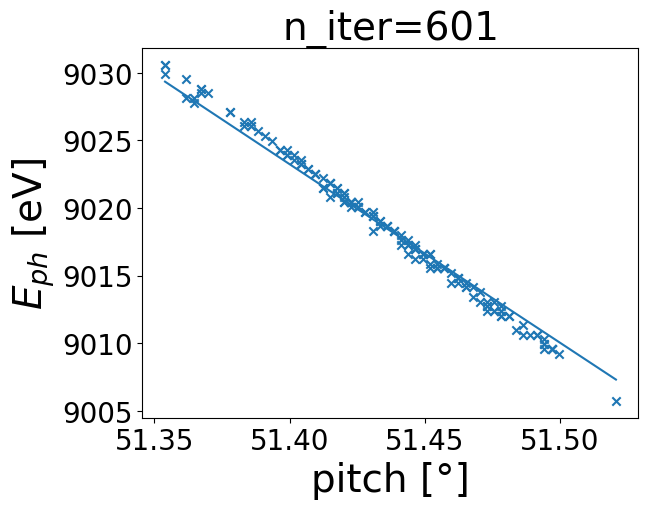

651
[  1.32351001  -0.63270423   0.56798528   0.04436621 -42.54413472] 0.002683651003604961


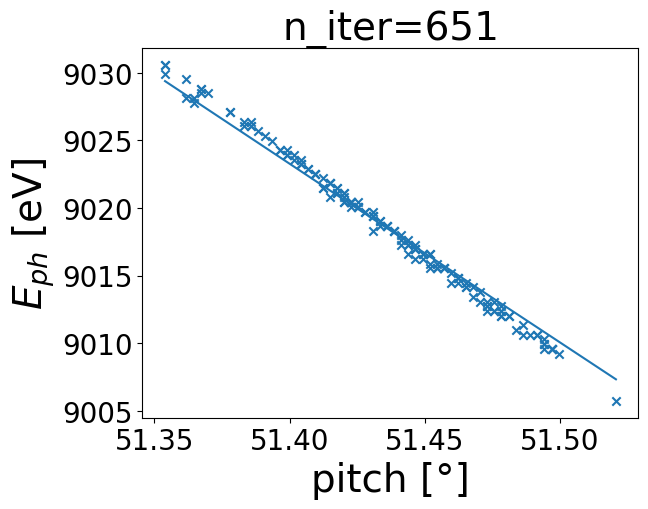

701
[ 1.34903598e+00  7.88254726e-03  7.58938586e-01  1.97457420e-02
 -4.76133629e+01] 0.002629766240694438


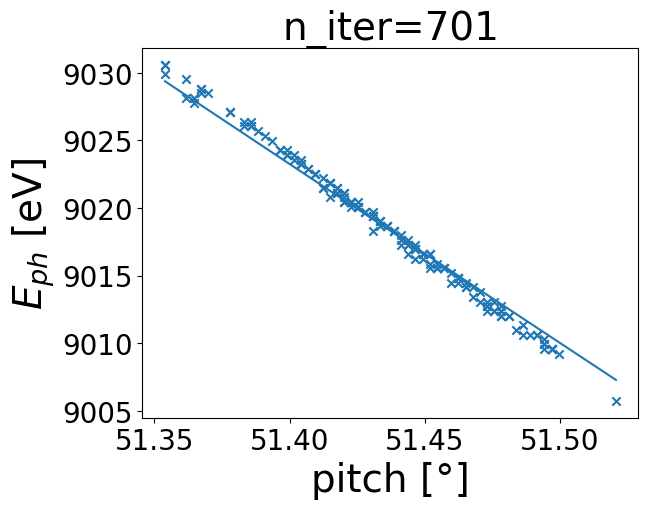

751
[ 1.36128081e+00  2.58535163e-01  8.39632241e-01  1.09296824e-02
 -5.00000000e+01] 0.002611605050094009


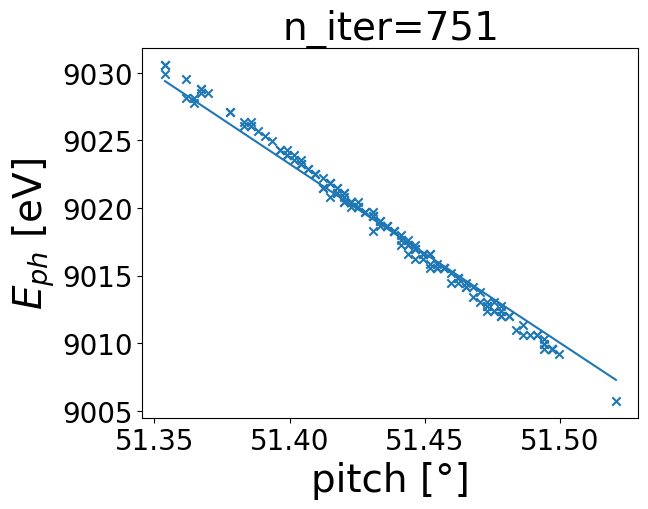

801
[ 1.36710424e+00  2.03748202e-01  8.45740398e-01  1.60324598e-02
 -4.99660255e+01] 0.002603784356704912


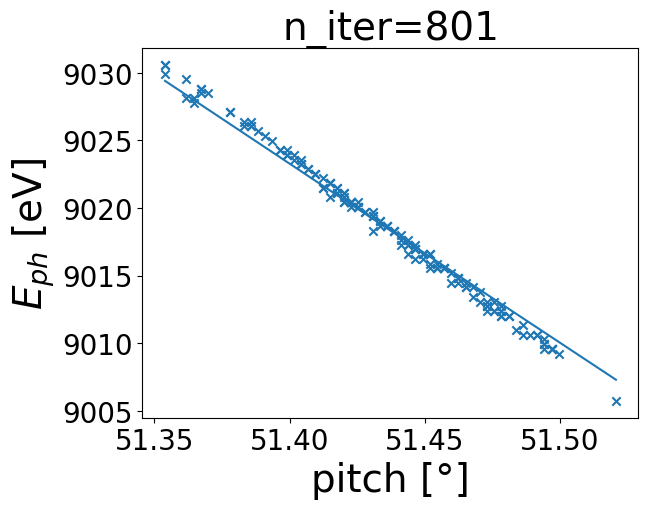

851
[ 1.37684156e+00  2.97609477e-02  8.41290204e-01  2.90137347e-02
 -4.98757096e+01] 0.002587735527092401


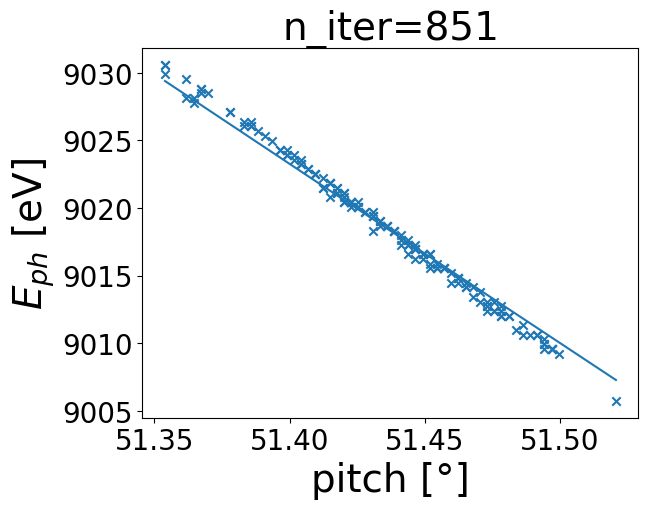

901
[ 1.37919916e+00 -4.79142987e-02  8.33891826e-01  3.40772045e-02
 -4.98436684e+01] 0.0025865537521984534


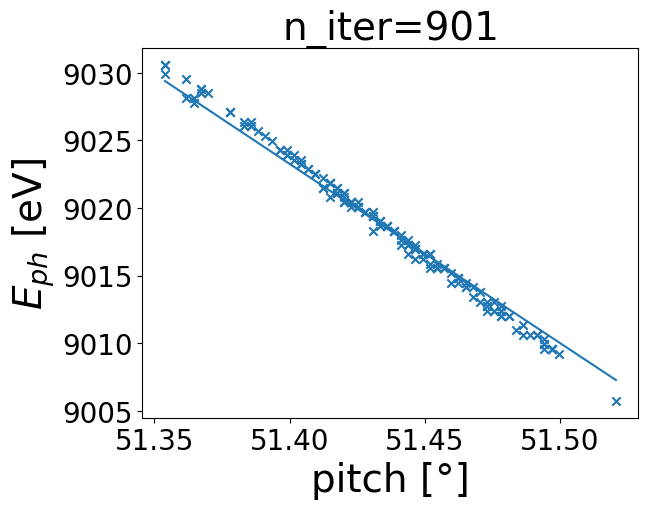

951
[ 1.37906130e+00 -3.56489066e-02  8.35929684e-01  3.33819862e-02
 -4.98630423e+01] 0.00258640435229094


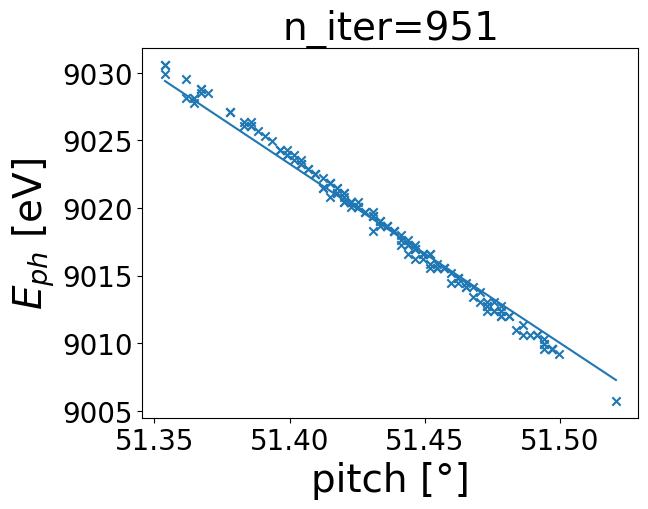

1000
[ 1.38087940e+00 -4.76337791e-02  8.41010738e-01  3.48750940e-02
 -5.00000000e+01] 0.0025845558429053667


/tmp/ipykernel_1570161/4167580427.py:53: RuntimeWarning:

Maximum number of iterations has been exceeded.



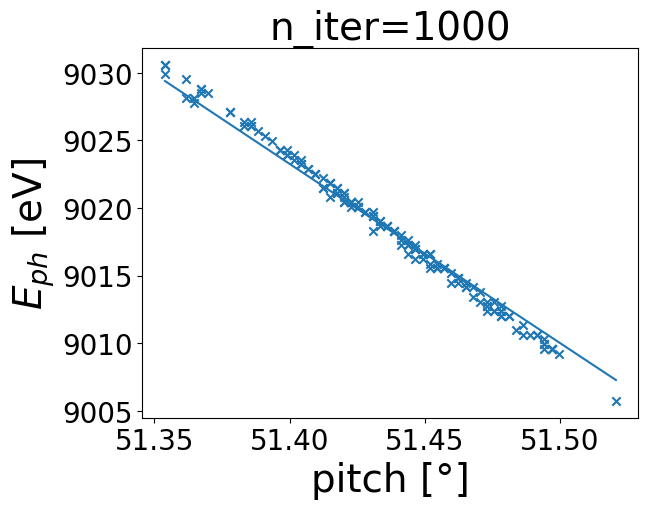

In [ ]:
#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0

    for Hidx, H in enumerate(Hquery):
        lidx = HtoMeas[Hidx]
        if lidx is not None:
            peval = pitches_H[lidx]
            if peval.size>0 :
                EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                EBraggs = np.array(EBraggs) +Ecorr
                cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2
    return 1/cost
  
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery):
            lidx = HtoMeas[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            if lidx is not None:
                peval = pitches_H[lidx]
                if peval.size>0:
                    EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                    EBragg = np.array(EBragg) +Ecorr

            #print(peval_sub.min(),peval_sub.max())
                    plt.scatter(peval,E_H[lidx],marker='x')
                    plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
x0 = np.array([dPconv, dRconv, dYconv, dRPconv, Ecorrconv])
bounds = ([-4,4],[-10,10],[-10,10],[-1,1],[-50,50])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
dPconv,dRconv,dYconv,dRP_conv,Ecorr_conv = res.x

## Extract lines from spectral data for specific set (fidx = 4)

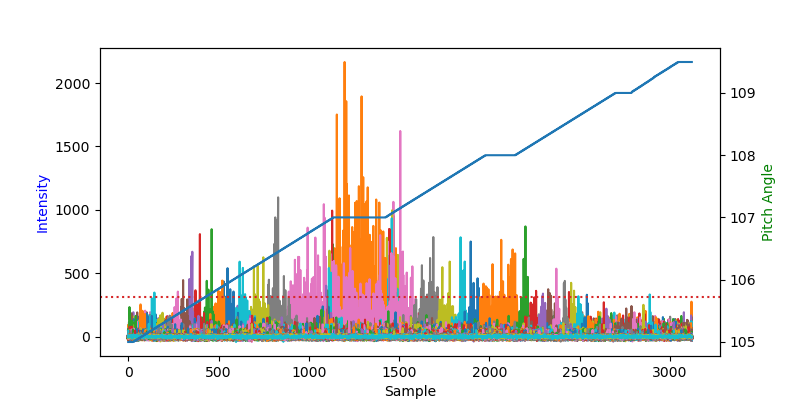

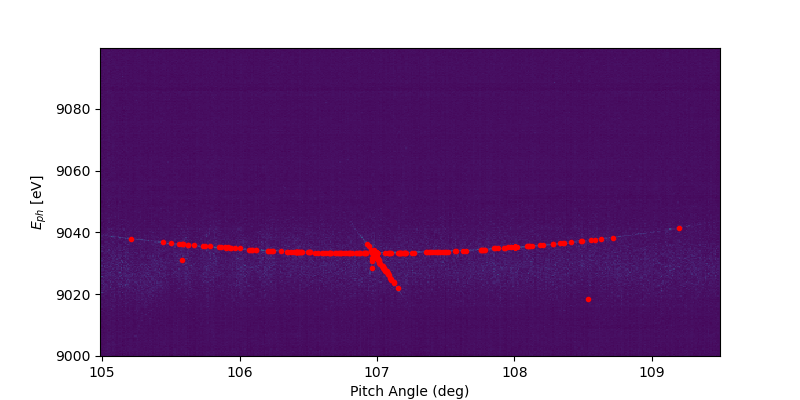

In [ ]:
fidx = 4
tt = np.load(datafiles[fidx-1], allow_pickle=True)
fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
thresh = tt['spec_hist'].max()/7
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()

filter_arr = []
seeding_energy = []
en = 0
for spectrum in tt['spec_hist']:
    E0=9010
    px1=1000
    ev_px = 0.35
    
    start = E0 - px1*ev_px
    stop = E0 + (1280 - px1) * ev_px
    x = np.linspace(start, stop, num=1280)

    if np.max(spectrum) > thresh and x[np.argmax(spectrum)]>9000 and x[np.argmax(spectrum)]<9045: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
# Plot extracted lines
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,tt['phen_scale'],tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()

In [ ]:
#fidx = 3
pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
roll = roll_dict[str(fidx)]
Hquery = Hquery_dict[str(fidx)]
print(Hquery)

['[0, 2, -2]', '[1, 1, -1]', '[1, 1, 5]', '[1, 3, 3]', '[2, 0, -2]', '[2, 2, 4]', '[3, 1, 3]']


In [ ]:
#bmir.cryst.yaw = np.deg2rad(dY)
# Pitch = np.deg2rad(pitches)
# _,_,PreSampling = getlocal_Hplanes(hmax,kmax,lmax,-1,-1.7,-1.5,0.001,roll,Eph_seed,pitches)
# Hquery = PreSampling[1]
# print(Hquery)

[1, 1, -1]


### select points and groups by hand

In [ ]:
%matplotlib widget

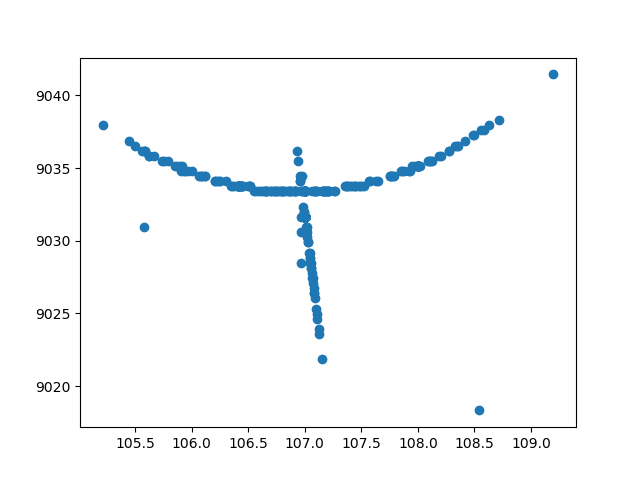

Selected points for Group 1: [  1   2   3   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19
  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37
  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55
  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73
  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  99
 101 102 108 113 114 124 141 145 150 152 156 161 164 168 177 194 195 207
 211 218 219 240 241 244 246 248 251 278 283 287 288 289 291 296 298 299
 300 301 302 303 304 305 306 307 308 309 310 311 312 313 314 315 316 317
 318 319 320 321 322 323 324 325 326 327 328 329 330 331 332 333 334 335
 336 337 338 339 340 341 342 343 344 345 346 347 348 349 350 351 352 353
 354 355 356 357 358 359 360 361 362 363 364 365 366 367 368 369 370 371
 372 373 374 375 376 377 378 379 380 381 382 383 384 385 386 387 388 389
 391 392 393 394]
Switched to Group 2
Selected points for Group 2: []
Selected points for Group

In [ ]:
fig, ax = plt.subplots()
scatter = ax.scatter(pitches, Eph_seed,picker=True)

# Interactive point selection
#cursor = mplcursors.cursor(sc, hover=True)
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label: [] for label in group_labels}

current_group_idx = 0
deselect_mode = False

# Function to change the color of the selected points based on the current group
def update_point_colors(selected, colors):
    scatter.set_facecolor(['gray'] * len(pitches))  # Reset all points to default color
    for idx, (group, points) in enumerate(selected_points_by_group.items()):
        if points:
            color = group_colors[idx]
            selected_points = np.array(points)
            scatter._facecolors[selected_points[:].astype(int)]=np.repeat([mcolors.to_rgba(color)],selected_points.shape[0],axis=0)
            # scatter._facecolors[selected_points[:, 0].astype(int)] = mcolors.to_rgb(color)
    fig.canvas.draw()

# Function to handle point selection with lasso
def onselect_lasso(verts):
    global current_group_idx
    path = Path(verts)
    selected = path.contains_points(np.column_stack((pitches, Eph_seed)))
    selected_indices = np.where(selected)[0]

    for i in selected_indices:
        if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
            del selected_points_by_group[group_labels[current_group_idx]][i]
        elif not deselect_mode:  # Select point if 'd' is not pressed
            selected_points_by_group[group_labels[current_group_idx]].append(i)

    print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
    update_point_colors(selected_indices, group_colors)

def on_pick(event):
    if event.mouseevent.button == 1:
        selected_indices = event.ind
        for i in selected_indices:
            if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
                loc_idx = np.where(selected_points_by_group[group_labels[current_group_idx]]==i)
                print(loc_idx[0][0])
                del selected_points_by_group[group_labels[current_group_idx]][loc_idx[0][0]]
            elif not deselect_mode:  # Select point if 'd' is not pressed
                selected_points_by_group[group_labels[current_group_idx]].append(i)
        #print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
        update_point_colors(selected_indices, group_colors)
    # xdata = x[ind[0]]
    # ydata = y[ind[0]]

    
    #xdata, ydata = line.get_data()
    #ind = event.ind
    
    #print(f'on pick line: {xdata[ind]}, {ydata[ind]}')

cid = fig.canvas.mpl_connect('pick_event', on_pick)

# Lasso and Rectangle selectors
lasso = LassoSelector(ax, onselect_lasso)


# Function to handle key press events (switch groups with 'n' or 'p')
def on_key(event):
    global current_group_idx, deselect_mode
    if event.key == 'n':  # Switch to the next group on pressing 'n'
        current_group_idx = (current_group_idx + 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'm' and current_group_idx>1:  # Switch to the previous group on pressing 'p'
        current_group_idx = (current_group_idx - 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'd':  # Switch deselect mode
        if deselect_mode:
            deselect_mode = False
            print("Switched off deselect mode")
        else:
            deselect_mode = True
            print("Switched on deselect mode")

    

# Connect the key press event
fig.canvas.mpl_connect('key_press_event', on_key)

plt.show()

In [ ]:
%matplotlib inline

In [ ]:
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label:[] for label in group_labels}

selected_points_by_group['Group 1'] = [1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 99, 101, 102, 108, 113, 114, 124, 141, 145, 150, 152, 156, 161, 164, 168, 177, 194, 195, 207, 211, 218, 219, 240, 241, 244, 246, 248, 251, 278, 283, 287, 288, 289, 291, 296, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 391, 392, 393, 394]
selected_points_by_group['Group 2'] = [91, 92, 269, 270, 271, 272, 273, 274, 275, 276, 277, 279, 280, 281, 282, 284, 285, 286, 290, 292, 293, 294, 295, 297, 265, 266, 267, 268, 107, 109, 110, 111, 112, 115, 116, 117, 118, 119, 120, 121, 122, 123, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 142, 143, 144, 146, 147, 148, 149, 151, 153, 154, 155, 157, 158, 159, 160, 162, 163, 165, 166, 167, 169, 170, 171, 172, 173, 174, 175, 176, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 208, 209, 210, 212, 213, 214, 215, 216, 217, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 242, 243, 245, 247, 249, 250, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 103, 104, 105, 106, 107, 109, 110, 111, 112, 115, 116, 117, 118, 119, 120, 121, 122, 123, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 142, 143, 144, 146, 147, 148, 149, 151, 153, 154, 155, 157, 158, 159, 160, 162, 163, 165, 166, 167, 169, 170, 171, 172, 173, 174, 175, 176, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 208, 209, 210, 212, 213, 214, 215, 216, 217, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 242, 243, 245, 247, 249, 250, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 94, 95]
selected_points_by_group['Group 3'] : [100, 98, 97, 96]

0 : [1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 99, 101, 102, 108, 113, 114, 124, 141, 145, 150, 152, 156, 161, 164, 168, 177, 194, 195, 207, 211, 218, 219, 240, 241, 244, 246, 248, 251, 278, 283, 287, 288, 289, 291, 296, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 391, 392, 393

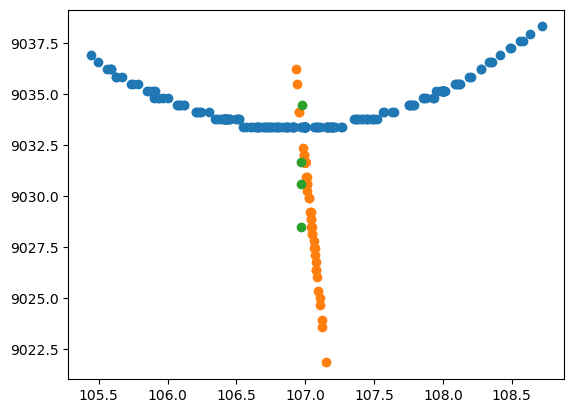

In [ ]:
pitches_H = []
E_H = []
plt.figure()
for lidx, points in enumerate(selected_points_by_group.values()):
    sort_idx = np.argsort(pitches[points].squeeze())
    pitches_H.append(pitches[points].squeeze()[sort_idx])
    
    E_H.append(Eph_seed[points].squeeze()[sort_idx])
    print(lidx,':',points)
    # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
    plt.scatter(pitches_H[lidx],E_H[lidx])
    #plt.plot(test_p[lidx],test_E[lidx])
plt.show()

99

### get an idea about the actual angles

(8998.329945269743, 9061.448006254886)

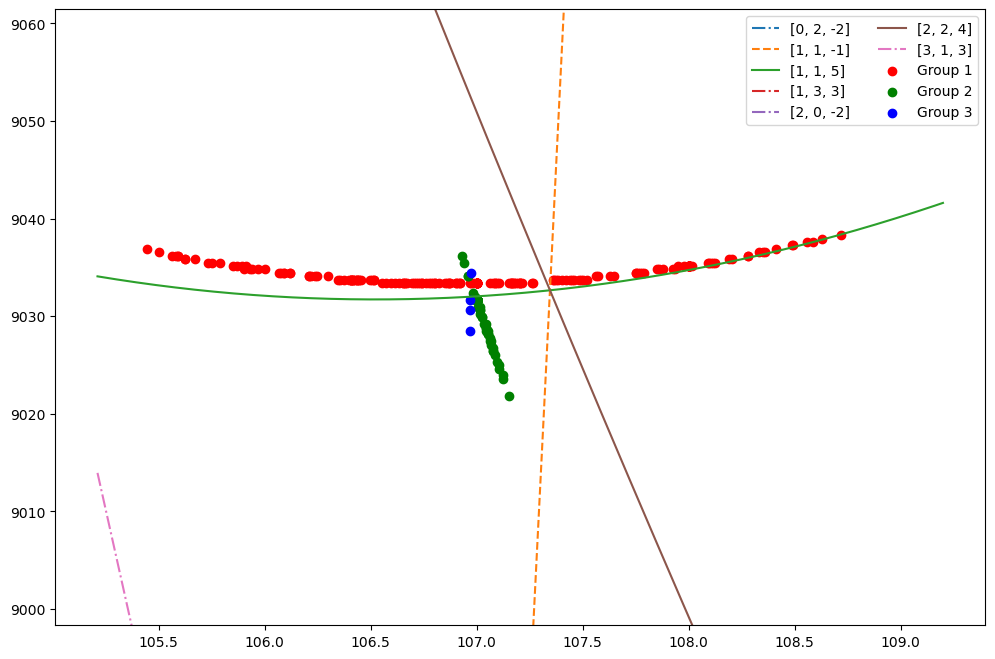

In [ ]:
dPconv, dRconv, dYconv, dRPconv, Ecorrconv = [1.1556035,    1.77498604,   12,  -0.03065046, -16.5]
#[ 1.4,  -2.3 ,0.2, 0, -1.63462257e+01]
pitch_list = np.linspace(min(pitches),max(pitches),1000) 
RollQuery = np.deg2rad(np.linspace(-3,3,9))
# phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dPconv, dRconv, dYconv, dRPconv, roll, pitch_list)
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')
roll = -1.2
for Hidx, H in enumerate(Hquery):
    EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll],dPconv,dRconv,dYconv,dRPconv)
    EBragg = np.array(EBragg) + Ecorrconv
    plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
for lidx,pitchi in enumerate(pitches_H):
        if pitchi.size>0:
            ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)
plt.ylim(min(Eph_seed)-20,max(Eph_seed)+20)

In [ ]:
HtoMeas = [None, 2, 0, None, None, 1, None]

### fit

1
[  0.85668966   3.          -3.          -0.03065046 -16.5       ] 2626.657745439658


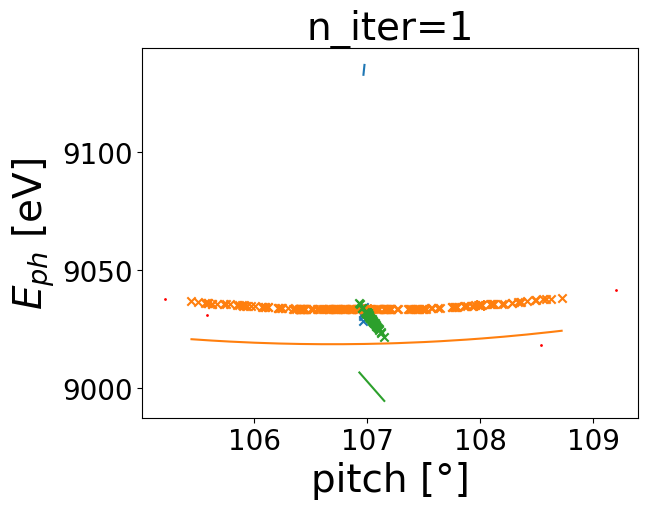

51
[  1.06483048   2.8500153   -3.19603583  -0.02535033 -15.84691022] 1.5089308963150878


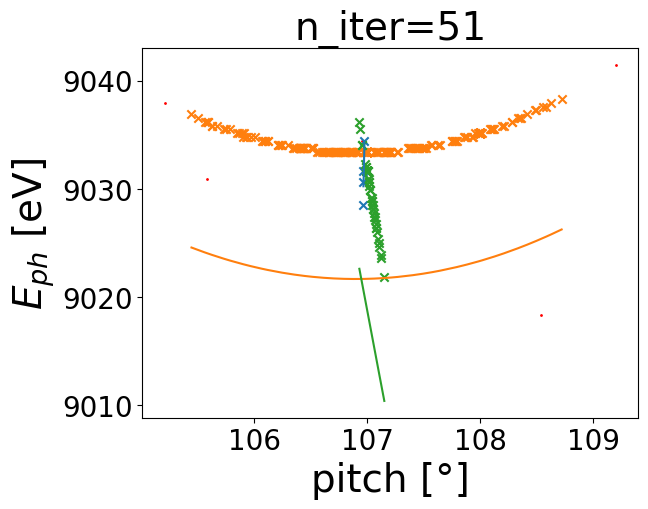

101
[ 9.61377319e-01  2.49743897e+00 -5.01495450e+00 -1.57365426e-02
 -1.58267899e+01] 0.40789823456523017


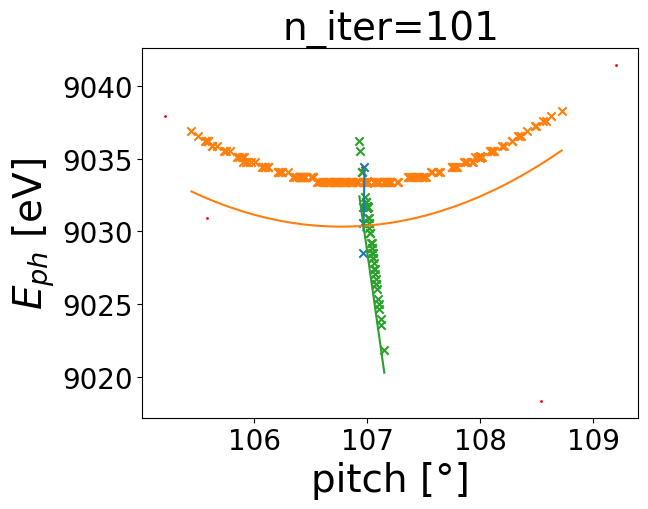

151
[ 9.15125077e-01  2.37530968e+00 -5.62999980e+00 -1.26368739e-02
 -1.65559057e+01] 0.32411448130412723


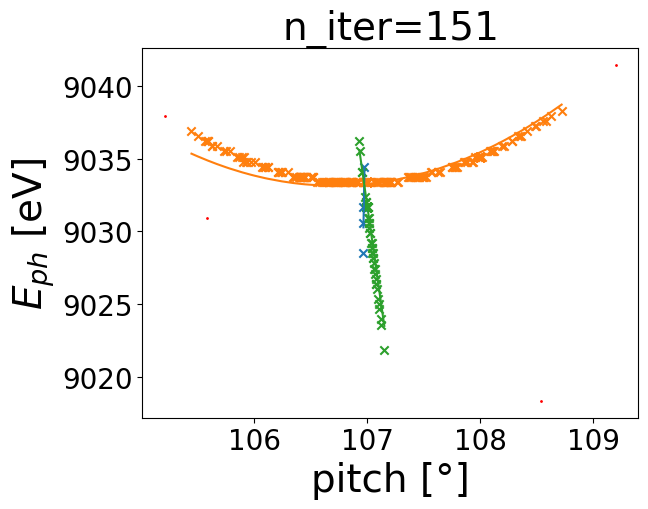

201
[ 9.14904109e-01  2.37475599e+00 -5.63270512e+00 -1.26229348e-02
 -1.65596475e+01] 0.32411079354826355


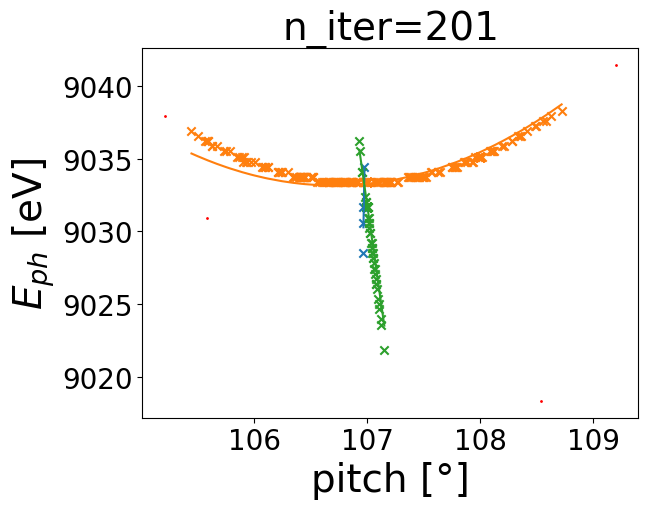

251
[ 9.16201510e-01  2.37224404e+00 -5.60357399e+00 -1.25378355e-02
 -1.65364472e+01] 0.32409914269774387


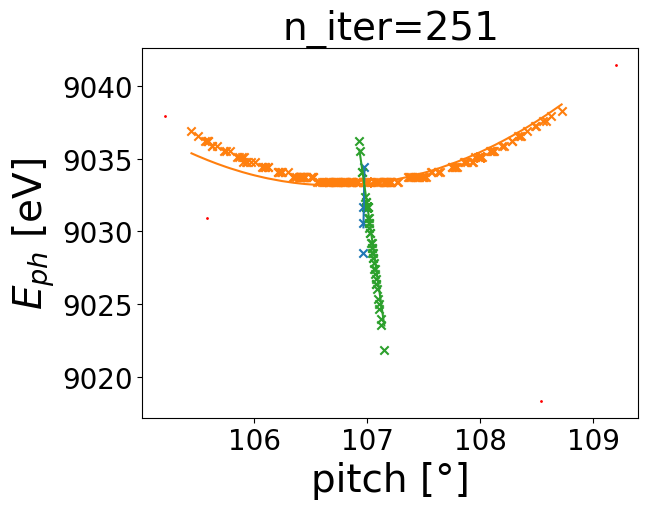

301
[ 9.31998287e-01  2.34883208e+00 -5.26432399e+00 -1.17083333e-02
 -1.62556087e+01] 0.32395451402396713


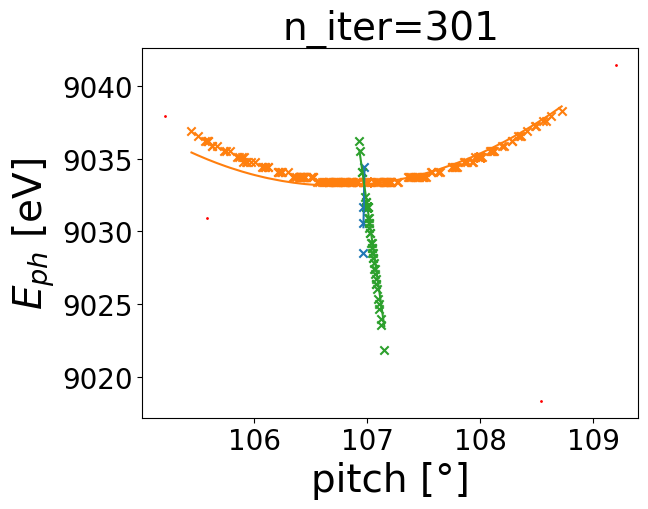

351
[ 9.50297891e-01  2.31760373e+00 -4.86955849e+00 -1.06339909e-02
 -1.59284297e+01] 0.32378347062293295


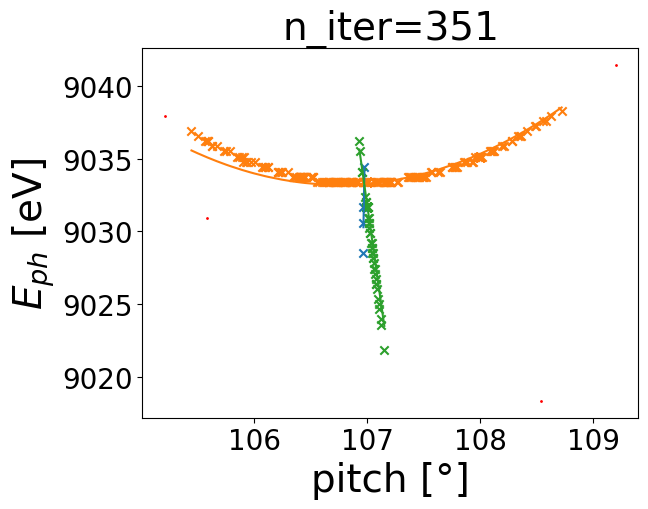

401
[ 9.81554893e-01  2.27261385e+00 -4.22076705e+00 -9.00176696e-03
 -1.53573373e+01] 0.3235694308607262


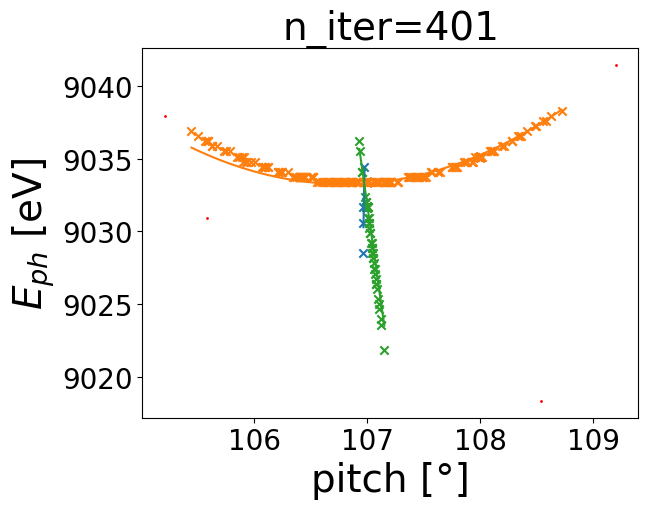

451
[ 9.98657032e-01  2.25189528e+00 -3.87722473e+00 -8.22578136e-03
 -1.50460065e+01] 0.3234866499624928


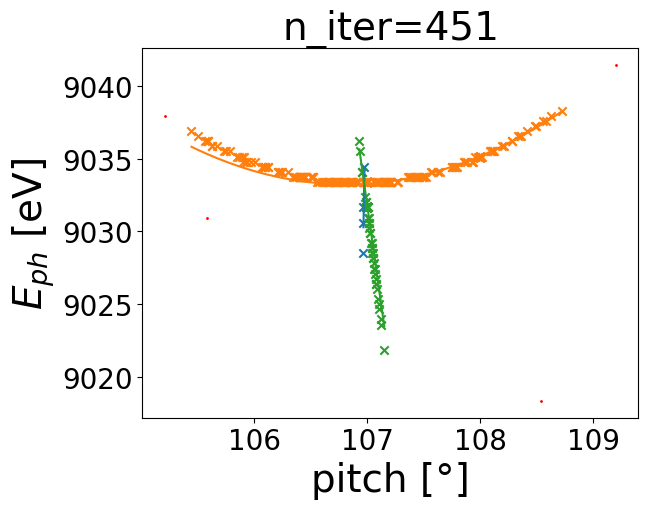

501
[ 1.00187140e+00  2.24622554e+00 -3.81036880e+00 -8.02436093e-03
 -1.50016836e+01] 0.32346597360675866


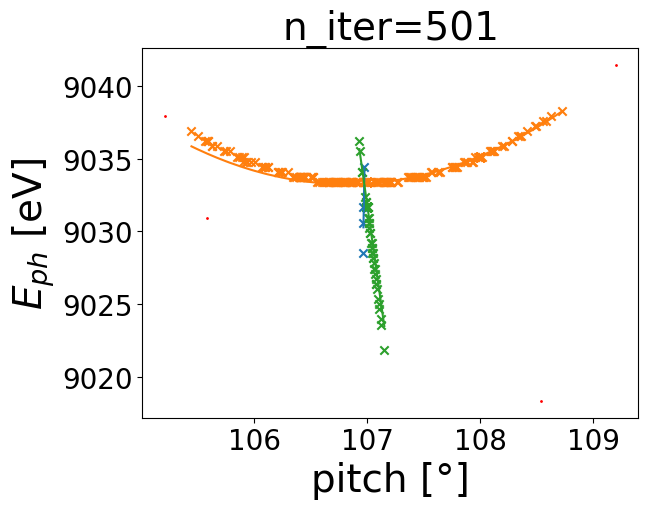

551
[ 1.01009330e+00  2.22583346e+00 -3.62963842e+00 -7.34312391e-03
 -1.50002923e+01] 0.3234336414012141


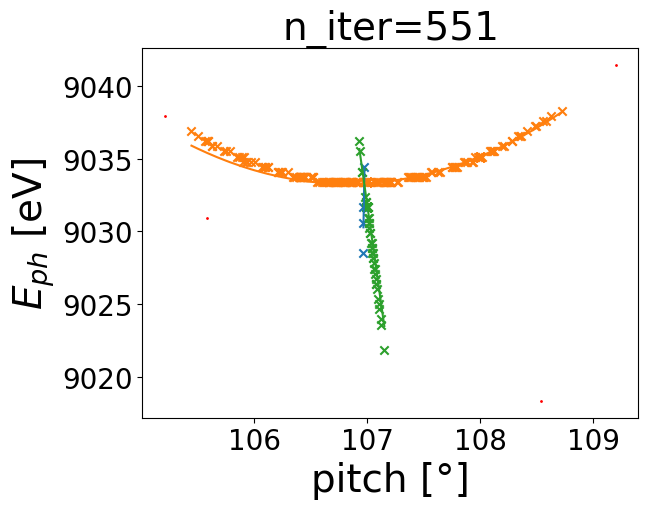

601
[ 1.02050950e+00  2.20258749e+00 -3.40558490e+00 -6.51841216e-03
 -1.50026821e+01] 0.32339998313808294


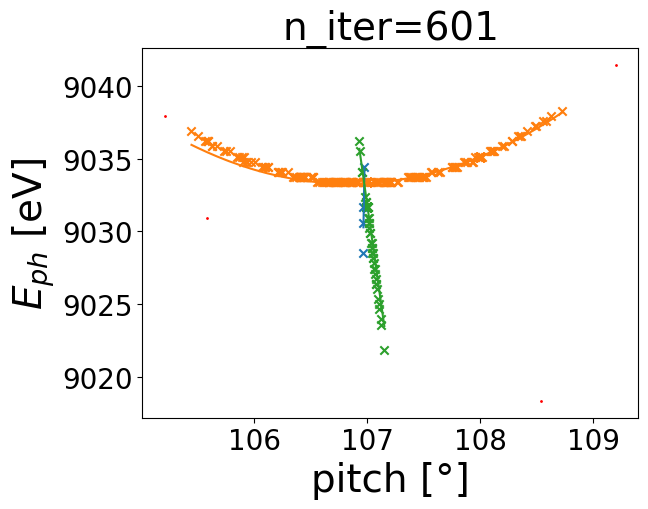

651
[ 1.03120300e+00  2.18152266e+00 -3.18119445e+00 -5.71752427e-03
 -1.50082237e+01] 0.32337141848256556


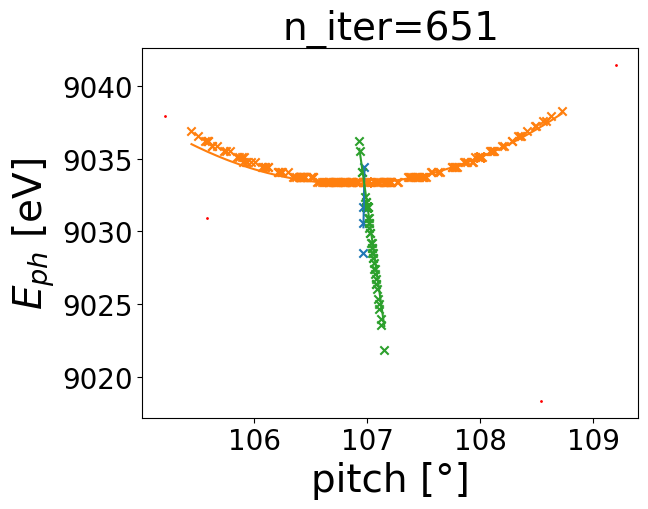

701
[ 1.04157033e+00  2.16280805e+00 -2.96827392e+00 -4.96424314e-03
 -1.50152027e+01] 0.323351535134778


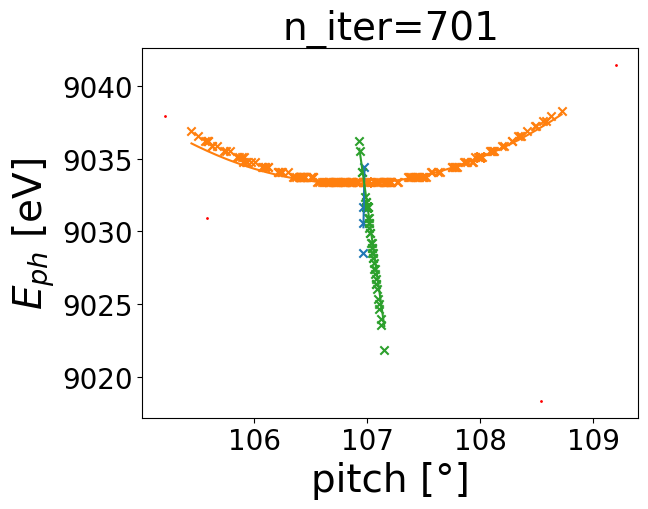

751
[ 1.05137252e+00  2.14733817e+00 -2.77132875e+00 -4.28902570e-03
 -1.50240818e+01] 0.3233353784492634


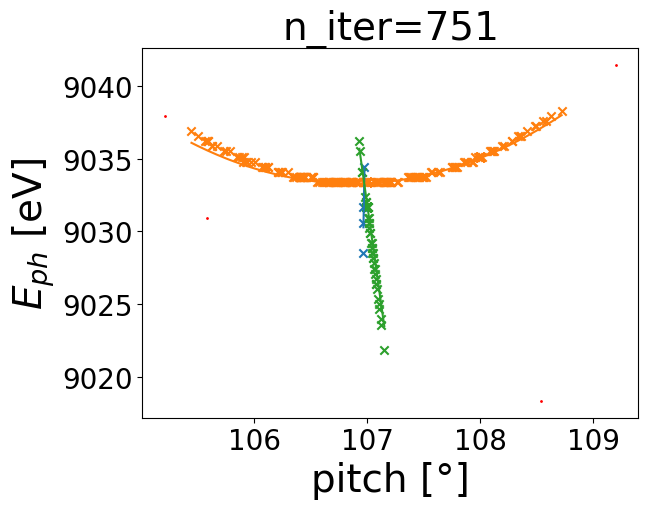

801
[ 1.05934741e+00  2.13580807e+00 -2.61379451e+00 -3.75019817e-03
 -1.50327476e+01] 0.323326240480371


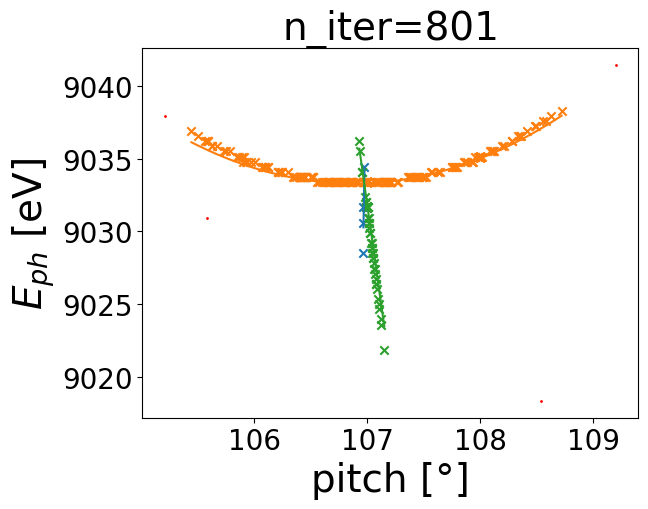

851
[ 1.06824073e+00  2.12340727e+00 -2.44107986e+00 -3.16807079e-03
 -1.50407464e+01] 0.32332092422857245


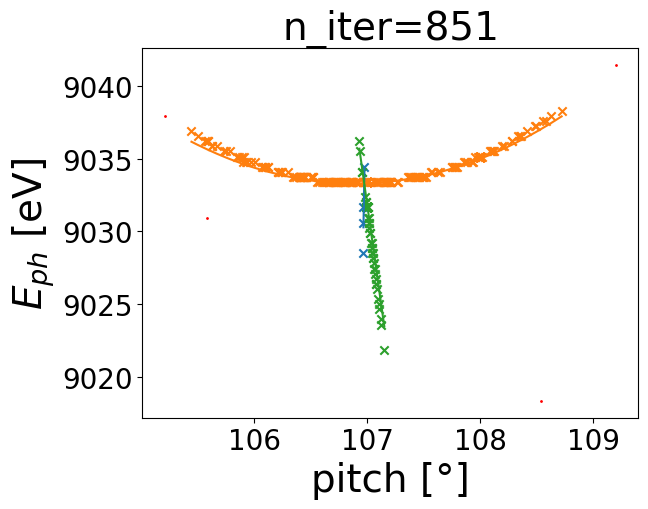

901
[ 1.07604583e+00  2.11194119e+00 -2.29203672e+00 -2.65214328e-03
 -1.50448281e+01] 0.32331870091902243


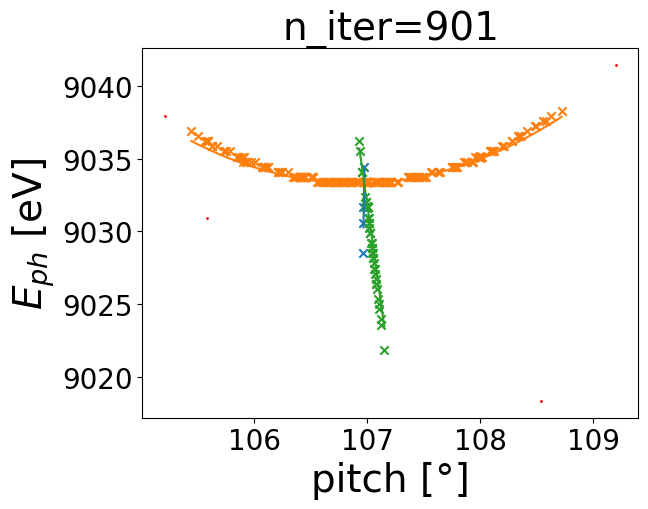

951
[ 1.07722606e+00  2.11023556e+00 -2.26970162e+00 -2.57723095e-03
 -1.50451456e+01] 0.3233186550765575


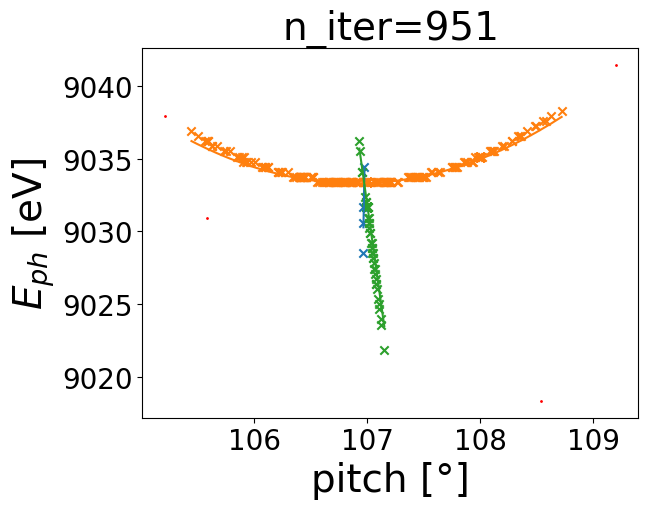

/tmp/ipykernel_1671649/856790245.py:53: RuntimeWarning:

Maximum number of iterations has been exceeded.



1000
[ 1.07751213e+00  2.10995426e+00 -2.26427577e+00 -2.55980253e-03
 -1.50456395e+01] 0.3233186517506235


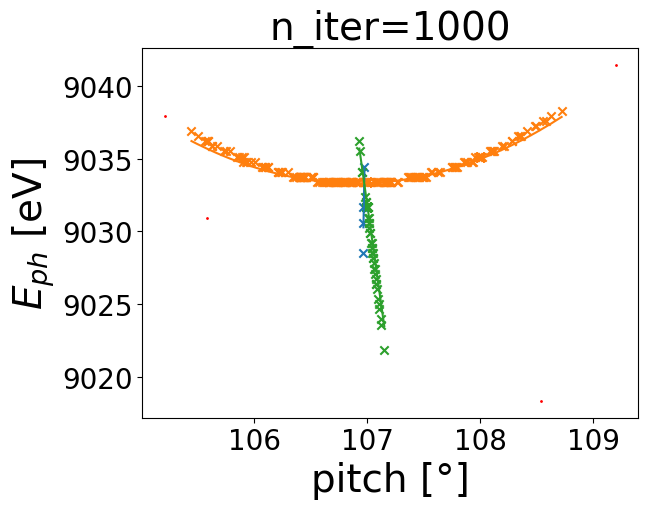

In [71]:
#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0

    for Hidx, H in enumerate(Hquery):
        lidx = HtoMeas[Hidx]
        if lidx is not None:
            peval = pitches_H[lidx]
            if peval.size>0 :
                EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                EBraggs = np.array(EBraggs) +Ecorr
                cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2
    return 1/cost
  
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery):
            lidx = HtoMeas[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            if lidx is not None:
                peval = pitches_H[lidx]
                if peval.size>0:
                    EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                    EBragg = np.array(EBragg) +Ecorr

            #print(peval_sub.min(),peval_sub.max())
                    plt.scatter(peval,E_H[lidx],marker='x')
                    plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
x0 = np.array([dPconv, dRconv, -3, dRPconv, Ecorrconv])
bounds = ([-4,4],[-3,3],[-15,15],[-0.2,0.2],[-17,-15])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
dPconv,dRconv,dYconv,dRP_conv,Ecorr_conv = res.x

## multiple sets of lines together (scans number 3,4 and 6)

In [265]:
# #start with current fix=3
pitch_acc = []
E_H_acc = []
roll_acc = []#roll for idx in range(len(pitch_acc))]
Hquery_acc = []#Hquery
HtoMeas_acc = []

dPguess,dRguess,dYguess,dRPguess,Ecorrguess = [ 1.15147222e+00,  7.98023426e-01, -9.24811447e-01,  1.39605589e-02, -1.64749145e+01]

#[ 1.07751213e+00,  2.10995426e+00 ,-2.26427577e+00, -2.55980253e-03, -1.50456395e+01]

### scan #3

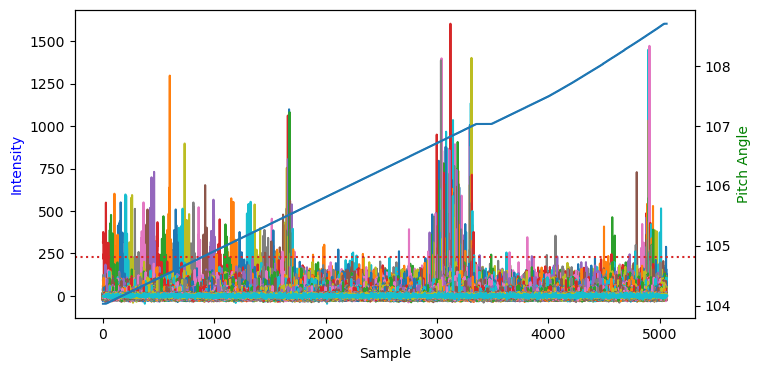

['[0, 2, -2]', '[1, 1, -1]', '[1, 1, 5]', '[1, 3, 3]', '[2, 0, -2]', '[2, 2, 4]', '[3, 1, 3]']


In [266]:
fidx = 3
tt = np.load(datafiles[fidx-1], allow_pickle=True)
fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
thresh = tt['spec_hist'].max()/7
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()

filter_arr = []
seeding_energy = []
en = 0
for spectrum in tt['spec_hist']:
    E0=9010
    px1=1000
    ev_px = 0.35
    
    start = E0 - px1*ev_px
    stop = E0 + (1280 - px1) * ev_px
    x = np.linspace(start, stop, num=1280)

    if np.max(spectrum) > thresh and x[np.argmax(spectrum)]>9000 and x[np.argmax(spectrum)]<9045: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch

pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
roll = roll_dict[str(fidx)]
Hquery = Hquery_dict[str(fidx)]
print(Hquery)
# Plot extracted lines
# fig, ax = plt.subplots(figsize=(8,4))

# plt.pcolormesh(np_doocs,tt['phen_scale'],tt['corr2d'].T,shading='auto')
# plt.plot(pitch, seeding_energy, 'r.')
# ax.set_xlabel('Pitch Angle (deg)')
# ax.set_ylabel(r'$E_{ph}$ [eV]')
# plt.show()

In [267]:
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label:[] for label in group_labels}
selected_points_by_group['Group 1'] = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 297, 298, 299, 300, 302, 303, 305, 306, 309, 314, 341, 349, 350, 351, 352, 353, 354, 536, 537, 539, 540, 541, 543, 546, 547, 548, 551, 552, 600, 601, 602, 603, 604, 605, 606, 607, 608, 600, 601, 602, 603, 604, 605, 606, 607, 582, 608, 609, 610, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 139, 140, 157, 158, 551, 552, 553, 554, 555, 556]
selected_points_by_group['Group 2']= [301, 304, 307, 308, 310, 311, 312, 313]
selected_points_by_group['Group 3']= [323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 342, 343, 344, 345, 346, 321, 322, 318, 319, 320, 316, 317, 315]
selected_points_by_group['Group 4']= [358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 376, 377, 378, 379, 380, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 374, 376, 377, 378, 379, 380, 381, 382]
selected_points_by_group['Group 5']= [500, 501, 502, 503, 504, 505, 506, 507, 508, 509, 510, 511, 512, 513, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 531, 499, 498]
selected_points_by_group['Group 6']= [598, 599, 597, 598, 599, 596, 594, 595, 593, 591, 592, 565, 566, 567, 568, 569, 570, 571, 572, 573, 574, 575, 576, 577, 578, 579, 580, 581, 583, 584, 585, 586, 587, 588, 589, 590, 563, 564, 562, 563, 560, 558, 557, 559, 561, 562]

0 : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 

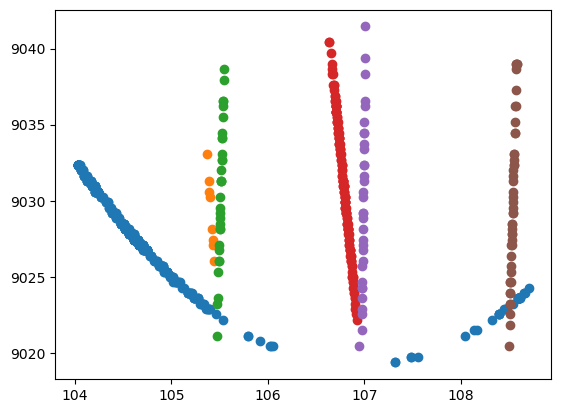

In [268]:
pitches_H = []
E_H = []
plt.figure()
for lidx, points in enumerate(selected_points_by_group.values()):
    sort_idx = np.argsort(pitches[points].squeeze())
    if len(points)>0:
        pitches_H.append(pitches[points].squeeze()[sort_idx])
        
        E_H.append(Eph_seed[points].squeeze()[sort_idx])
        print(lidx,':',points)
        # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
        plt.scatter(pitches_H[lidx],E_H[lidx])
    #plt.plot(test_p[lidx],test_E[lidx])
plt.show()




(8985.177482408131, 9071.448006254886)

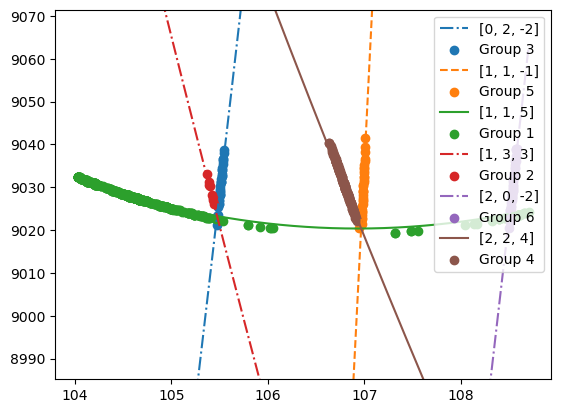

In [269]:
#HtoMeas= [5,4,0,None,2,3,1,None]
HtoMeas= [2,4,0,1,5,3,None,None]

pitch_list = np.linspace(pitches.min(),pitches.max(),num=1001)
for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    if lidx is not None:
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess
        plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
        plt.scatter(pitches_H[lidx],E_H[lidx],label=group_labels[lidx])
plt.legend()
plt.ylim(Eph_seed.min()-30,Eph_seed.max()+30)

In [270]:
pitch_acc += pitches_H
roll_acc += [roll]*len(pitches_H)
E_H_acc += E_H
Hquery_acc += [H for H,l in zip(Hquery,HtoMeas) if l is not None]
ncur = len(HtoMeas_acc)
HtoMeas_acc += [Htol + ncur for Htol in HtoMeas if Htol is not None]


### scan #4

In [271]:
fidx = 4
tt = np.load(datafiles[fidx-1], allow_pickle=True)
# fig, ax1 = plt.subplots(figsize=(8,4))
# ax2 = ax1.twinx()


doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
thresh = tt['spec_hist'].max()/7
# ax1.plot(tt['spec_hist'])
# ax1.axhline(thresh,ls=":",color='tab:red')
# ax2.plot(tt['doocs_vals_hist'])

# ax1.set_xlabel('Sample')
# ax2.set_ylabel('Pitch Angle', color='g')
# ax1.set_ylabel('Intensity', color='b')
# #plt.xlim(16300, 16700)
# plt.show()

filter_arr = []
seeding_energy = []
en = 0
for spectrum in tt['spec_hist']:
    E0=9010
    px1=1000
    ev_px = 0.35
    
    start = E0 - px1*ev_px
    stop = E0 + (1280 - px1) * ev_px
    x = np.linspace(start, stop, num=1280)

    if np.max(spectrum) > thresh and x[np.argmax(spectrum)]>9000 and x[np.argmax(spectrum)]<9045: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch

pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
roll = roll_dict[str(fidx)]
Hquery = Hquery_dict[str(fidx)]
print(Hquery)
# Plot extracted lines
# fig, ax = plt.subplots(figsize=(8,4))

# plt.pcolormesh(np_doocs,tt['phen_scale'],tt['corr2d'].T,shading='auto')
# plt.plot(pitch, seeding_energy, 'r.')
# ax.set_xlabel('Pitch Angle (deg)')
# ax.set_ylabel(r'$E_{ph}$ [eV]')
# plt.show()

['[0, 2, -2]', '[1, 1, -1]', '[1, 1, 5]', '[1, 3, 3]', '[2, 0, -2]', '[2, 2, 4]', '[3, 1, 3]']


In [272]:
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label:[] for label in group_labels}

selected_points_by_group['Group 1'] = [1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 99, 101, 102, 108, 113, 114, 124, 141, 145, 150, 152, 156, 161, 164, 168, 177, 194, 195, 207, 211, 218, 219, 240, 241, 244, 246, 248, 251, 278, 283, 287, 288, 289, 291, 296, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 391, 392, 393, 394]
selected_points_by_group['Group 2'] = [91, 92, 269, 270, 271, 272, 273, 274, 275, 276, 277, 279, 280, 281, 282, 284, 285, 286, 290, 292, 293, 294, 295, 297, 265, 266, 267, 268, 107, 109, 110, 111, 112, 115, 116, 117, 118, 119, 120, 121, 122, 123, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 142, 143, 144, 146, 147, 148, 149, 151, 153, 154, 155, 157, 158, 159, 160, 162, 163, 165, 166, 167, 169, 170, 171, 172, 173, 174, 175, 176, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 208, 209, 210, 212, 213, 214, 215, 216, 217, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 242, 243, 245, 247, 249, 250, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 103, 104, 105, 106, 107, 109, 110, 111, 112, 115, 116, 117, 118, 119, 120, 121, 122, 123, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 142, 143, 144, 146, 147, 148, 149, 151, 153, 154, 155, 157, 158, 159, 160, 162, 163, 165, 166, 167, 169, 170, 171, 172, 173, 174, 175, 176, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 208, 209, 210, 212, 213, 214, 215, 216, 217, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 242, 243, 245, 247, 249, 250, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 94, 95]
selected_points_by_group['Group 3'] = [100, 98, 97, 96]

0 : [1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 99, 101, 102, 108, 113, 114, 124, 141, 145, 150, 152, 156, 161, 164, 168, 177, 194, 195, 207, 211, 218, 219, 240, 241, 244, 246, 248, 251, 278, 283, 287, 288, 289, 291, 296, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 391, 392, 393

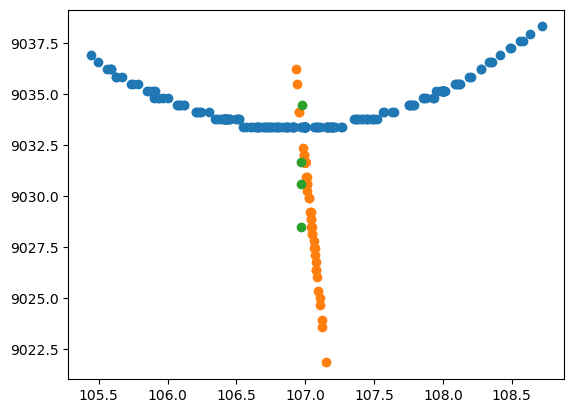

In [273]:
pitches_H = []
E_H = []
plt.figure()
for lidx, points in enumerate(selected_points_by_group.values()):
    sort_idx = np.argsort(pitches[points].squeeze())
    if len(points)>0:
        pitches_H.append(pitches[points].squeeze()[sort_idx])
        
        E_H.append(Eph_seed[points].squeeze()[sort_idx])
        print(lidx,':',points)
        # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
        plt.scatter(pitches_H[lidx],E_H[lidx])
    #plt.plot(test_p[lidx],test_E[lidx])
plt.show()

(8988.329945269743, 9071.448006254886)

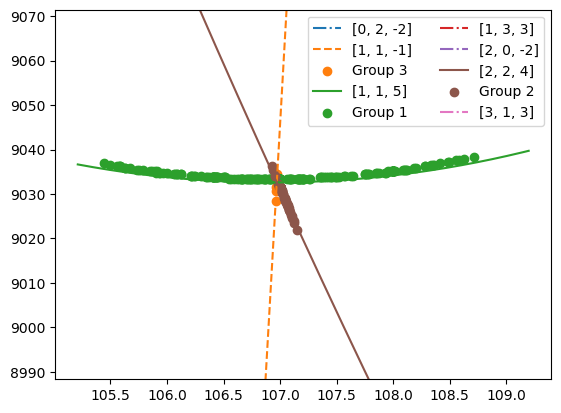

In [274]:
HtoMeas = [None, 2, 0, None, None, 1, None]
pitch_list = np.linspace(pitches.min(),pitches.max(),num=1001)
for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll],dPguess,dRguess,dYguess,dRPguess)
    EBragg = np.array(EBragg) + Ecorrguess
    l = plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)[0]
    if lidx is not None:
        plt.scatter(pitches_H[lidx],E_H[lidx],color=l.get_color(),label=group_labels[lidx])
plt.legend(ncols=2)
plt.ylim(Eph_seed.min()-30,Eph_seed.max()+30)

In [275]:
pitch_acc += pitches_H
roll_acc += [roll]*len(pitches_H)
E_H_acc += E_H
Hquery_acc += [H for H,l in zip(Hquery,HtoMeas) if l is not None]
ncur = len(HtoMeas_acc)
HtoMeas_acc += [Htol + ncur for Htol in HtoMeas if Htol is not None]


### scan #6

In [276]:
fidx = 6
tt = np.load(datafiles[fidx-1], allow_pickle=True)


# fig, ax1 = plt.subplots(figsize=(8,4))
# ax2 = ax1.twinx()



doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
thresh = tt['spec_hist'].max()/6
# ax1.plot(tt['spec_hist'])
# ax1.axhline(thresh,ls=":",color='tab:red')
# ax2.plot(tt['doocs_vals_hist'])

# ax1.set_xlabel('Sample')
# ax2.set_ylabel('Pitch Angle', color='g')
# ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()

# filter_arr = []
# seeding_energy = []
# en = 0
# x = tt['phen_scale']
# for spectrum in tt['spec_hist']:

#     if np.max(spectrum) > thresh and x[np.argmax(spectrum)]>9230 and x[np.argmax(spectrum)]<9270: ## Adjust this number to adjust threshold 
#         filter_arr.append(True)
#         seeding_energy.append(x[np.argmax(spectrum)]+en)
#     else:
#         filter_arr.append(False)


# pitch = tt['doocs_vals_hist'][filter_arr]
# seeding_energy_dict[str(fidx)] = seeding_energy
# pitch_dict[str(fidx)] = pitch
# Plot extracted lines
seeding_energy = seeding_energy_dict[str(fidx)]
pitch = pitch_dict[str(fidx)]
# fig, ax = plt.subplots(figsize=(8,4))

# plt.pcolormesh(np_doocs,tt['phen_scale'] ,tt['corr2d'].T,shading='auto')
# plt.plot(pitch, seeding_energy, 'r.')
# ax.set_xlabel('Pitch Angle (deg)')
# ax.set_ylabel(r'$E_{ph}$ [eV]')
# plt.show()
pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
roll = roll_dict[str(fidx)]
#bmir.cryst.yaw = np.deg2rad(dY)
#Pitch = np.deg2rad(pitches)
Hquery = Hquery_dict[str(fidx)]
print(Hquery)

['[0, 0, 4]']


In [277]:
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label: [] for label in group_labels}

selected_points_by_group['Group 1'] = [  0,   1,   2,   3,  4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,   24,  25,  26,   27,  28, 29, 30, 31, 32, 33, 34, 35,  36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125, 126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146]

0 : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146]


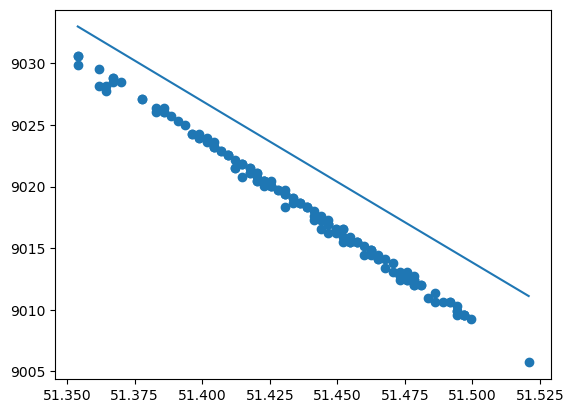

In [278]:
pitches_H = []
E_H = []
HtoMeas = [0]
MeastoH = [0]
plt.figure()
pitch_list = np.linspace(pitches.min(),pitches.max(),num=1001)
for lidx, points in enumerate(selected_points_by_group.values()):
    if len(points)>0:
        pitches_H.append(pitches[points].squeeze())
        E_H.append(Eph_seed[points].squeeze())
        print(lidx,':',points)
        # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
        plt.scatter(pitches_H[lidx],E_H[lidx])
        Hidx = MeastoH[lidx]
        H = Hquery[Hidx]
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess

        plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
plt.show()

In [279]:
pitch_acc += pitches_H
roll_acc += [roll]*len(pitches_H)
E_H_acc += E_H
Hquery_acc += [H for H,l in zip(Hquery,HtoMeas) if l is not None]
ncur = len(HtoMeas_acc)
HtoMeas_acc += [Htol + ncur for Htol in HtoMeas if Htol is not None]


### scan # 13 (with strong energy correction)

In [280]:
fidx = 13
en = 220.205399303666535
tt = np.load(datafiles[fidx-1], allow_pickle=True)


# fig, ax1 = plt.subplots(figsize=(8,4))
# ax2 = ax1.twinx()



doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
np_phen = tt['phen_scale']-en
thresh = tt['spec_hist'].max()/3
# ax1.plot(tt['spec_hist'])
# ax1.axhline(thresh,ls=":",color='tab:red')
# ax2.plot(tt['doocs_vals_hist'])

# ax1.set_xlabel('Sample')
# ax2.set_ylabel('Pitch Angle', color='g')
# ax1.set_ylabel('Intensity', color='b')
# #plt.xlim(16300, 16700)
# plt.show()

filter_arr = []
seeding_energy = []
#en = 0
x = np_phen
for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh and x[np.argmax(spectrum)]>9010 and x[np.argmax(spectrum)]<9050: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)])
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
# Plot extracted lines
seeding_energy = seeding_energy_dict[str(fidx)]
pitch = pitch_dict[str(fidx)]

pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
roll = roll_dict[str(fidx)]
Hquery = Hquery_dict[str(fidx)]
#print(Hquery)
# fig, ax = plt.subplots(figsize=(8,4))

# plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
# plt.plot(pitch, seeding_energy, 'r.')
# ax.set_xlabel('Pitch Angle (deg)')
# ax.set_ylabel(r'$E_{ph}$ [eV]')
# plt.show()


In [281]:
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label:[] for label in group_labels}

selected_points_by_group['Group 1'] = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127]
selected_points_by_group['Group 2'] = [128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143]
selected_points_by_group['Group 3'] = [146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178]
selected_points_by_group['Group 4'] = [179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191]
selected_points_by_group['Group 5'] = [192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 231, 232, 230, 231, 232, 231, 232, 231, 232, 233, 234, 235, 235, 236, 237, 240, 239, 240, 238]
selected_points_by_group['Group 6'] = [246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 244, 245, 243, 241, 242]
selected_points_by_group['Group 7'] = [264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295]

1 : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127]
2 : [128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143]
3 : [146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178]
4 : [179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191]
5 : [192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 

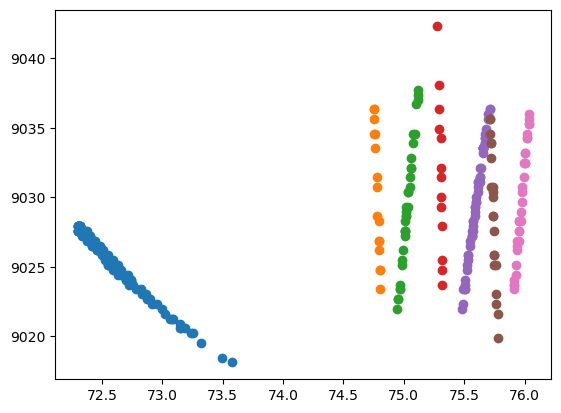

In [282]:
pitches_H = []
E_H = []
plt.figure()
for lidx, points in enumerate(selected_points_by_group.values()):
    sort_idx = np.argsort(pitches[points].squeeze())
    pitches_H.append(pitches[points].squeeze()[sort_idx])
    
    E_H.append(Eph_seed[points].squeeze()[sort_idx])
    print(lidx+1,':',points)
    # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
    plt.scatter(pitches_H[lidx],E_H[lidx])
    #plt.plot(test_p[lidx],test_E[lidx])
plt.show()

In [283]:
HtoMeas = [5,0,3,6,1,4,2]

(8998.124545966077, 9062.293427905091)

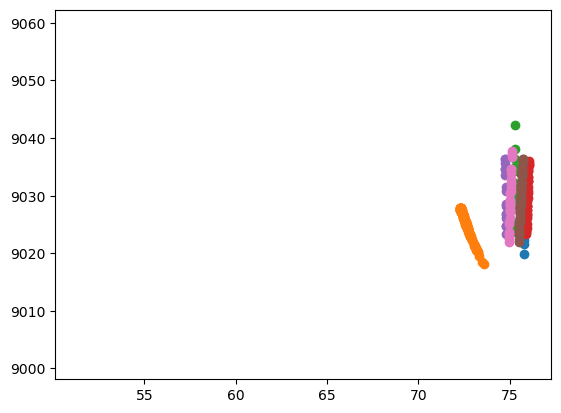

In [284]:
for Hidx, H in enumerate(Hquery):
    EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll],dPconv,dRconv,dYconv,dRPconv)
    EBragg = np.array(EBragg) + Ecorrconv
    plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
    lidx = HtoMeas[Hidx]
    pitchi = pitches_H[lidx]
    if pitchi.size>0:
        plt.scatter(pitchi,E_H[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.ylim(min(Eph_seed)-20,max(Eph_seed)+20)

In [285]:
pitch_acc += pitches_H
roll_acc += [roll]*len(pitches_H)
E_H_acc += E_H
Hquery_acc += [H for H,l in zip(Hquery,HtoMeas) if l is not None]
ncur = len(HtoMeas_acc)
HtoMeas_acc += [Htol + ncur for Htol in HtoMeas if Htol is not None]


### plot lines together

(8768.124545966077, 9292.293427905091)

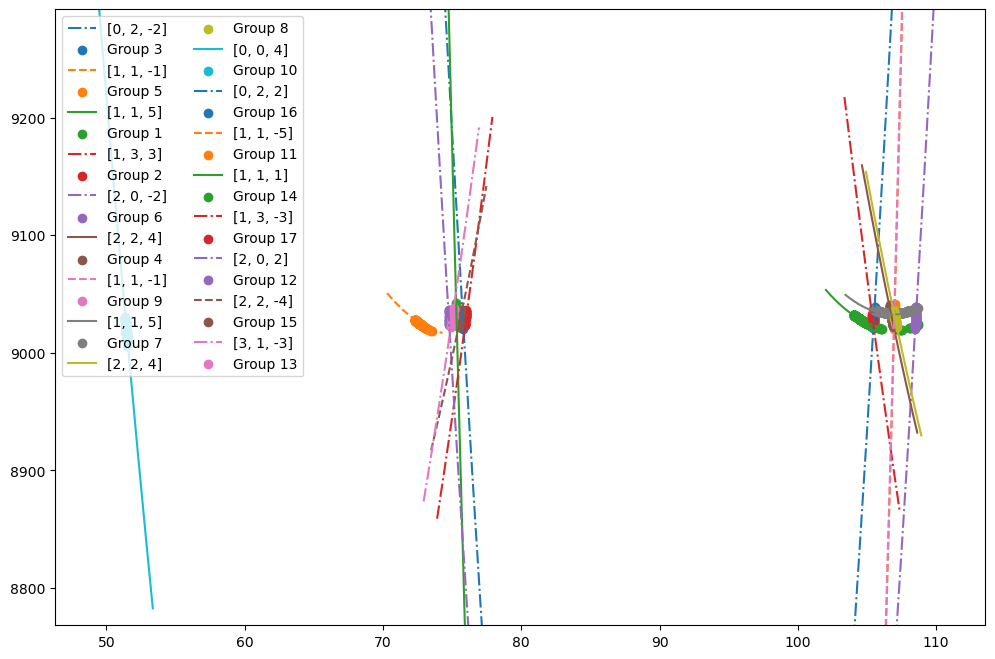

In [286]:
# dPconv, dRconv, dYconv, dRPconv, Ecorrconv =  [2.41322609e+00, -5.00000000e+00, -9.33453740e+00, -9.44353028e-03,  4.65311758e+01]
# dPconv, dRconv, dYconv, dRPconv, Ecorrconv = [1.15235012e+00,  6.04787206e-02,  9.34291663e-01, -1.39320701e-02, -1.63462257e+01]
#dP,dR,dY,Ecorr = res.x

# dPconv, dRconv, dYconv, dRPconv, Ecorrconv=[0.55665728, -1.54318923, -2.18807843,  0.02009495,  1.04564738]
#[ 1.4,  -2.3 ,0.2, 0, -1.63462257e+01]
pitch_list = np.linspace(min(pitches),max(pitches),1000) 
RollQuery = np.deg2rad(np.linspace(-3,3,9))
# phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dPconv, dRconv, dYconv, dRPconv, roll, pitch_list)
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery_acc):
    lidx = HtoMeas_acc[Hidx]
    pitchi = pitch_acc[lidx]
    if pitchi.size>0:
        pitch_list = np.linspace(min(pitchi)-2,min(pitchi)+2,1000) 
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll_acc[lidx]],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrconv
        plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
        ax.scatter(pitchi,E_H_acc[lidx],label=f'Group {lidx+1}')


#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)
plt.ylim(min(Eph_seed)-250,max(Eph_seed)+250)





### do the fit

1
[ 1.15147222e+00  8.37924597e-01 -9.24811447e-01  1.39605589e-02
 -1.64749145e+01] 5.265679572675132


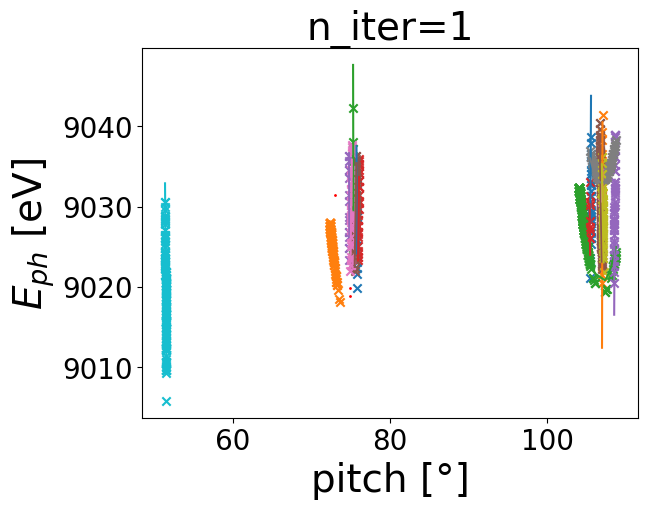

51
[ 1.14892797e+00  9.88176964e-01 -9.58028550e-01  1.20909165e-02
 -1.69233849e+01] 1.8412369263278814


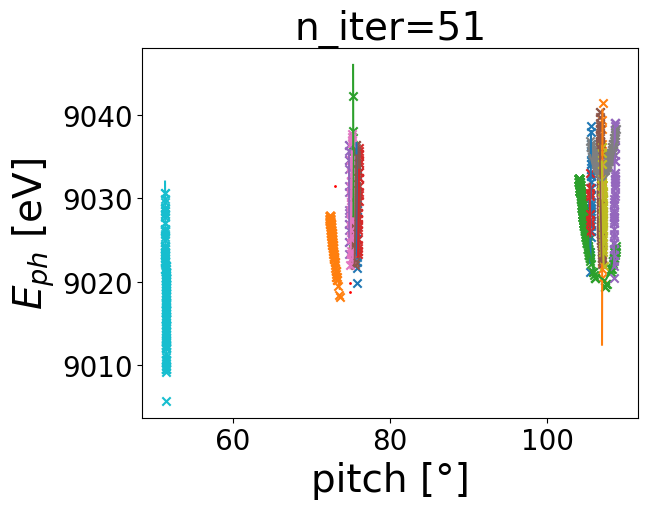

101
[ 1.14473174e+00  1.11084791e+00 -1.01720771e+00  1.07467709e-02
 -1.68871494e+01] 1.1595952302278039


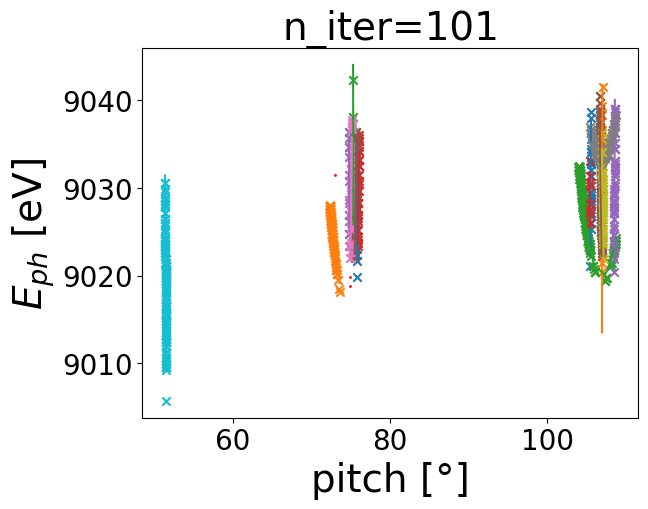

151
[ 1.14473859e+00  1.10989775e+00 -1.01729124e+00  1.07577704e-02
 -1.68970005e+01] 1.1591114906742763


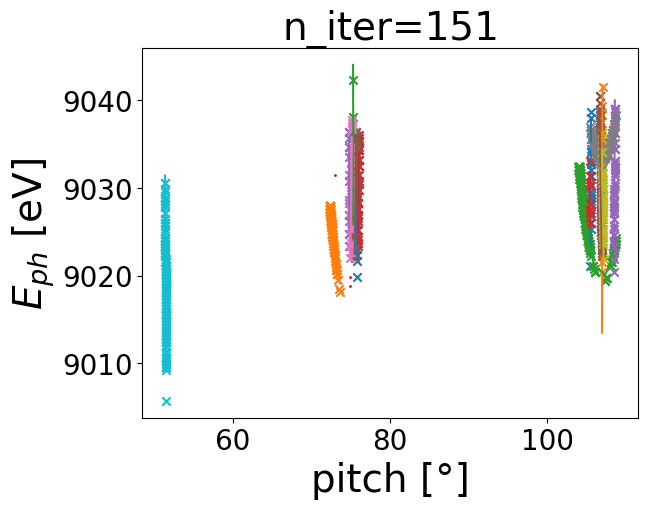

201
[ 1.14473817e+00  1.10990901e+00 -1.01729259e+00  1.07576410e-02
 -1.68967366e+01] 1.1591077416795803


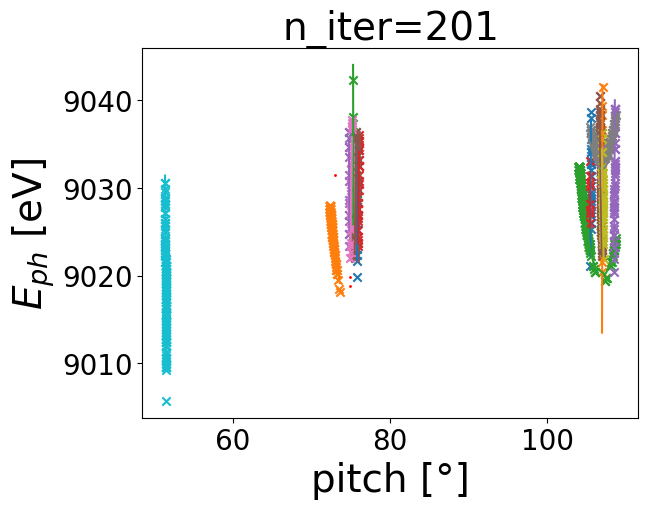

251
[ 1.14473859e+00  1.10990699e+00 -1.01729259e+00  1.07576233e-02
 -1.68969850e+01] 1.1591075992592759


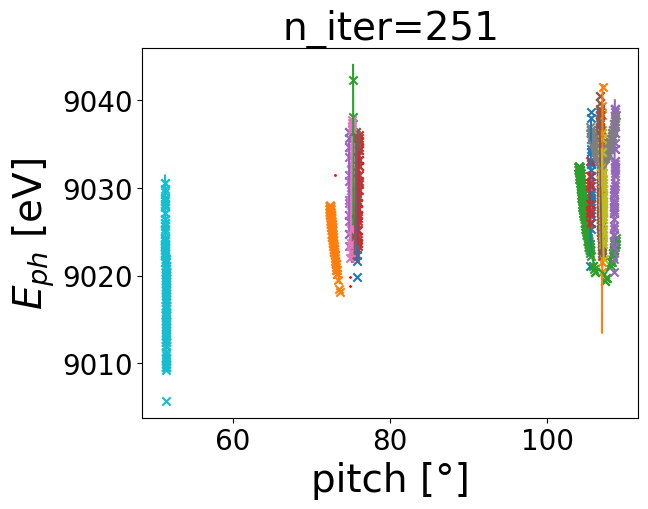

301
[ 1.14473852e+00  1.10991019e+00 -1.01729259e+00  1.07575876e-02
 -1.68970327e+01] 1.1591075967360132


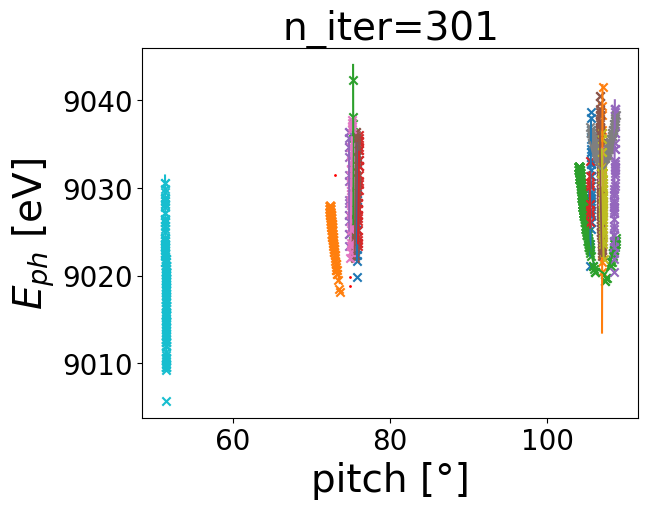

351
[ 1.14473852e+00  1.10991002e+00 -1.01729259e+00  1.07575895e-02
 -1.68970353e+01] 1.1591075967253088


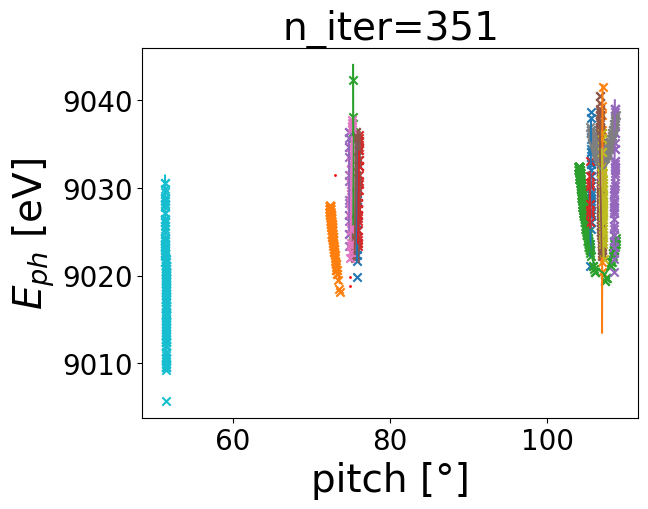

401
[ 1.14473852e+00  1.10991002e+00 -1.01729259e+00  1.07575895e-02
 -1.68970353e+01] 1.159107596725177


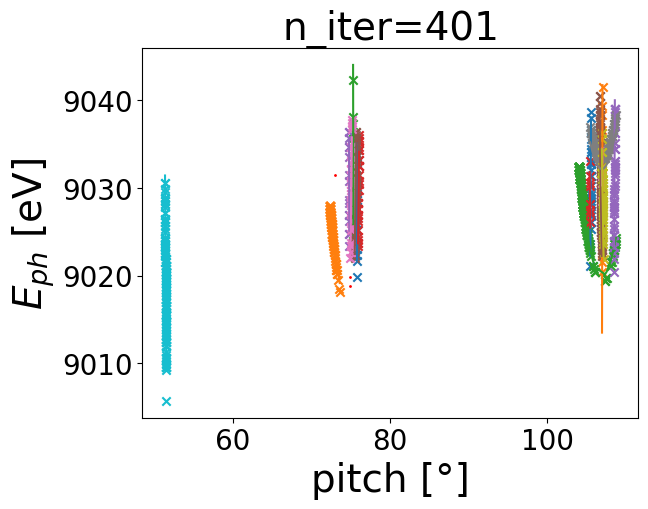

Optimization terminated successfully.
         Current function value: 1.159108
         Iterations: 428
         Function evaluations: 810
429
[ 1.14473852e+00  1.10991002e+00 -1.01729259e+00  1.07575895e-02
 -1.68970353e+01] 1.1591075967251199


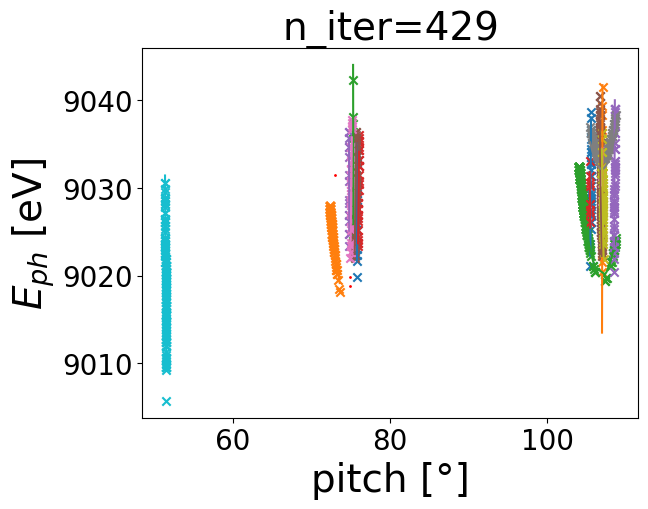

[ 1.14473852e+00  1.10991002e+00 -1.01729259e+00  1.07575895e-02
 -1.68970353e+01]


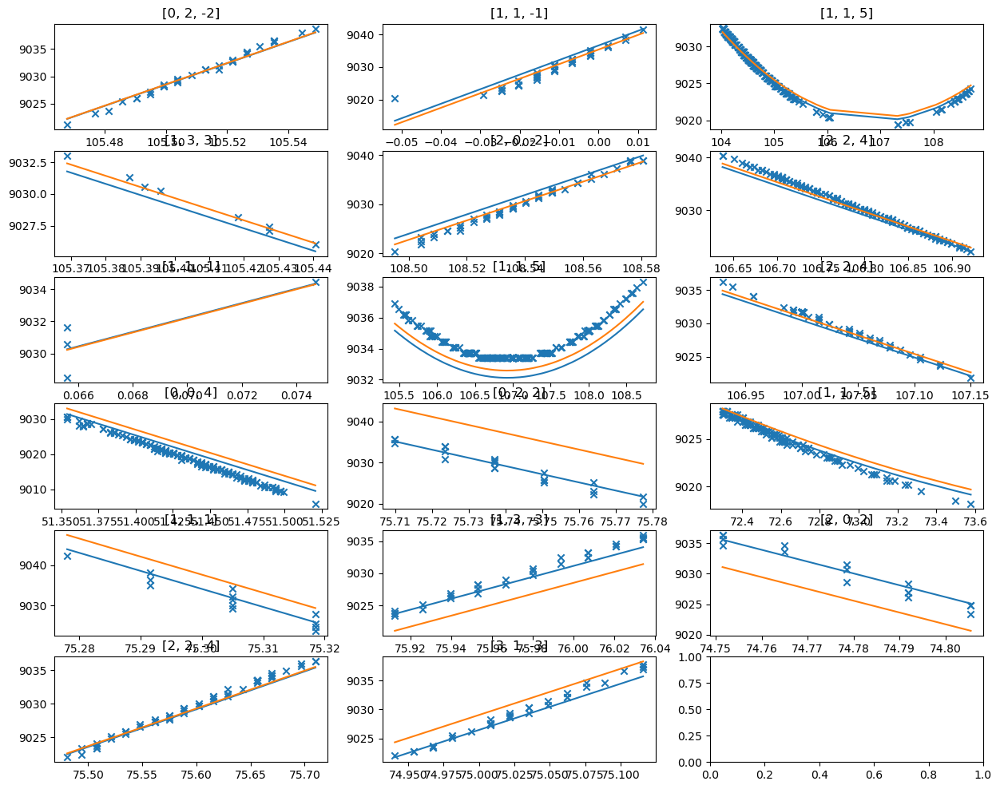

In [287]:
#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0

    for Hidx, H in enumerate(Hquery_acc):
        lidx = HtoMeas_acc[Hidx]
        if lidx is not None:
            peval = pitch_acc[lidx]
            if peval.size>0 :
                EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dP,dR,dY,dPR)
                EBraggs = np.array(EBraggs) +Ecorr
                cost += np.sum((EBraggs-E_H_acc[lidx])**2)/peval.size**2
    return 1/cost
  
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery_acc):
            lidx = HtoMeas_acc[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            if lidx is not None:
                peval = pitch_acc[lidx]
                if peval.size>0:
                    EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dP,dR,dY,dPR)
                    EBragg = np.array(EBragg) +Ecorr

            #print(peval_sub.min(),peval_sub.max())
                    plt.scatter(peval,E_H_acc[lidx],marker='x')
                    plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
#x0 = np.array([0, 0, 5, 0, -16.12]) 
x0 = np.array([dPguess, dRguess, dYguess, dRPguess, Ecorrguess])
# x0 = np.array([dPconv, dRconv, dYconv, dRPconv, Ecorrconv])
bounds = ([0.9,1.4],[-3,3],[1.1*dYconv,0.9*dYconv],[-0.2,0.2],[-17,-14])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
dPconv,dRconv,dYconv,dRPconv,Ecorrconv = res.x
print(res.x)

# plot individual lines
nlines = len(pitch_acc)
ncols = min(3,nlines)
nrows = -(nlines // -3)

fig, axs = plt.subplots(nrows=nrows,ncols=ncols,figsize=(15,ncols*(4)))
for Hidx,H in enumerate(Hquery_acc):
    lidx = HtoMeas_acc[Hidx]
    ax = axs.flatten()[Hidx]
    ax.set_title(H)
    if lidx is not None:
        peval = pitch_acc[lidx]
        if peval.size>0:
            EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPconv,dRconv,dYconv,dRPconv)
            EBragg = np.array(EBragg) +Ecorrconv
            EBragg_guess,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPguess,dRguess,dYguess,dRPguess)
            EBragg_guess = np.array(EBragg_guess) +Ecorrguess

    #print(peval_sub.min(),peval_sub.max())
            ax.scatter(peval,E_H_acc[lidx],marker='x')
            ax.plot(peval,EBragg)
            ax.plot(peval,EBragg_guess)

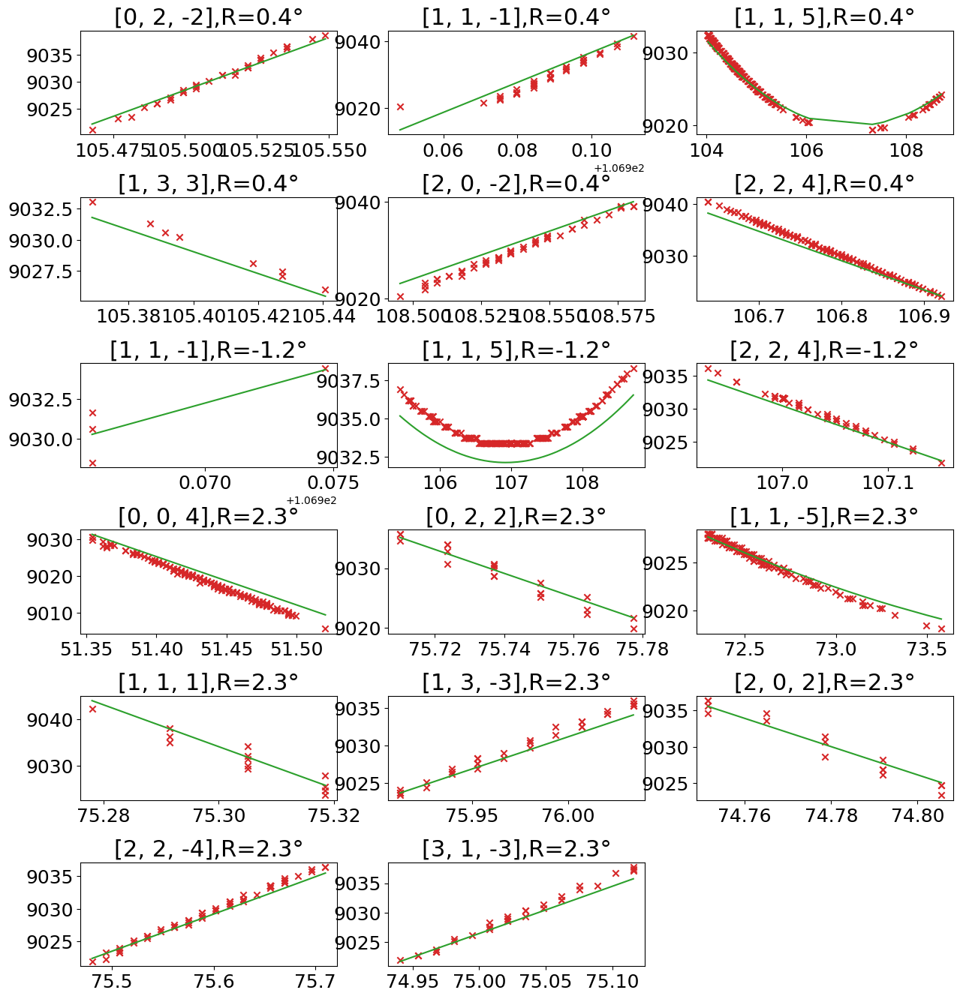

In [306]:
nlines = len(pitch_acc)
ncols = min(3,nlines)
nrows = -(nlines // -3)

withGuess = False
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,figsize=(15,ncols*(5)+(ncols-1)*0.6),gridspec_kw={'hspace':0.6})

for i in range(nlines,axs.size):
    axs.flatten()[i].set_visible(False)
for Hidx,H in enumerate(Hquery_acc):
    lidx = HtoMeas_acc[Hidx]
    ax = axs.flatten()[Hidx]
    ax.set_title(f"{H},R={roll_acc[lidx]:.1f}°",fontsize=22)
    ax.tick_params(labelsize=18)
    if lidx is not None:
        peval = pitch_acc[lidx]
        if peval.size>0:
            EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPconv,dRconv,dYconv,dRPconv)
            EBragg = np.array(EBragg) +Ecorrconv
            

    #print(peval_sub.min(),peval_sub.max())
            ax.scatter(peval,E_H_acc[lidx],marker='x',color='tab:red')
            ax.plot(peval,EBragg,color='tab:green')
            if withGuess:
                EBragg_guess,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPguess,dRguess,dYguess,dRPguess)
                EBragg_guess = np.array(EBragg_guess) +Ecorrguess
                ax.plot(peval,EBragg_guess)

## more crossing

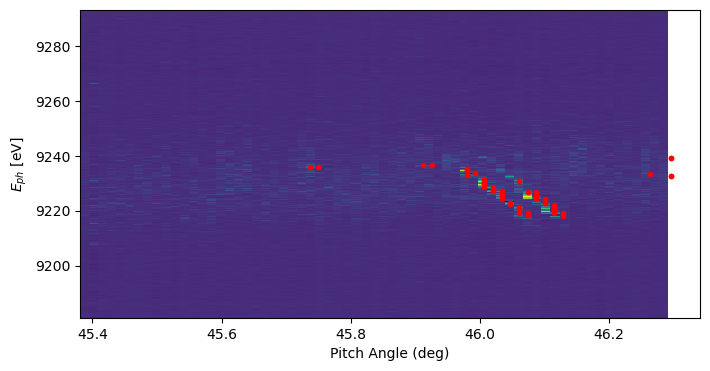

In [130]:
fidx = 19
Hquery_dict[str(fidx)]
tt = np.load(datafiles[fidx-1])
tt = np.load(datafiles[fidx-1], allow_pickle=True)
# fig, ax1 = plt.subplots(figsize=(8,4))
# ax2 = ax1.twinx()

np_phen = tt['phen_scale']
doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
thresh = tt['spec_hist'].max()/7
# ax1.plot(tt['spec_hist'])
# ax1.axhline(thresh,ls=":",color='tab:red')
# ax2.plot(tt['doocs_vals_hist'])

# ax1.set_xlabel('Sample')
# ax2.set_ylabel('Pitch Angle', color='g')
# ax1.set_ylabel('Intensity', color='b')
# #plt.xlim(16300, 16700)
# plt.show()

filter_arr = []
seeding_energy = []
en = 0
x = np_phen
for spectrum in tt['spec_hist']:
    # E0=9010
    # px1=1000
    # ev_px = 0.35
    
    # start = E0 - px1*ev_px
    # stop = E0 + (1280 - px1) * ev_px
    # x = np.linspace(start, stop, num=1280)

    if np.max(spectrum) > thresh : ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()

-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996
-0.19999999999999996


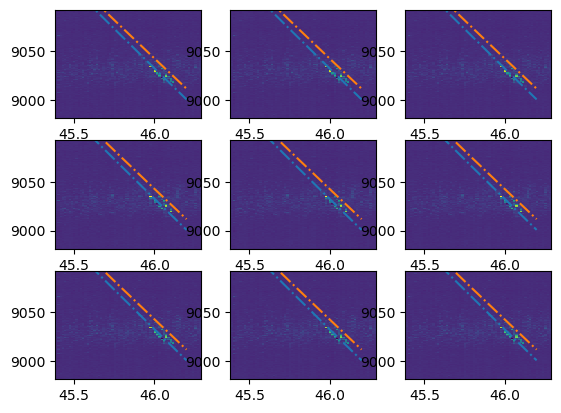

In [151]:
Hquery = ['[1,-1,-3]','[1,-1,3]']
pitch_list = np.linspace(45.4,46.2,num=1001)
roll = [0.5-0.7]

yaw_query = np.linspace(-3,3,num=9)
fig,axs = plt.subplots(ncols=3,nrows=3)

for yidx,yaw in enumerate(yaw_query):
    ax  = axs.flatten()[yidx]
    ax.pcolormesh(np_doocs,np_phen-200,tt['corr2d'].T,shading='auto')
    for H in Hquery:
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,roll,dPconv,dRconv,dYconv,0)
        EBragg = [E for E in EBragg]
    #EBragg = np.array(EBragg) + Ecorrconv
        ax.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
    ax.set_ylim(np_phen.min()-200,np_phen.max()-200)    

    #ax.scatter(pitchi,E_H_acc[lidx],label=f'Group {lidx+1}')

### imposing strong error in photon energy, scan #13

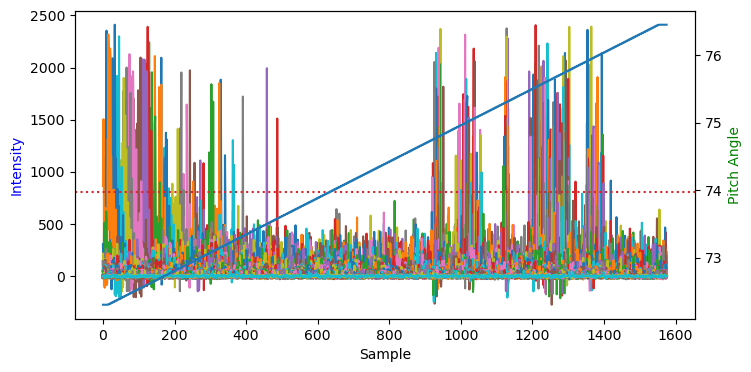

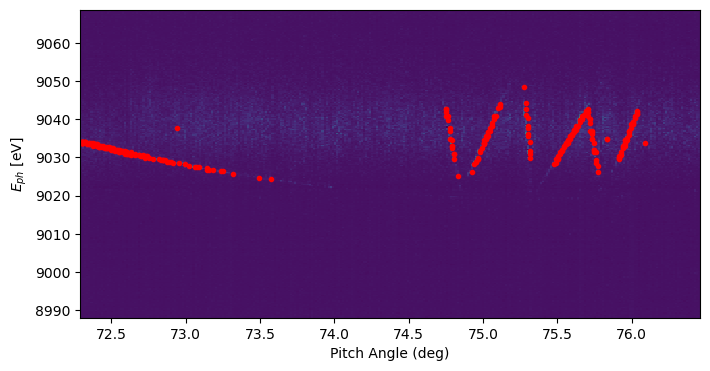

In [256]:
fidx = 13
en = 220.205399303666535
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()



doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
np_phen = tt['phen_scale']-en
thresh = tt['spec_hist'].max()/3
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()

filter_arr = []
seeding_energy = []
#en = 0
x = np_phen
for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh and x[np.argmax(spectrum)]>9010 and x[np.argmax(spectrum)]<9050: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)])
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
# Plot extracted lines
seeding_energy = seeding_energy_dict[str(fidx)]
pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()


In [257]:
#fidx = 3
pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
roll = roll_dict[str(fidx)]
Hquery = Hquery_dict[str(fidx)]
print(Hquery)

['[0, 2, 2]', '[1, 1, -5]', '[1, 1, 1]', '[1, 3, -3]', '[2, 0, 2]', '[2, 2, -4]', '[3, 1, -3]']


#### select points and groups by hand

In [230]:
%matplotlib widget

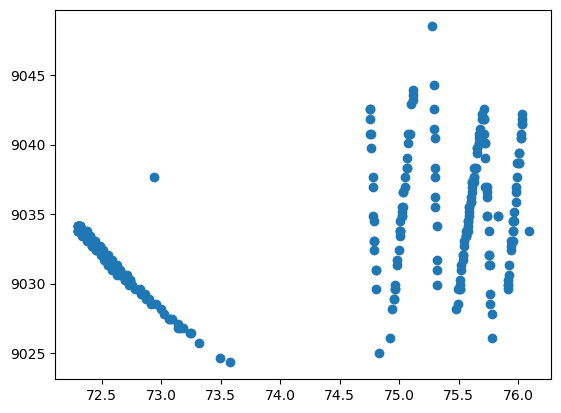

In [250]:
fig, ax = plt.subplots()
scatter = ax.scatter(pitches, Eph_seed,picker=True)

# Interactive point selection
#cursor = mplcursors.cursor(sc, hover=True)
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label: [] for label in group_labels}

current_group_idx = 0
deselect_mode = False

# Function to change the color of the selected points based on the current group
def update_point_colors(selected, colors):
    scatter.set_facecolor(['gray'] * len(pitches))  # Reset all points to default color
    for idx, (group, points) in enumerate(selected_points_by_group.items()):
        if points:
            color = group_colors[idx]
            selected_points = np.array(points)
            scatter._facecolors[selected_points[:].astype(int)]=np.repeat([mcolors.to_rgba(color)],selected_points.shape[0],axis=0)
            # scatter._facecolors[selected_points[:, 0].astype(int)] = mcolors.to_rgb(color)
    fig.canvas.draw()

# Function to handle point selection with lasso
def onselect_lasso(verts):
    global current_group_idx
    path = Path(verts)
    selected = path.contains_points(np.column_stack((pitches, Eph_seed)))
    selected_indices = np.where(selected)[0]

    for i in selected_indices:
        if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
            del selected_points_by_group[group_labels[current_group_idx]][i]
        elif not deselect_mode:  # Select point if 'd' is not pressed
            selected_points_by_group[group_labels[current_group_idx]].append(i)

    print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
    update_point_colors(selected_indices, group_colors)

def on_pick(event):
    if event.mouseevent.button == 1:
        selected_indices = event.ind
        for i in selected_indices:
            if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
                loc_idx = np.where(selected_points_by_group[group_labels[current_group_idx]]==i)
                print(loc_idx[0][0])
                del selected_points_by_group[group_labels[current_group_idx]][loc_idx[0][0]]
            elif not deselect_mode:  # Select point if 'd' is not pressed
                selected_points_by_group[group_labels[current_group_idx]].append(i)
        #print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
        update_point_colors(selected_indices, group_colors)
    # xdata = x[ind[0]]
    # ydata = y[ind[0]]

    
    #xdata, ydata = line.get_data()
    #ind = event.ind
    
    #print(f'on pick line: {xdata[ind]}, {ydata[ind]}')

cid = fig.canvas.mpl_connect('pick_event', on_pick)

# Lasso and Rectangle selectors
lasso = LassoSelector(ax, onselect_lasso)


# Function to handle key press events (switch groups with 'n' or 'p')
def on_key(event):
    global current_group_idx, deselect_mode
    if event.key == 'n':  # Switch to the next group on pressing 'n'
        current_group_idx = (current_group_idx + 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'm' and current_group_idx>1:  # Switch to the previous group on pressing 'p'
        current_group_idx = (current_group_idx - 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'd':  # Switch deselect mode
        if deselect_mode:
            deselect_mode = False
            print("Switched off deselect mode")
        else:
            deselect_mode = True
            print("Switched on deselect mode")

    

# Connect the key press event
fig.canvas.mpl_connect('key_press_event', on_key)

plt.show()

In [233]:
%matplotlib inline

In [258]:
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label:[] for label in group_labels}

selected_points_by_group['Group 1'] = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127]
selected_points_by_group['Group 2'] = [128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143]
selected_points_by_group['Group 3'] = [146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178]
selected_points_by_group['Group 4'] = [179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191]
selected_points_by_group['Group 5'] = [192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 231, 232, 230, 231, 232, 231, 232, 231, 232, 233, 234, 235, 235, 236, 237, 240, 239, 240, 238]
selected_points_by_group['Group 6'] = [246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 244, 245, 243, 241, 242]
selected_points_by_group['Group 7'] = [264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295]

1 : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127]
2 : [128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143]
3 : [146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178]
4 : [179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191]
5 : [192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 

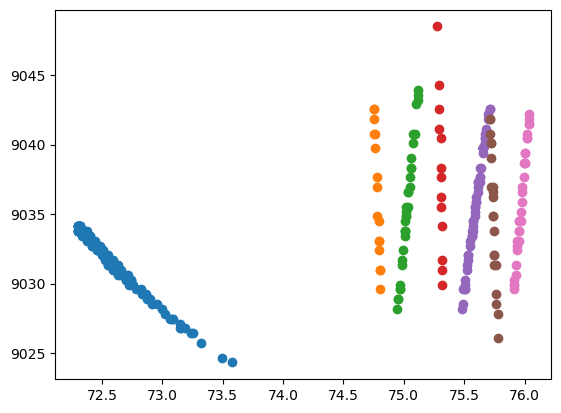

In [259]:
pitches_H = []
E_H = []
plt.figure()
for lidx, points in enumerate(selected_points_by_group.values()):
    sort_idx = np.argsort(pitches[points].squeeze())
    pitches_H.append(pitches[points].squeeze()[sort_idx])
    
    E_H.append(Eph_seed[points].squeeze()[sort_idx])
    print(lidx+1,':',points)
    # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
    plt.scatter(pitches_H[lidx],E_H[lidx])
    #plt.plot(test_p[lidx],test_E[lidx])
plt.show()

#### get an idea about the angles

-3.0
-2.25
-1.5
-0.75
0.0
0.75
1.5
2.25
3.0


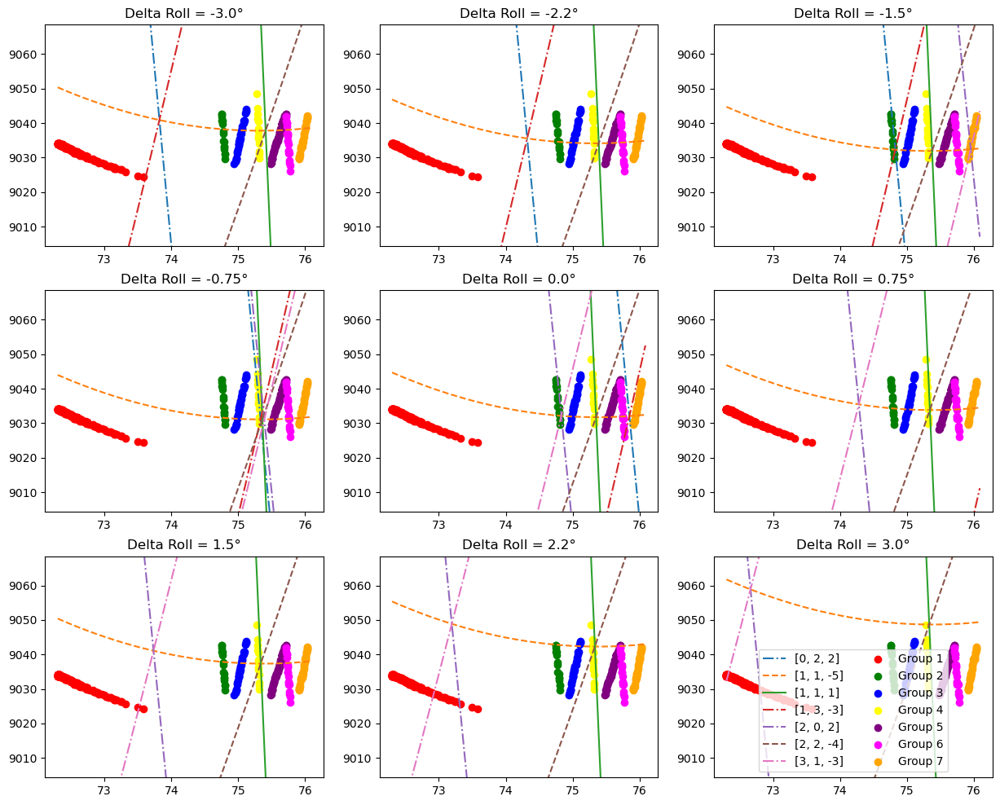

In [260]:
pitch_list = np.linspace(min(pitches),max(pitches),1000) 
RollQuery = np.linspace(-3,3,9)
# phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dPconv, dRconv, dYconv, dRPconv, roll, pitch_list)
fig, axs = plt.subplots(ncols=3,nrows=3,figsize=(15,12))
#ax.scatter(pitches,seeding_energy,color='red')
#roll = -1.2
for Ridx,dR in enumerate(RollQuery):
    ax = axs.flatten()[Ridx]
    ax.set_title(f"Delta Roll = {dR:.2}°")
    print(dR)
    for Hidx, H in enumerate(Hquery):
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll+dR],dPconv,dRconv,dYconv,dRPconv)
        EBragg = np.array(EBragg) #+ Ecorrconv
        ax.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
    for lidx,pitchi in enumerate(pitches_H):
            if pitchi.size>0:
                ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx],label=group_labels[lidx])
    #plt.scatter(pitches,Eph_seed,color='red',s=1)
    ax.set_ylim(min(Eph_seed)-20,max(Eph_seed)+20)
plt.legend(ncols=2)

In [261]:
HtoMeas = [5,0,3,6,1,4,2]

(9004.329945269743, 9068.498827208758)

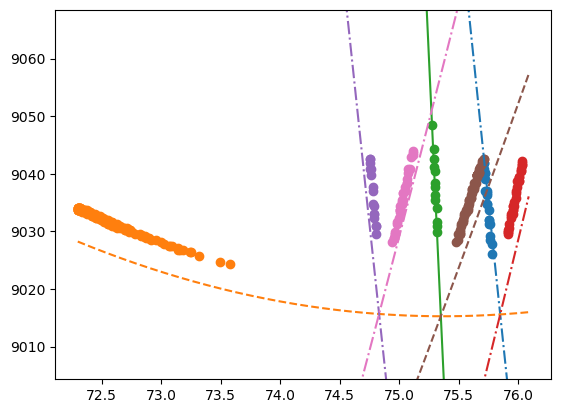

In [262]:
for Hidx, H in enumerate(Hquery):
    EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll],dPconv,dRconv,dYconv,dRPconv)
    EBragg = np.array(EBragg) + Ecorrconv
    plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
    lidx = HtoMeas[Hidx]
    pitchi = pitches_H[lidx]
    if pitchi.size>0:
        plt.scatter(pitchi,E_H[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.ylim(min(Eph_seed)-20,max(Eph_seed)+20)

### fit

[5, 0, 3, 6, 1, 4, 2]
1
[ 1.15147222e+00  7.98023426e-01 -9.24811447e-01  1.46585869e-02
 -1.64749145e+01] 6.721421924262455


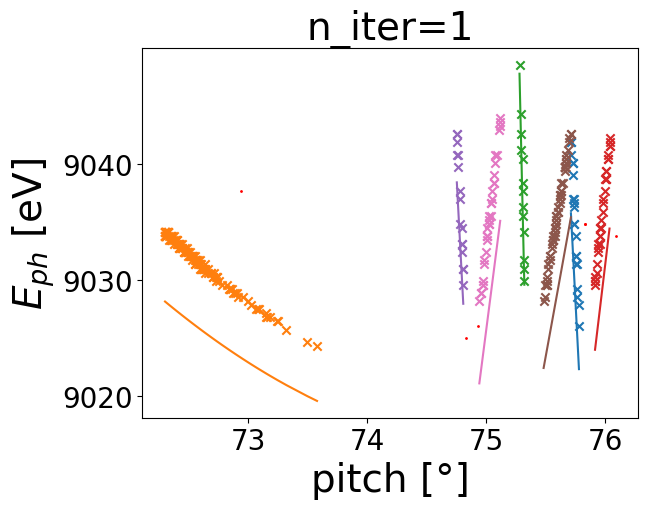

51
[ 1.15315333e+00  8.12232898e-01 -9.26040367e-01  1.44012464e-02
 -1.50000000e+01] 3.699812501093714


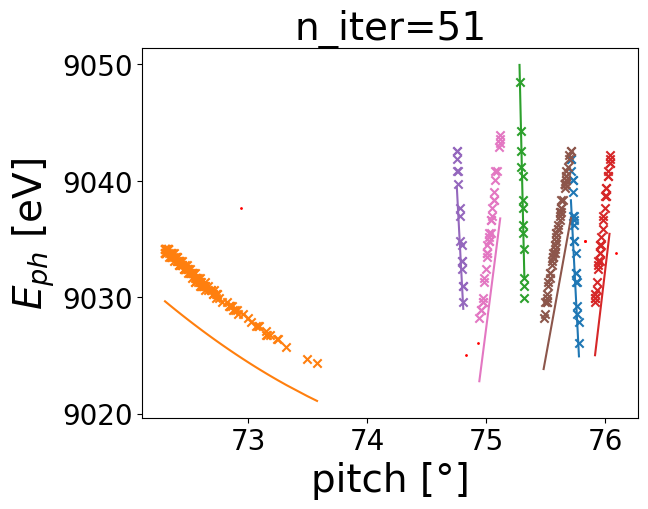

101
[ 1.15200377e+00  1.75208194e+00 -9.15882844e-01  1.82904684e-03
 -1.50000000e+01] 3.5840615534777585


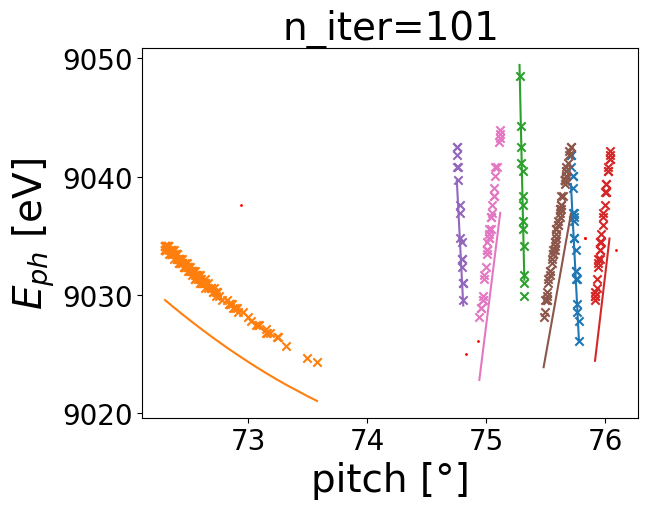

151
[ 1.15162125e+00  2.21384090e+00 -9.16052220e-01 -4.26857955e-03
 -1.50000000e+01] 3.5467384640345956


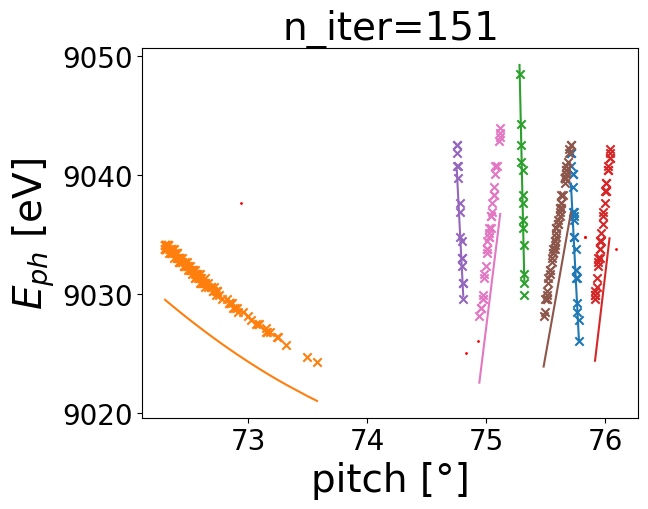

201
[ 1.15161691e+00  2.21556846e+00 -9.16053749e-01 -4.29147314e-03
 -1.50000000e+01] 3.5467380624759093


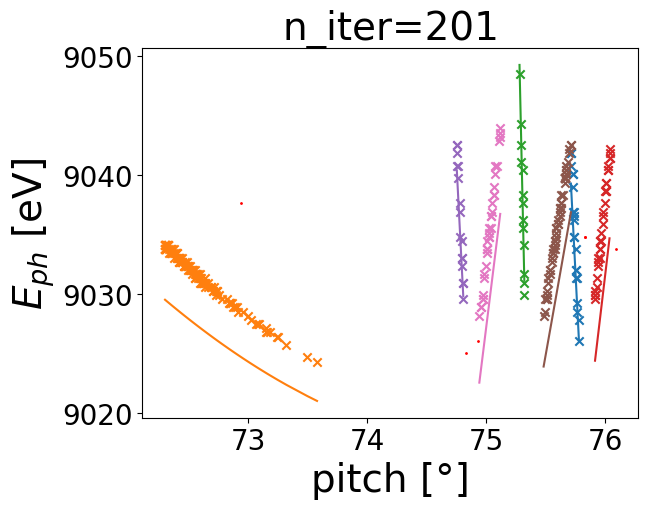

251
[ 1.15161684e+00  2.21559191e+00 -9.16054135e-01 -4.29178399e-03
 -1.50000000e+01] 3.5467380622739375


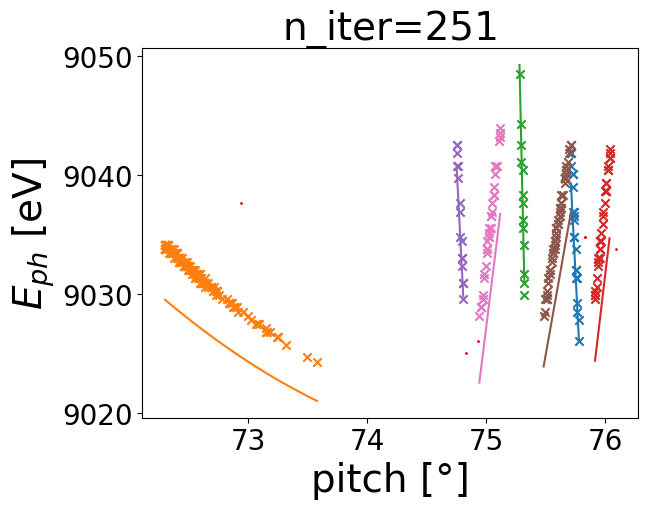

301
[ 1.15161746e+00  2.21632196e+00 -9.16145944e-01 -4.30114132e-03
 -1.50000000e+01] 3.5467380248984877


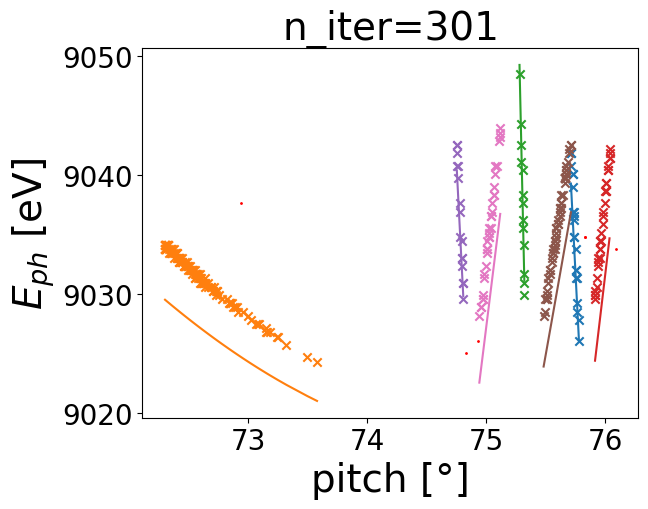

351
[ 1.15163225e+00  2.21990234e+00 -9.18280235e-01 -4.34084292e-03
 -1.50000000e+01] 3.546736948103293


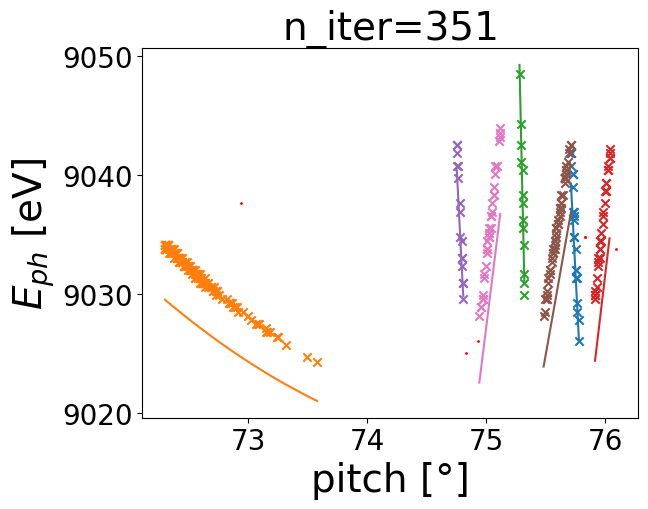

401
[ 1.15174276e+00  2.24639229e+00 -9.33966828e-01 -4.63326137e-03
 -1.50000000e+01] 3.5467234429680086


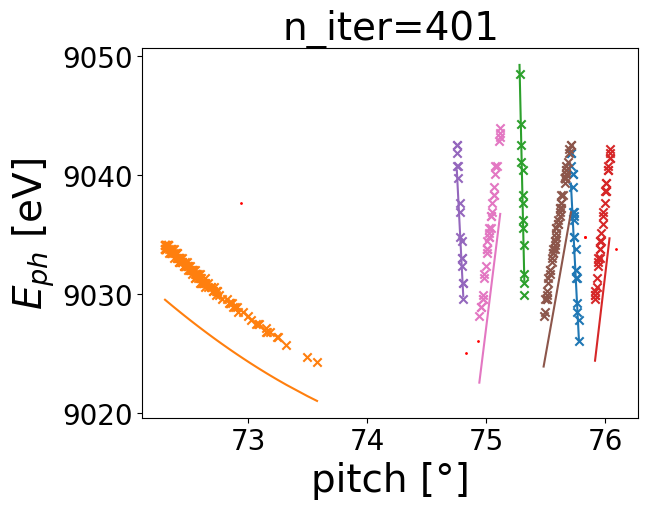

451
[ 1.15174332e+00  2.24693337e+00 -9.34057938e-01 -4.64012295e-03
 -1.50000000e+01] 3.546723345903012


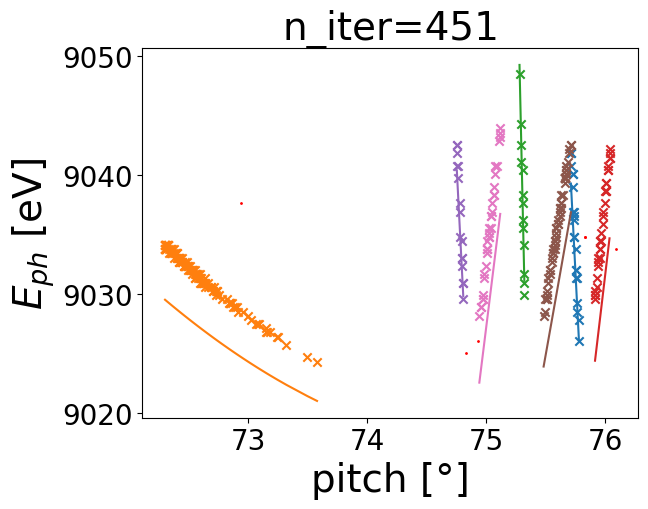

501
[ 1.15174352e+00  2.24692775e+00 -9.34059330e-01 -4.64004588e-03
 -1.50000000e+01] 3.546723343732407


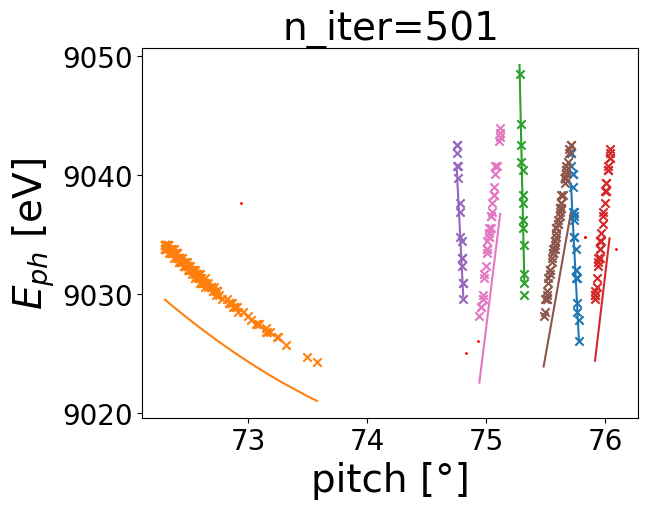

551
[ 1.15174355e+00  2.24686093e+00 -9.34059562e-01 -4.63916116e-03
 -1.50000000e+01] 3.5467233429369363


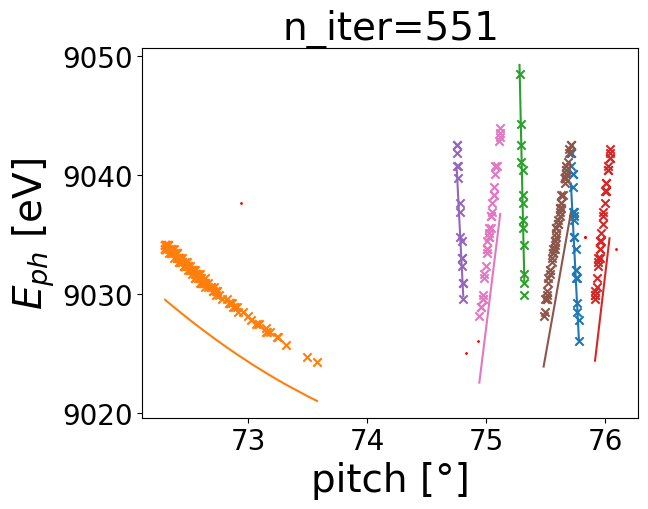

601
[ 1.15174357e+00  2.24686509e+00 -9.34059562e-01 -4.63921674e-03
 -1.50000000e+01] 3.546723342926363


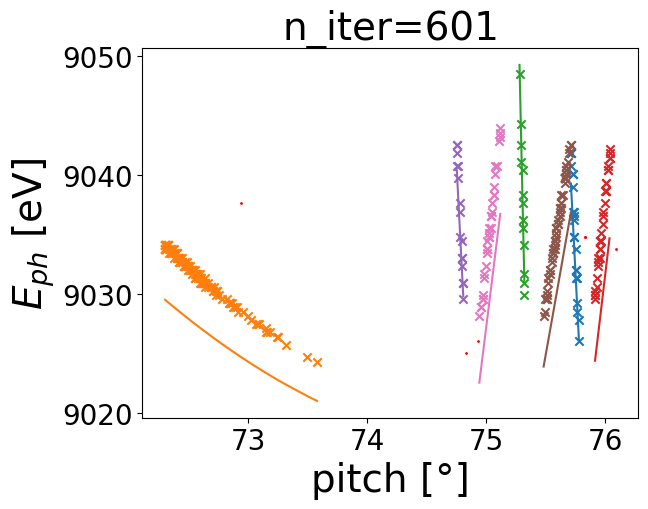

651
[ 1.15174357e+00  2.24686509e+00 -9.34059562e-01 -4.63921669e-03
 -1.50000000e+01] 3.5467233429262546


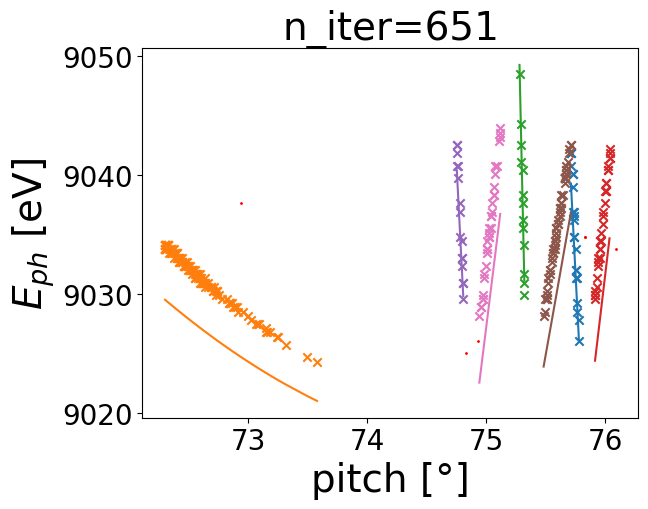

Optimization terminated successfully.
         Current function value: 3.546723
         Iterations: 686
         Function evaluations: 1204
687
[ 1.15174357e+00  2.24686509e+00 -9.34059562e-01 -4.63921669e-03
 -1.50000000e+01] 3.5467233429259837


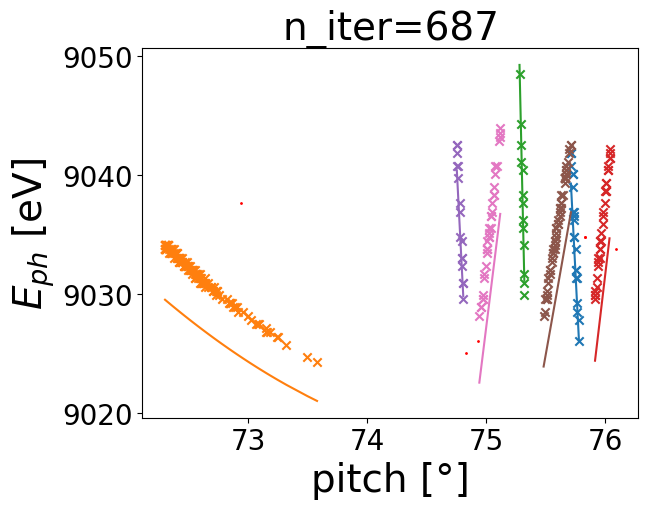

In [263]:
#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0
    for Hidx, H in enumerate(Hquery):
        lidx = HtoMeas[Hidx]
        if lidx is not None:
            peval = pitches_H[lidx]
            if peval.size>0 :
                EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                EBraggs = np.array(EBraggs) +Ecorr
                cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2
    return 1/cost
  
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery):
            lidx = HtoMeas[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            if lidx is not None:
                peval = pitches_H[lidx]
                if peval.size>0:
                    EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                    EBragg = np.array(EBragg) +Ecorr

            #print(peval_sub.min(),peval_sub.max())
                    plt.scatter(peval,E_H[lidx],marker='x')
                    plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
print(HtoMeas)
forcePlot = False
x0 = np.array([dPconv, dRconv, dYconv, dRPconv, Ecorrconv])
bounds = ([0.99*dPconv,1.1*dPconv],[-3,3],[1.01*dYconv,0.99*dYconv],[-0.5,0.5],[-18,-15])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
#dPconv,dRconv,dYconv,dRP_conv,Ecorr_conv = res.x

In [224]:
Etilde = res.x[-1]+ Ecorrconv
print(Etilde)

-12.744429668162685


In [223]:
res.x[-1]

3.730484817751925

# stuff

In [ ]:
m = 27
pitches = pitch_dict[str(m)]
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(m)])+Eoffset_pre
roll = roll_dict[str(m)]

In [ ]:
bmir.cryst.yaw = np.deg2rad(dY)
bmir.cryst.roll = roll+dR
Pitch = np.deg2rad(pitches)
PreSampling = bmir.BraggCurvesEvsAngles_inRange((Eph_seed.min()-20,Eph_seed.max()+20),PitchRange=[Pitch.min(),Pitch.max()],RollRange=np.deg2rad(roll+dR),numPreSampling=1000)
Hquery = PreSampling[1]
Hquery_acc = Hquery
print(m, Hquery)

27 [array([-1, -3,  1]) array([-3,  1, -1]) array([-1, -1,  3])
 array([-5, -1,  1])]


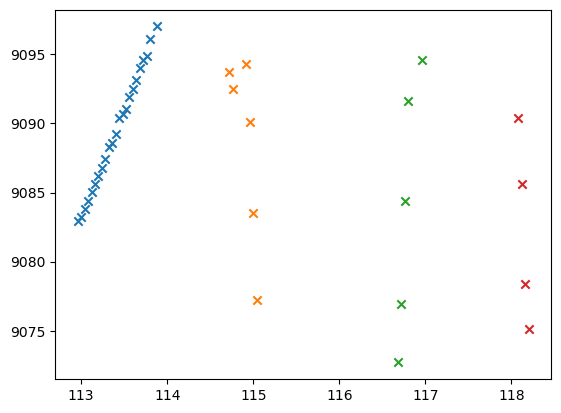

In [ ]:
dP_split = 0.2
dE_del = 10
size_min = 4
sort = np.argsort(pitches)
pitch_sort = pitches[sort]
Eph_sort = Eph_seed[sort]

splitIdx = np.append(np.append([0],np.arange(1,pitch_sort.size)[np.diff(pitch_sort)>dP_split]),[pitch_sort.size])
#keep_idx = [np.ones(pH.size,dtype=bool) for pH in pitches_H]

pitches_H = [pitch_sort[splitIdx[idx]:splitIdx[idx+1]] for idx in range(splitIdx.size-1)]
E_H = [Eph_sort[splitIdx[idx]:splitIdx[idx+1]] for idx in range(splitIdx.size-1)]
del_bool_l = np.array([pline.size<size_min for pline in pitches_H])
for lidx in range(del_bool_l.size-1,0-1,-1):
    if del_bool_l[lidx]:
        del (pitches_H[lidx])
        del (E_H[lidx])
 
del_bool_l =np.array([False, False, True, False, True, False])
for lidx in range(del_bool_l.size-1,0-1,-1):
    if del_bool_l[lidx]:
        del (pitches_H[lidx])
        del (E_H[lidx])


for lidx in range(len(pitches_H)):
    dEH = np.diff(E_H[lidx])
    idx = np.hstack((True,dEH < dE_del))
    E_dummy = E_H[lidx][idx]
    pitches_dummy = pitches_H[lidx][idx]
    E_H[lidx] = E_dummy
    pitches_H[lidx] = pitches_dummy
    #plt.scatter(pitches_H[lidx],E_H[lidx],marker='x')

keep_idx = [np.ones(pH.size,dtype=bool) for pH in pitches_H]
keep_idx[0][-2:] = False
# keep_idx[1][-1] = False
# keep_idx[2][0:4] = False

for lidx in range(len(pitches_H)):
    pitches_H[lidx] = pitches_H[lidx][keep_idx[lidx]]
    E_H[lidx] = E_H[lidx][keep_idx[lidx]]
    plt.scatter(pitches_H[lidx],E_H[lidx],marker='x')

pitch_acc = pitches_H
E_H_acc = E_H
roll_acc = [roll for idx in range(len(pitch_acc))]


    

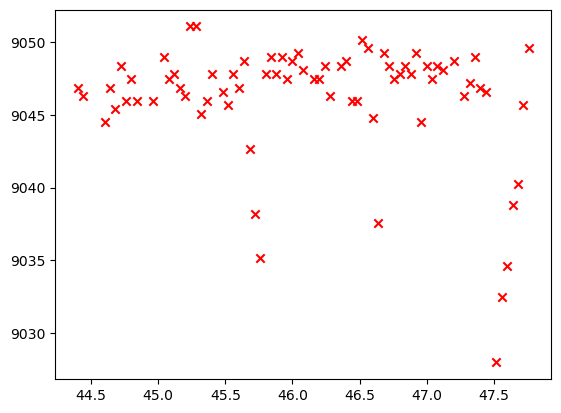

In [ ]:
m = 35
pitches = pitch_dict[str(m)]
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(m)])+Eoffset_pre
roll = roll_dict[str(m)]
plt.scatter(pitches,Eph_seed,marker='x',color='r')

In [ ]:
bmir.cryst.yaw = np.deg2rad(dY)
Pitch = np.deg2rad(pitches)
PreSampling = bmir.BraggCurvesEvsAngles_inRange((Eph_seed.min()-20,Eph_seed.max()+20),PitchRange=[Pitch.min(),Pitch.max()],RollRange=np.deg2rad(roll+dR),numPreSampling=1000)
Hquery = PreSampling[1]
print(m, Hquery)
Hquery_acc = np.append(Hquery_acc,Hquery)
print(Hquery_acc)

35 [array([-3,  1,  1]) array([-3, -1, -1]) array([-1,  3, -3])]
[array([-1, -3,  1]) array([-3,  1, -1]) array([-1, -1,  3])
 array([-5, -1,  1]) array([-3,  1,  1]) array([-3, -1, -1])
 array([-1,  3, -3])]


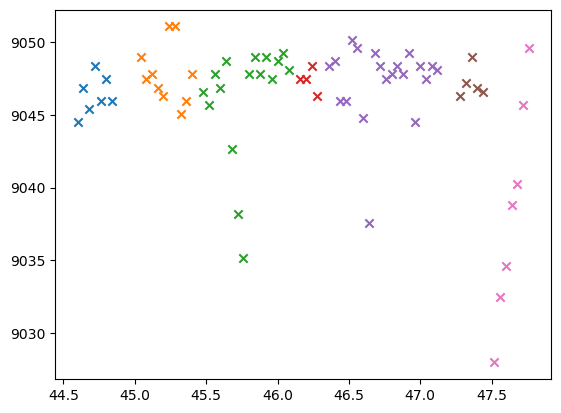

In [ ]:
dP_split = 0.05
dE_del = 100
size_del = 4
sort = np.argsort(pitches)
pitch_sort = pitches[sort]
Eph_sort = Eph_seed[sort]

splitIdx = np.append(np.append([0],np.arange(1,pitch_sort.size)[np.diff(pitch_sort)>dP_split]),[pitch_sort.size])
pitches_H = [pitch_sort[splitIdx[idx]:splitIdx[idx+1]] for idx in range(splitIdx.size-1)]
E_H = [Eph_sort[splitIdx[idx]:splitIdx[idx+1]] for idx in range(splitIdx.size-1)]
del_bool_l = np.array([pline.size<size_del for pline in pitches_H])
for lidx in range(del_bool_l.size-1,0-1,-1):
    if del_bool_l[lidx]:
        del (pitches_H[lidx])
        del (E_H[lidx])
# del_bool_l = np.array([0,0,1,0])# 
# for lidx in range(del_bool_l.size-1,0-1,-1):
#     if del_bool_l[lidx]:
#         del (pitches_H[lidx])
#         del (E_H[lidx])
# select delete operation --> check if points are on line or rather cluster

#pitch_acc =+ pitches_H
#E_H_acc += E_H

keep_idx = [np.ones(pH.size,dtype=bool) for pH in pitches_H]
# keep_idx[1][0:4] = False
# keep_idx[1][-1] = False
# keep_idx[2][0:4] = False

for lidx in range(len(pitches_H)):
    pitches_H[lidx] = pitches_H[lidx][keep_idx[lidx]]
    E_H[lidx] = E_H[lidx][keep_idx[lidx]]
    plt.scatter(pitches_H[lidx],E_H[lidx],marker='x')

#plt.scatter(pitches_H[1][0:4],E_H[1][0:4],marker='x',color='tab:red')
#plt.scatter(pitches_H[1][-1],E_H[1][-1],marker='x',color='tab:red')
pitch_acc += pitches_H
E_H_acc += E_H
roll_acc += [roll for idx in range(len(pitch_acc))]

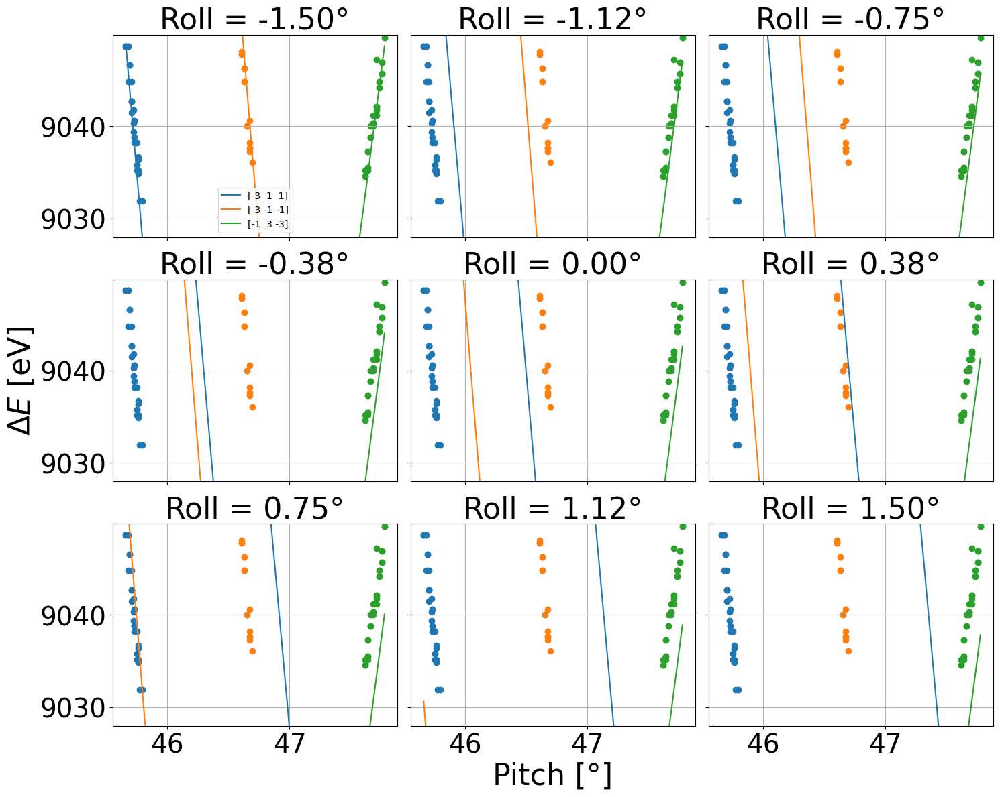

In [ ]:
Pitch = np.deg2rad(np.array([p for parray in pitches_H for p in parray]))

RollQuery = np.deg2rad(np.linspace(-1.5,1.5,9))
Yaw = np.deg2rad(dY)
bmir.cryst.yaw = Yaw
dPi = dP
Eoffset = -Ecorr
EBragg = np.zeros((RollQuery.size,Pitch.size,Hquery.size))
for Ridx, Roll in enumerate(RollQuery):
    bmir.cryst.roll = Roll+np.deg2rad(roll+dR)
    for Pidx,P in enumerate(Pitch):
        bmir.cryst.pitch = P+np.deg2rad(dPi)
        for Hidx,H in enumerate(Hquery):
            bmir.initialize()
            EBragg[Ridx,Pidx,Hidx] = bmir.bragg_wavelength(H=H)[1]-Eoffset

# now parse 
fig_parse, axs = plt.subplots(nrows=3,ncols=3,tight_layout=True,figsize=(15,12))
ylims = np.array([Eph_seed.min(),Eph_seed.max()])
#ylims = [-0.25,0.25]
for idx, ax in enumerate(axs.flatten()):
    #Ridx = idx*int((Roll.size-1)/8)
    ax.tick_params(labelsize=28)
    ax.grid()
    ax.set_title("Roll = {:.2f}°".format(np.rad2deg(RollQuery[idx])),fontsize=32)
    if idx%3>0:
        ax.tick_params(labelleft=False)
    if idx<6:
        ax.tick_params(labelbottom=False)
        #ax.set_xlabel("$\\Delta E$[meV]",fontsize=32)
    for lidx, peval in enumerate(pitches_H):
        ax.scatter(peval,E_H[lidx])
    for Hidx in range(Hquery.shape[0]):
        
        ax.plot(np.rad2deg(Pitch),EBragg[idx,:,Hidx].squeeze(),label=str(Hquery[Hidx]))
        #ax.fill_between((Pitch-np.pi/2)*1E3,(E_Hs[Ridx,:,Hidx]*(1+bw_Hs[Ridx,:,Hidx,0])).squeeze()-bmir.E_c,(E_Hs[Ridx,:,Hidx]*(1+bw_Hs[Ridx,:,Hidx,1])).squeeze()-bmir.E_c)

    ax.set_ylim(ylims)
    #ax.set_xlim((Pitch[0]-np.pi/2)*1E3,(Pitch[-1]-np.pi/2)*1E3)
axs[2,1].set_xlabel("Pitch [°]",fontsize=32)
axs[1,0].set_ylabel("$\\Delta E$ [eV]",fontsize=32)
axs[0,0].legend()

In [ ]:
dPi,dRi,dYi,Ecorr = [-1.36620953,  1.29531582-1.5,  2.20385814, -1.22391416-Eoffset_pre]  #res.x
HtoMeas = HtoMeasf_acc(pitches_H,[roll for idx in range(len(pitches_H))],E_H,Hquery,dPi,dRi,dYi,Ecorr)
print(HtoMeas)
for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    # print(lidxi
    # P0 = P0s[lidx]
    peval = pitches_H[lidx]
    
    #dP, dR, Ecorr = res.x

    EBragg = getBragg(np.deg2rad(peval+dPi), np.deg2rad(roll+dRi), np.deg2rad(dYi), H)
    plt.scatter(pitches_H[lidx],E_H[lidx])
    plt.plot(peval, EBragg)

TypeError: HtoMeasf_acc() missing 1 required positional argument: 'Ecorr'

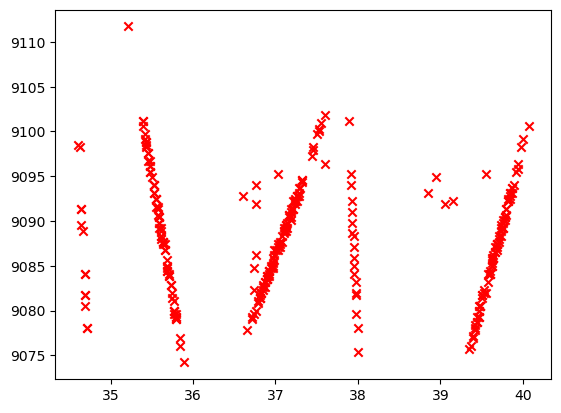

In [ ]:
m = 6
pitches = pitch_dict[str(m)]
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(m)])+Eoffset_pre
roll = roll_dict[str(m)]
plt.scatter(pitches,Eph_seed,marker='x',color='r')

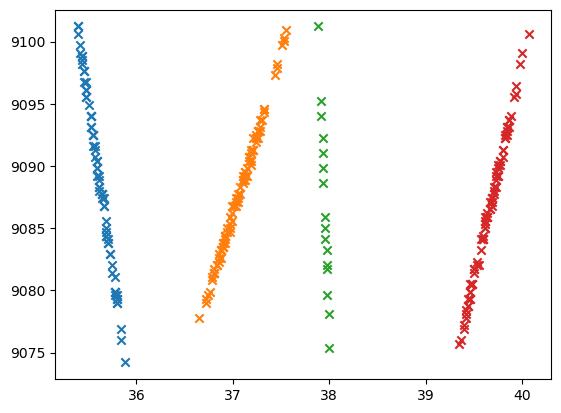

In [ ]:
dP_split = 0.1
dE_del = 2

sort = np.argsort(pitches)
pitch_sort = pitches[sort]
Eph_sort = Eph_seed[sort]

splitIdx = np.append(np.append([0],np.arange(1,pitch_sort.size)[np.diff(pitch_sort)>dP_split]),[pitch_sort.size])
pitches_H = [pitch_sort[splitIdx[idx]:splitIdx[idx+1]] for idx in range(splitIdx.size-1)]
E_H = [Eph_sort[splitIdx[idx]:splitIdx[idx+1]] for idx in range(splitIdx.size-1)]
del_bool_l = np.array([pline.size<8 for pline in pitches_H])
for lidx in range(del_bool_l.size-1,-1,-1):
    if del_bool_l[lidx]:
        del (pitches_H[lidx])
        del (E_H[lidx])

for lidx in range(len(pitches_H)):
    dEH = np.diff(E_H[lidx])
    idx = np.hstack((True,dEH < dE_del))
    while any(np.logical_not(idx)):
        E_dummy = E_H[lidx][idx]
        pitches_dummy = pitches_H[lidx][idx]
        E_H[lidx] = E_dummy
        pitches_H[lidx] = pitches_dummy
        dEH = np.diff(E_H[lidx])
        idx = np.hstack((True,dEH < dE_del))
# del_bool_l = np.array([0,0,1,0])# 
# for lidx in range(del_bool_l.size-1,0-1,-1):
#     if del_bool_l[lidx]:
#         del (pitches_H[lidx])
#         del (E_H[lidx])
# select delete operation --> check if points are on line or rather cluster

#pitch_acc =+ pitches_H
#E_H_acc += E_H
del pitches_H[0]
del E_H[0]

pitches_H = [pitches_H[0], np.append(pitches_H[1],pitches_H[2]),pitches_H[3],pitches_H[4]]
E_H = [E_H[0], np.append(E_H[1],E_H[2]),E_H[3],E_H[4]]


keep_idx = [np.ones(pH.size,dtype=bool) for pH in pitches_H]
keep_idx[1][0] = False
keep_idx[1][-1] = False
# keep_idx[2][0:4] = False

for lidx in range(len(pitches_H)):
    pitches_H[lidx] = pitches_H[lidx][keep_idx[lidx]]
    E_H[lidx] = E_H[lidx][keep_idx[lidx]]
    plt.scatter(pitches_H[lidx],E_H[lidx],marker='x')

#plt.scatter(pitches_H[1][-1],E_H[1][-1],marker='x',color='tab:purple')
#plt.scatter(pitches_H[1][-1],E_H[1][-1],marker='x',color='tab:red')
pitch_acc += pitches_H
E_H_acc += E_H
roll_acc += [roll for idx in range(len(pitch_acc))]

In [ ]:
bmir.cryst.yaw = np.deg2rad(dYconv)
Pitch = np.deg2rad(pitches+dPconv)
PreSampling = bmir.BraggCurvesEvsAngles_inRange((Eph_seed.min()-20,Eph_seed.max()+20),PitchRange=[Pitch.min(),Pitch.max()],RollRange=np.deg2rad(roll+dRconv)+dRPconv*np.abs(np.pi/2-Pitch.mean()),numPreSampling=1000)
Hquery = PreSampling[1]
print(m, Hquery)
#delete [-1, -1,  1] line, as it is hard to discern
Hquery = np.delete(Hquery,1)
print(m, Hquery)
Hquery_acc = np.append(Hquery_acc,Hquery)
print(Hquery_acc)

6 [array([-1, -1, -1]) array([-1, -1,  1]) array([-2,  2, -4])
 array([-2,  4, -2]) array([-4,  2, -2])]
6 [array([-1, -1, -1]) array([-2,  2, -4]) array([-2,  4, -2])
 array([-4,  2, -2])]
[array([-1, -3,  1]) array([-3,  1, -1]) array([-1, -1,  3])
 array([-5, -1,  1]) array([-3,  1,  1]) array([-3, -1, -1])
 array([-1,  3, -3]) array([-1, -1, -1]) array([-2,  2, -4])
 array([-2,  4, -2]) array([-4,  2, -2])]


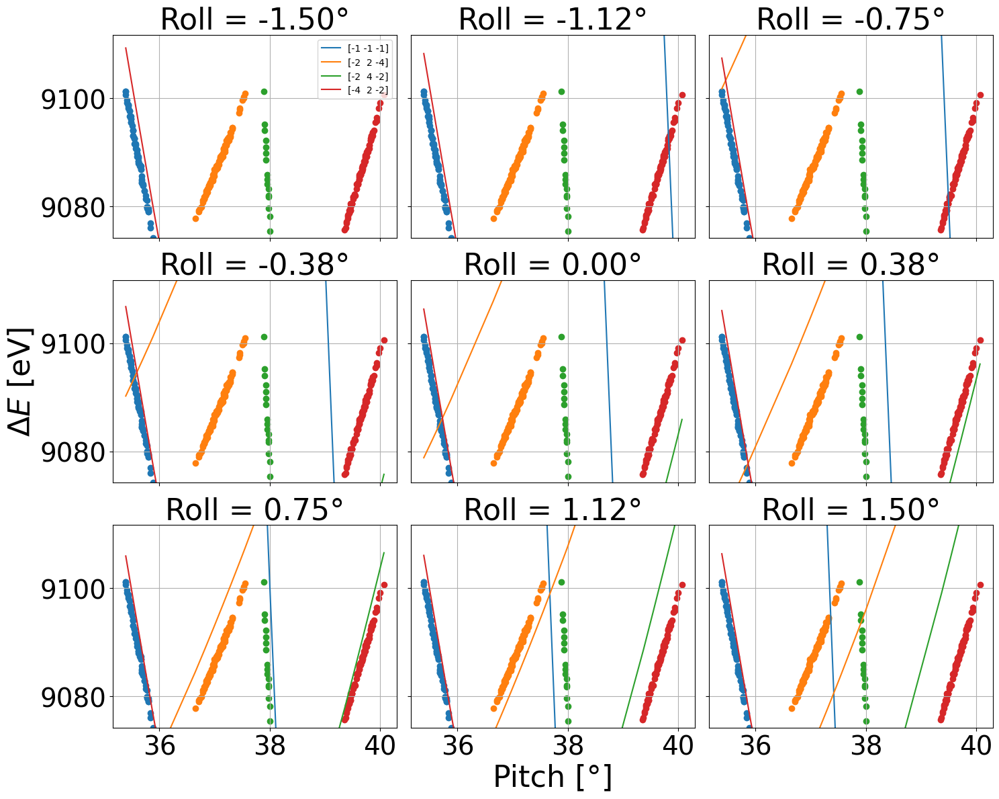

In [ ]:
Pitch = np.deg2rad(np.array([p for parray in pitches_H for p in parray]))

RollQuery = np.deg2rad(np.linspace(-1.5,1.5,9))
Yaw = np.deg2rad(dYconv)
#bmir.cryst.yaw = Yaw
#dPi = dP
Eoffset = Ecorr
# EBragg = np.zeros((RollQuery.size,Pitch.size,Hquery.size))
# for Ridx, Roll in enumerate(RollQuery):
#     bmir.cryst.roll = Roll+np.deg2rad(roll+dRconv)
#     for Pidx,P in enumerate(Pitch):
#         bmir.cryst.pitch = P+np.deg2rad(dPconv)
#         bmir.cryst.roll += dRPconv*np.abs(np.pi/2-bmir.cryst.pitch)
#         for Hidx,H in enumerate(Hquery):
#             bmir.initialize()
#             EBragg[Ridx,Pidx,Hidx] = bmir.bragg_wavelength(H=H)[1]-Eoffset

# now parse 
fig_parse, axs = plt.subplots(nrows=3,ncols=3,tight_layout=True,figsize=(15,12))
ylims = np.array([Eph_seed.min(),Eph_seed.max()])
#ylims = [-0.25,0.25]
for idx, ax in enumerate(axs.flatten()):
    #Ridx = idx*int((Roll.size-1)/8)
    ax.tick_params(labelsize=28)
    ax.grid()
    ax.set_title("Roll = {:.2f}°".format(np.rad2deg(RollQuery[idx])),fontsize=32)
    if idx%3>0:
        ax.tick_params(labelleft=False)
    if idx<6:
        ax.tick_params(labelbottom=False)
        #ax.set_xlabel("$\\Delta E$[meV]",fontsize=32)
    for lidx, peval in enumerate(pitches_H):
        ax.scatter(peval,E_H[lidx])
    for Hidx in range(Hquery.shape[0]):
        EBragg = getBragg_wPRcorr(Pitch+np.deg2rad(dPconv),RollQuery[idx]+np.deg2rad(roll+dRconv),np.deg2rad(dYconv),dRPconv,Hquery[Hidx])+Ecorr
        ax.plot(np.rad2deg(Pitch),EBragg,label=str(Hquery[Hidx]))
        #ax.fill_between((Pitch-np.pi/2)*1E3,(E_Hs[Ridx,:,Hidx]*(1+bw_Hs[Ridx,:,Hidx,0])).squeeze()-bmir.E_c,(E_Hs[Ridx,:,Hidx]*(1+bw_Hs[Ridx,:,Hidx,1])).squeeze()-bmir.E_c)

    ax.set_ylim(ylims)
    #ax.set_xlim((Pitch[0]-np.pi/2)*1E3,(Pitch[-1]-np.pi/2)*1E3)
axs[2,1].set_xlabel("Pitch [°]",fontsize=32)
axs[1,0].set_ylabel("$\\Delta E$ [eV]",fontsize=32)
axs[0,0].legend()

In [ ]:
dRP_guess = 1.5/(np.abs(90-116)-np.abs(90-46.5))
dR0_guess = dR-np.abs(90-116)*dRP_guess
print(dRP_guess,dR0_guess)

-0.08571428571428572 3.5238872485714285


[1, 2, 3, 0, 4, 5, 6, 9, 8, 10, 7]


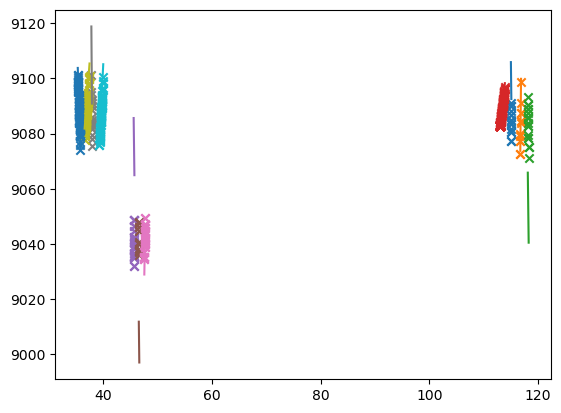

In [ ]:
dPi,dRi,dYi,dPRi,Ecorr = [-1.36350551,  2.03498349,  2.68730152,-0.03816467,  1.3590789 -Eoffset_pre]  #res.x
#HtoMeas = HtoMeasf_acc(pitch_acc,roll_acc,E_H_acc,Hquery_acc,dPi,dRi,dPRi,dYi,Ecorr)
HtoMeas = [ 1,  2,  3,  0,  4,  5,  6, 9, 8, 10,  7] #corrected H to meas:
print(HtoMeas)
for Hidx, H in enumerate(Hquery_acc):
    lidx = HtoMeas[Hidx]
    # print(lidx)
    # P0 = P0s[lidx]
    peval = pitch_acc[lidx]
    
    #dP, dR, Ecorr = res.x

    EBragg = getBragg_wPRcorr(np.deg2rad(peval+dPi), np.deg2rad(roll_acc[lidx]+dRi), np.deg2rad(dY),dPRi, H)
    plt.plot(peval, EBragg)
    plt.scatter(peval,E_H_acc[lidx],marker='x')




### Do the actual fit

1
[-1.40719582  3.62960387  2.26997388 -0.07714286  1.39985127] 1917.0422925440496


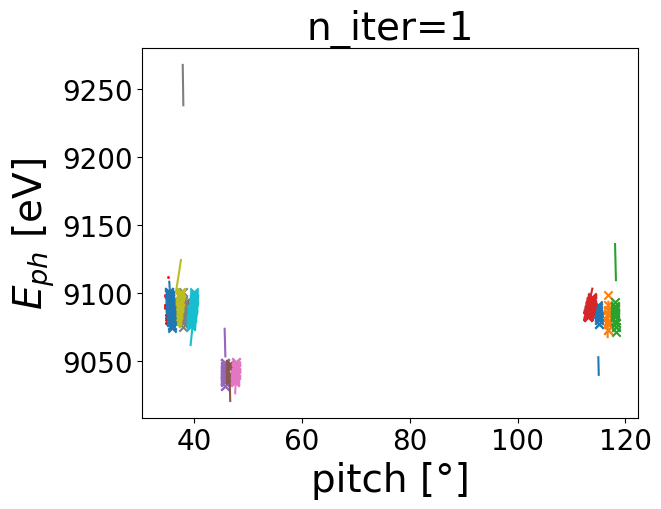

51
[-1.41251961  3.26248248  1.77670962 -0.07120293  1.66773505] 242.5232938883111


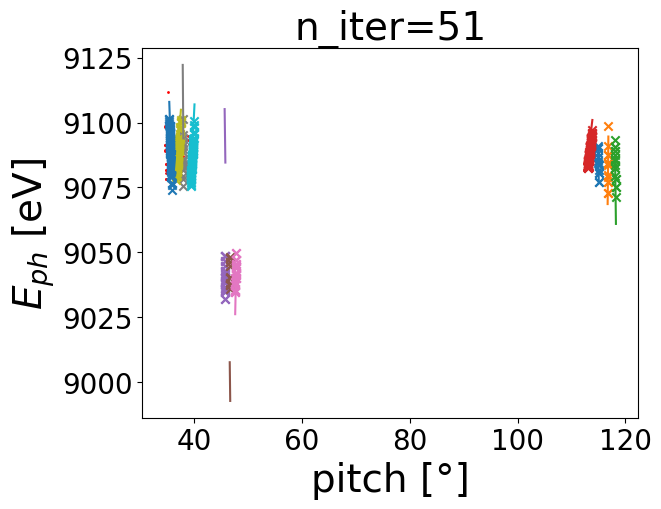

101
[-1.22484289 -2.67955053  4.58322251  0.11105223  1.11637584] 63.132911499190115


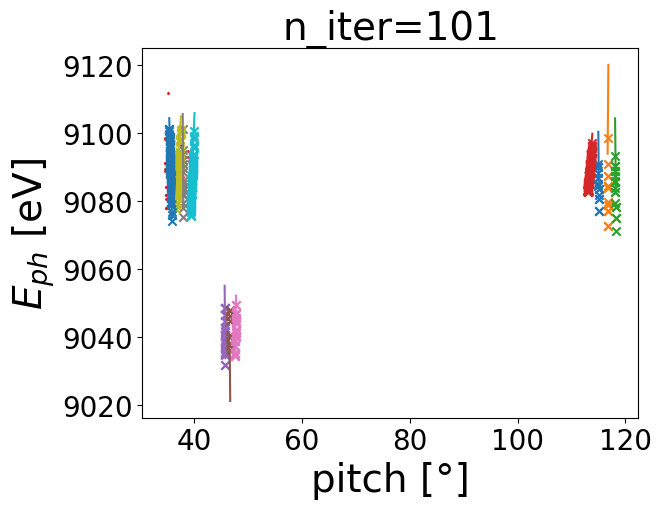

151
[-1.2587885  -2.18970099  4.33415182  0.0957027   1.14486152] 56.699402296445655


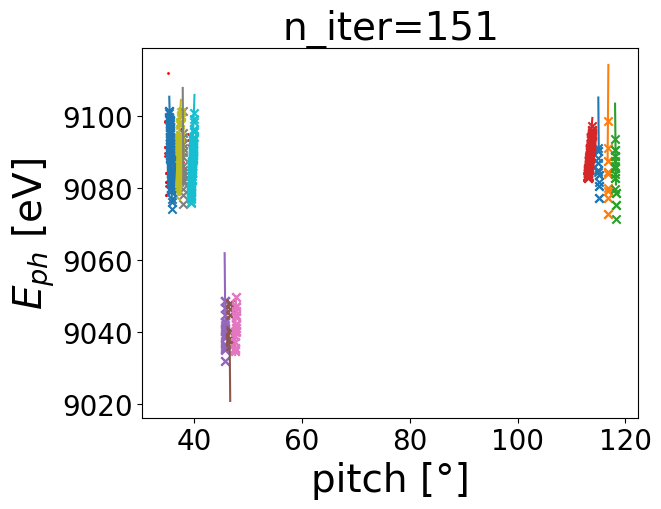

201
[-1.25567758 -3.42338723  4.88826083  0.13321996 -9.89794514] 30.810316429704905


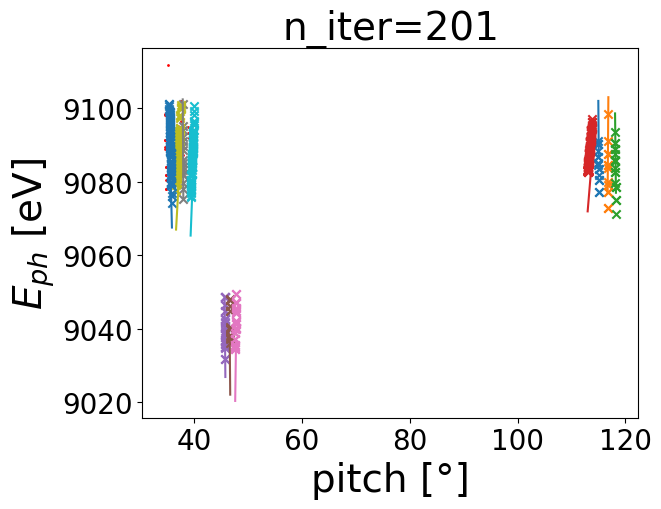

251
[-1.24526382 -3.56551731  4.96930094  0.13773002 -9.60107214] 29.69198282373605


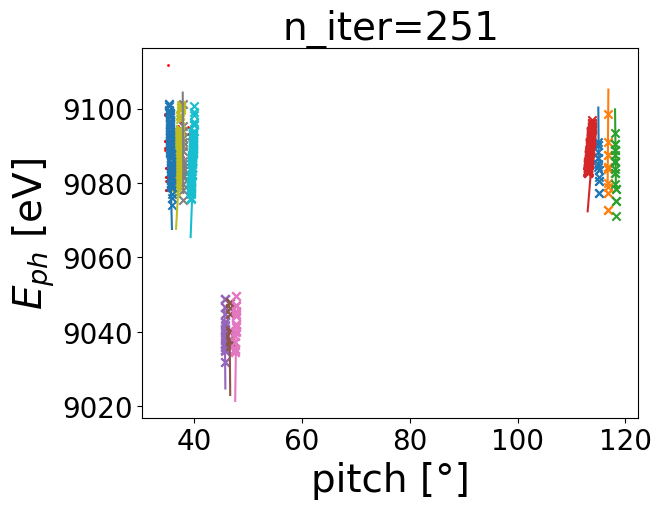

301
[-1.24519209 -3.56692702  4.96993902  0.13777121 -9.59774567] 29.69192243429928


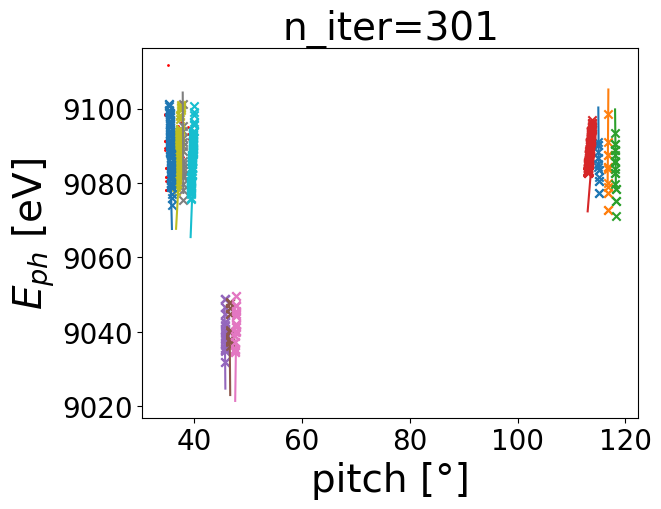

351
[-1.24519255 -3.56692592  4.9699382   0.13777116 -9.59788328] 29.69192242589693


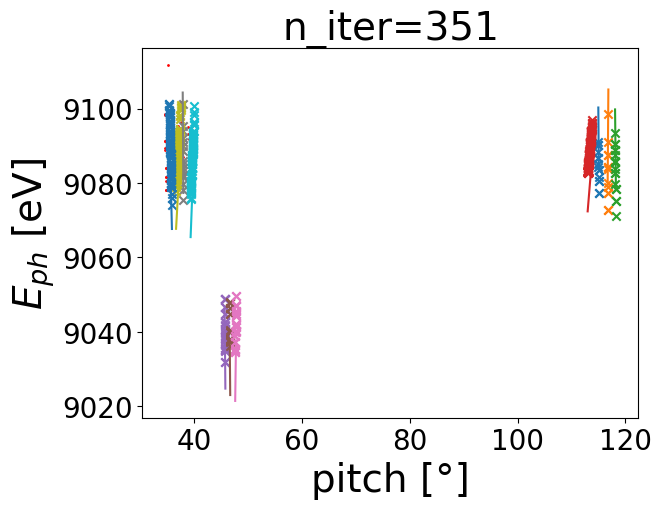

401
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.691922425889253


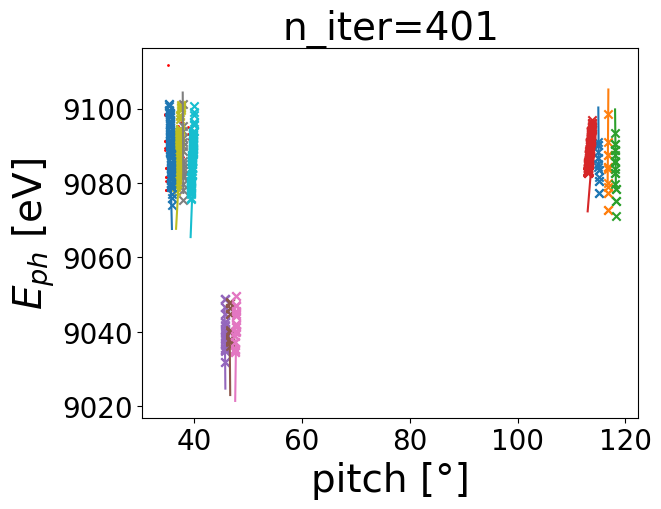

451
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.69192242588925


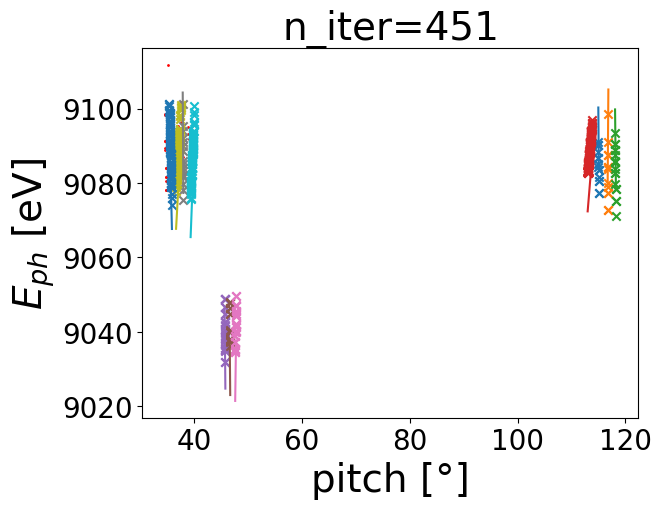

501
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.691922425888546


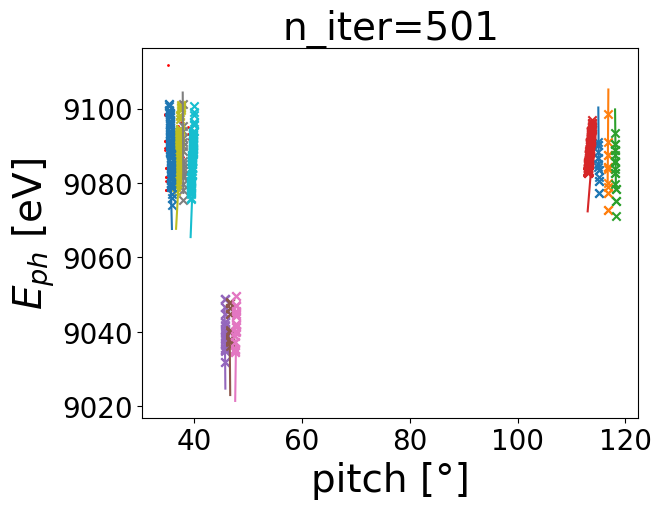

551
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.691922425888546


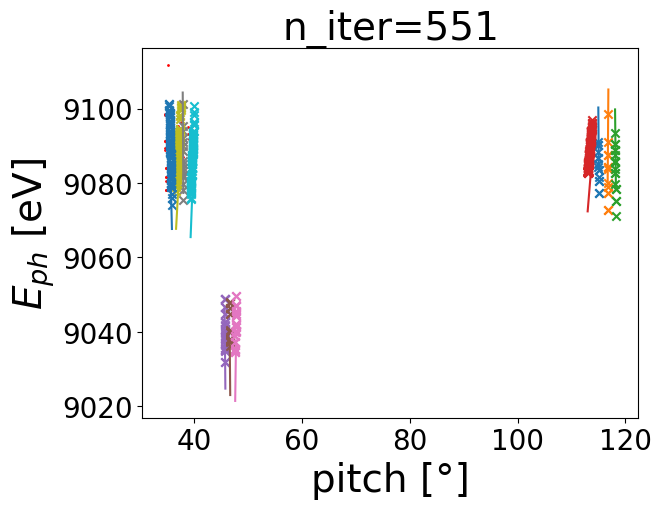

601
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.691922425888546


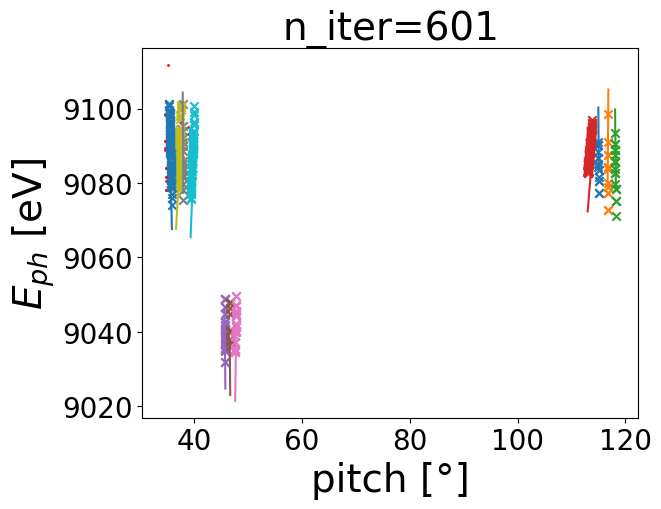

651
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.691922425888546


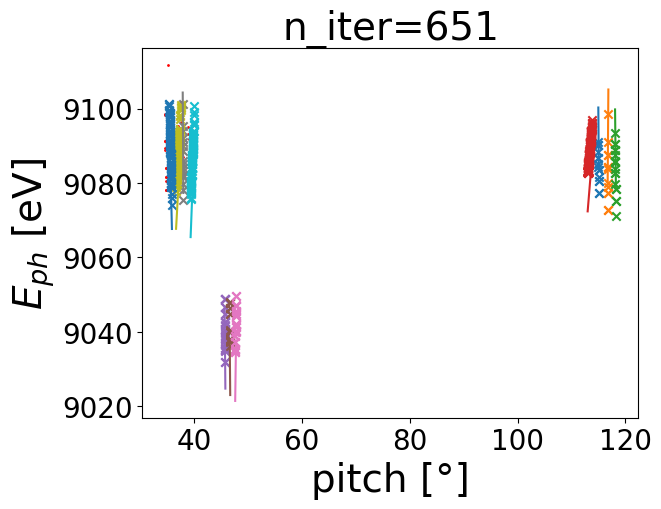

701
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.691922425888546


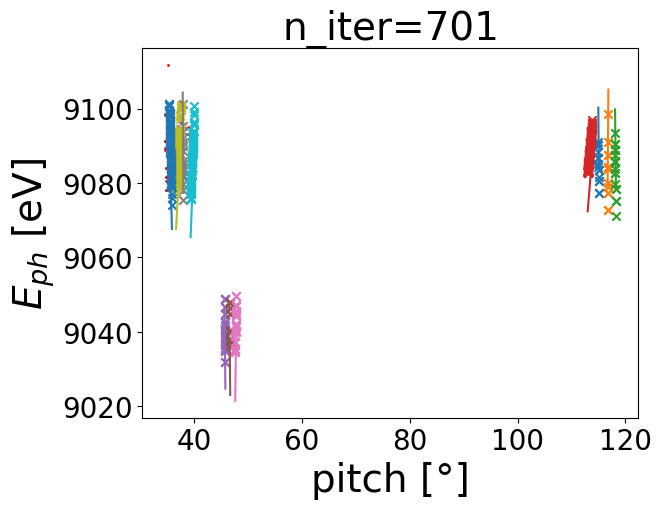

751
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.691922425888546


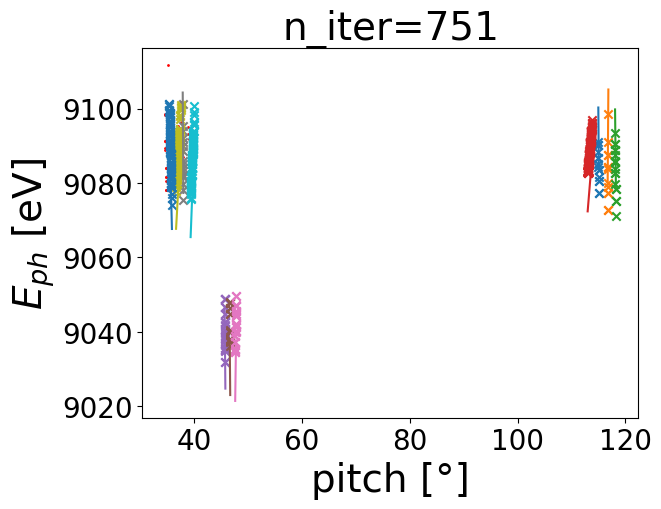

801
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.691922425888546


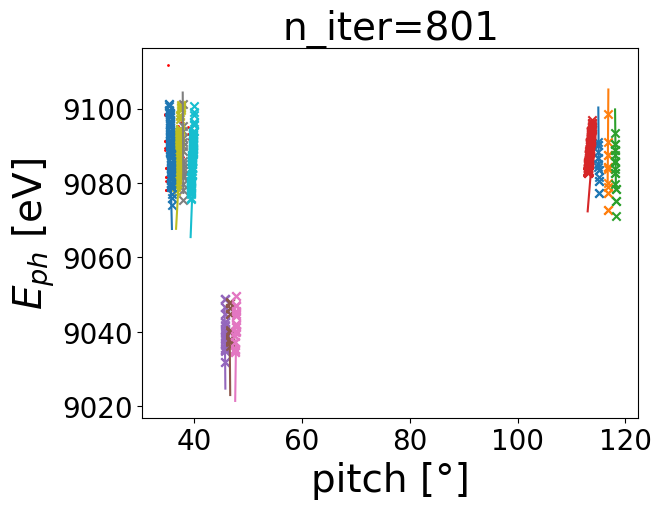

851
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.691922425888546


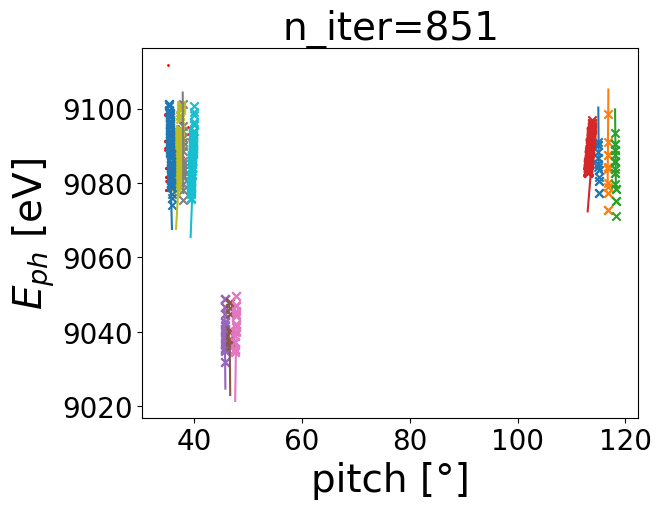

901
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.691922425888546


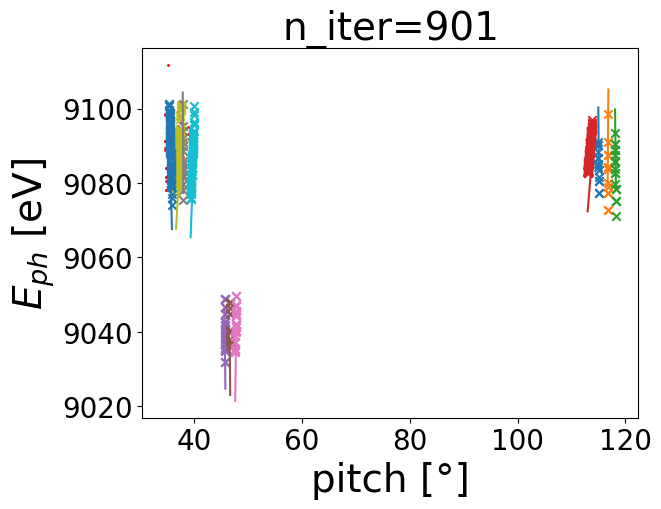

951
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.691922425888546


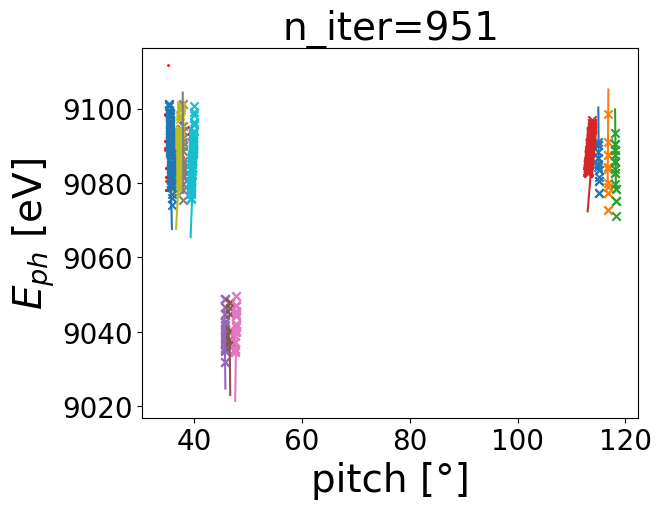

/tmp/ipykernel_572680/3361373616.py:47: RuntimeWarning:

Maximum number of iterations has been exceeded.



1000
[-1.24519256 -3.56692556  4.96993804  0.13777115 -9.59788256] 29.691922425888546


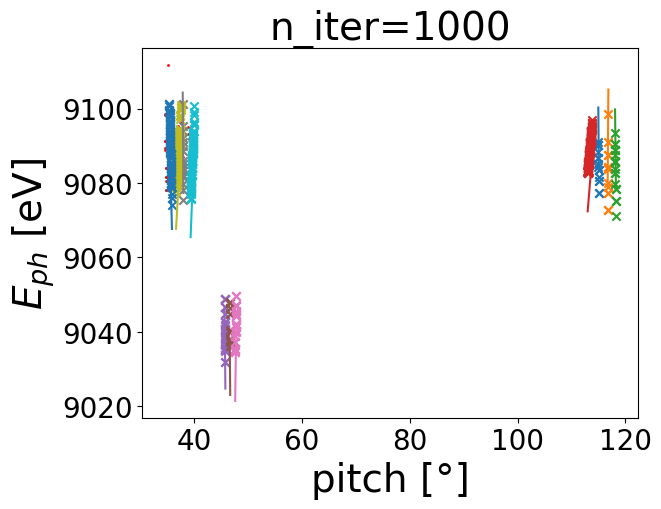

In [ ]:
#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0

    for Hidx, H in enumerate(Hquery_acc):
        lidx = HtoMeas[Hidx]
        peval = pitch_acc[lidx]
        EBraggs = getBragg_wPRcorr(np.deg2rad(peval+dP),np.deg2rad(roll_acc[lidx]+dR),np.deg2rad(dY),dPR,H)+Ecorr
        cost += np.sum((EBraggs-E_H_acc[lidx])**2)/peval.size**2

    return 1/cost
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery_acc):
            lidx = HtoMeas[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            peval = pitch_acc[lidx]
            EBragg = getBragg_wPRcorr(np.deg2rad(peval+dP),np.deg2rad(roll_acc[lidx]+dR),np.deg2rad(dY),dPR,H)+Ecorr

            #print(peval_sub.min(),peval_sub.max())
            plt.scatter(peval,E_H_acc[lidx],marker='x')
            plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
x0 = np.array([dP, dR0_guess, dY, dRP_guess, Ecorr])
bounds = ([-3,3],[-5,5],[-10,10],[-0.2,0.2],[-50,50])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
dPconv,dRconv,dYconv,dRP_conv,Ecorr_conv = res.x

In [ ]:
dPconv,dRconv,dYconv,dRPconv,Ecorrconv =res.x# [-1.36350551,  2.03498349,  2.68730152 -0.03816467,  1.3590789 ]#

In [ ]:
f"{roll:.2f}"

'1.28'

### use the fit parameters for the other measurements --> not really good

0 Roll = 1.28°


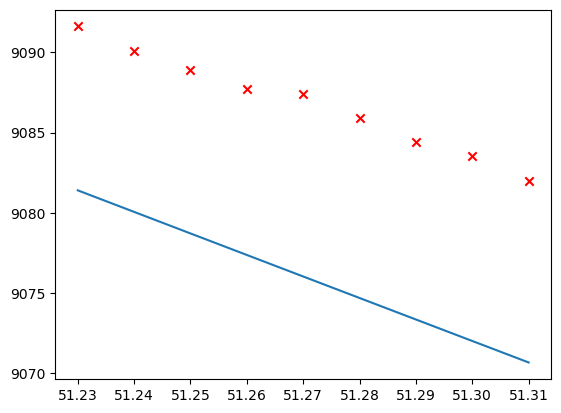

1 Roll = 1.28°


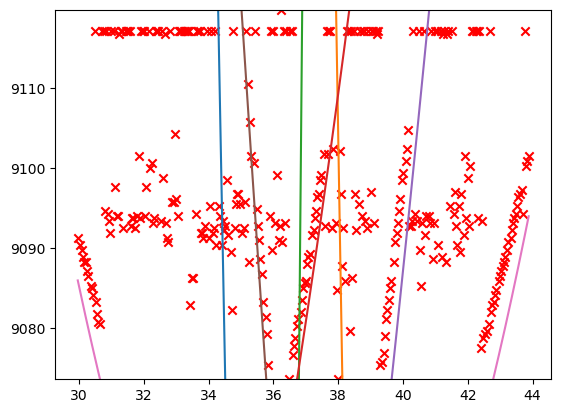

2 Roll = 1.28°


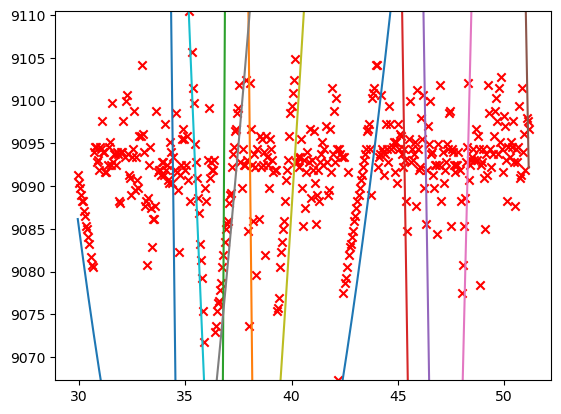

3 Roll = 1.28°


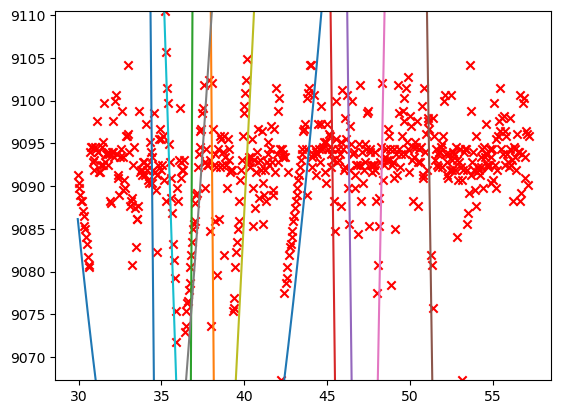

4 Roll = 1.28°


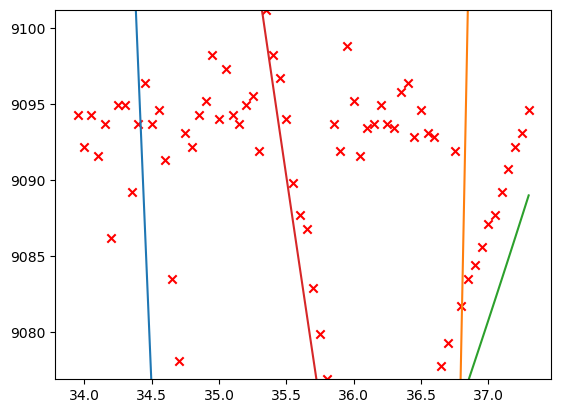

5 Roll = 1.28°


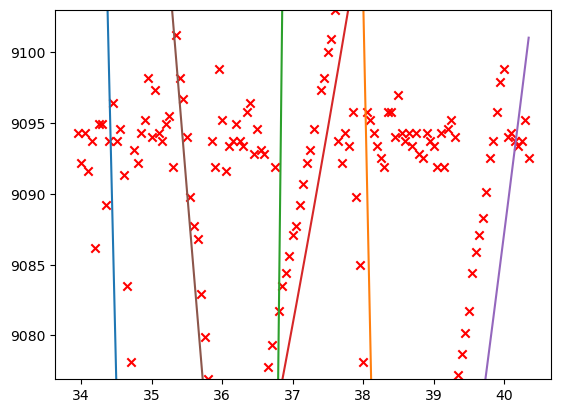

6 Roll = 1.28°


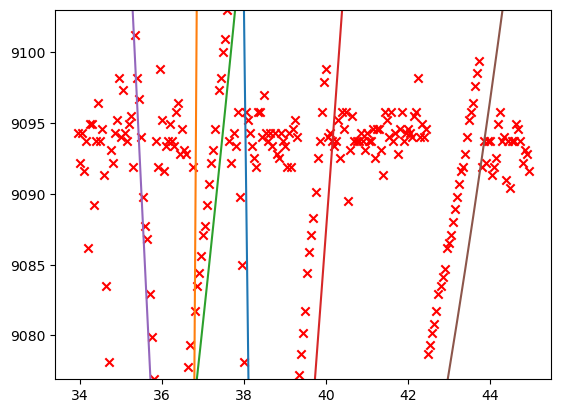

7 Roll = 1.28°


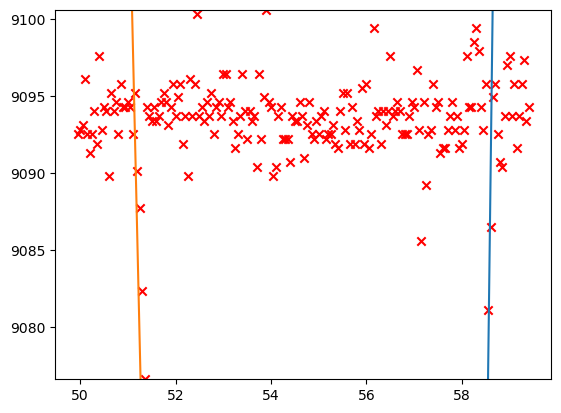

8 Roll = 1.28°


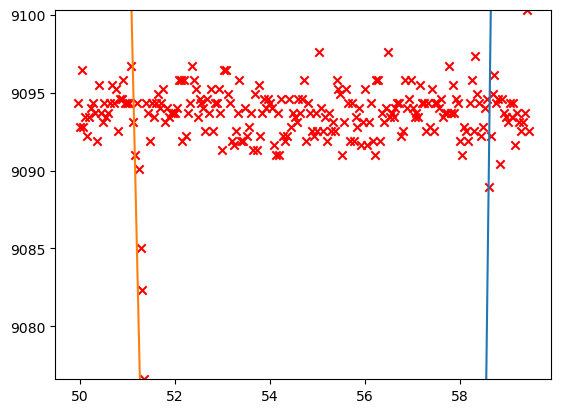

9 Roll = 1.28°


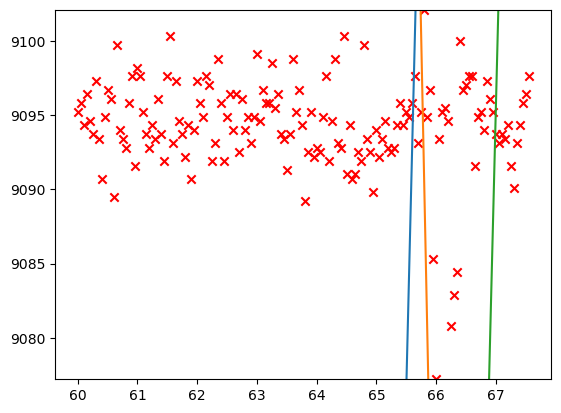

10 Roll = 1.28°


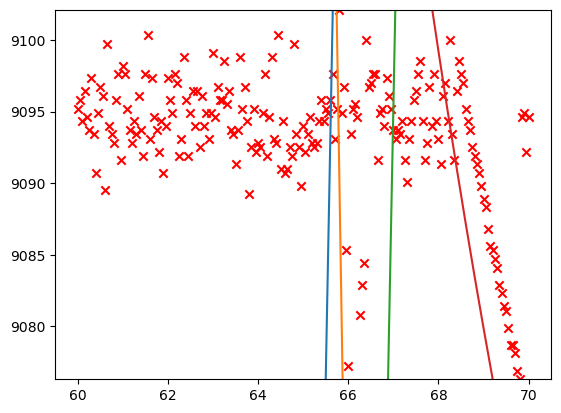

11 Roll = 1.28°


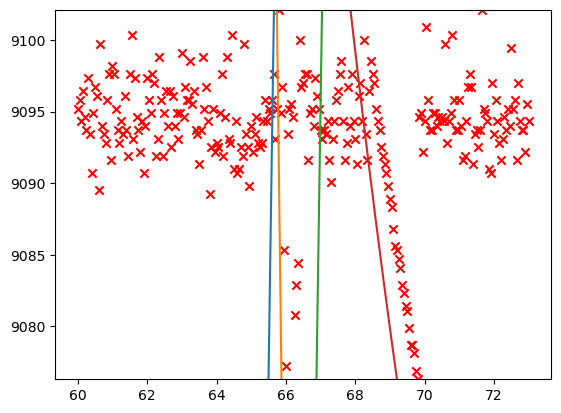

12 Roll = 0.28°


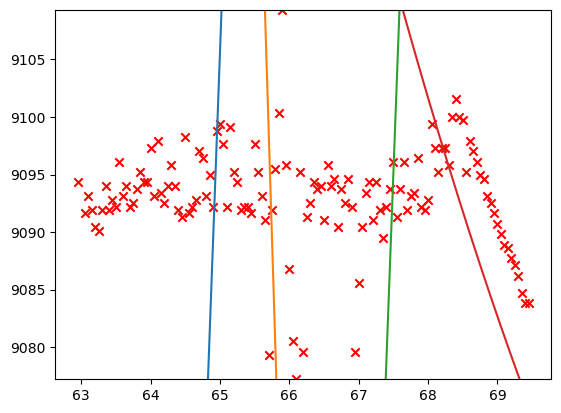

13 Roll = 0.28°


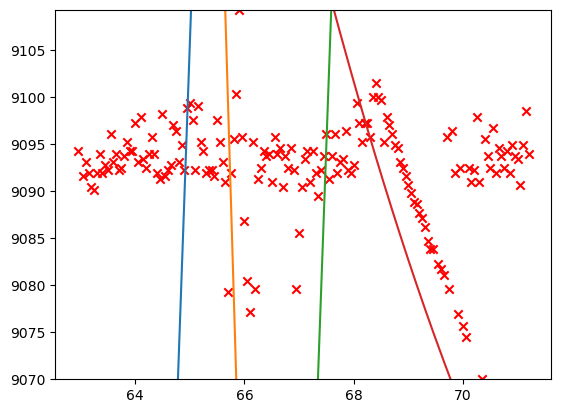

14 Roll = 1.28°


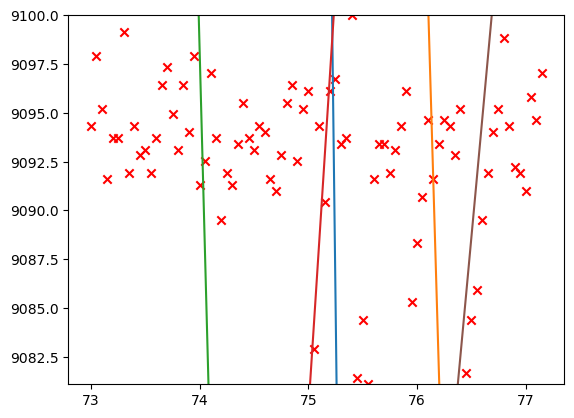

15 Roll = 1.28°


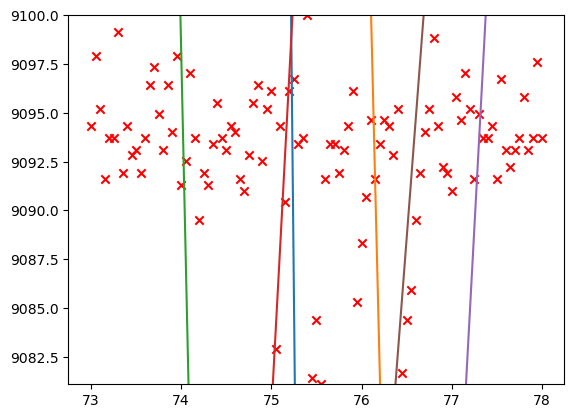

16 Roll = 1.28°


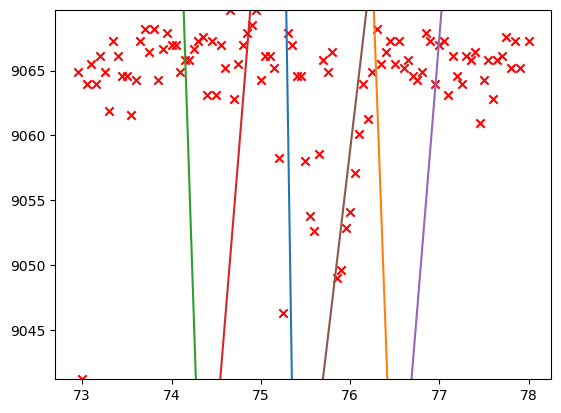

17 Roll = 1.28°


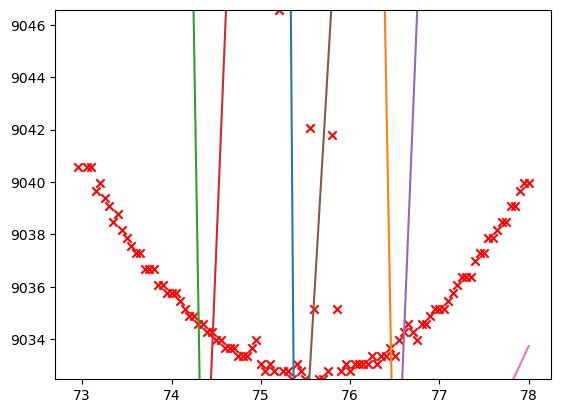

18 Roll = 0.28°


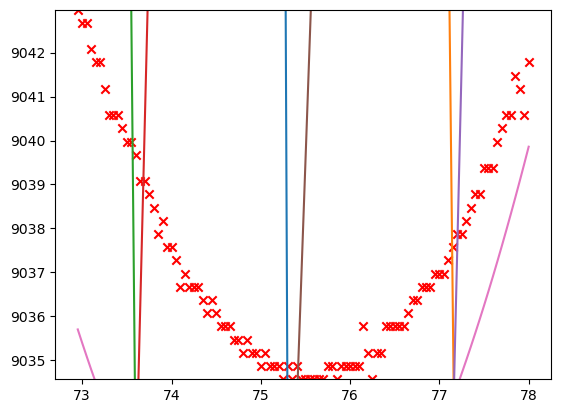

19 Roll = 0.28°


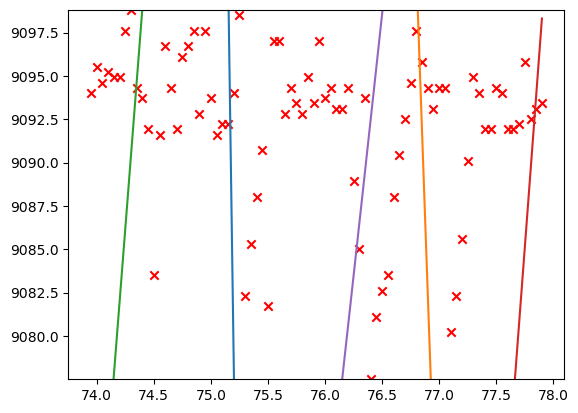

20 Roll = 0.28°


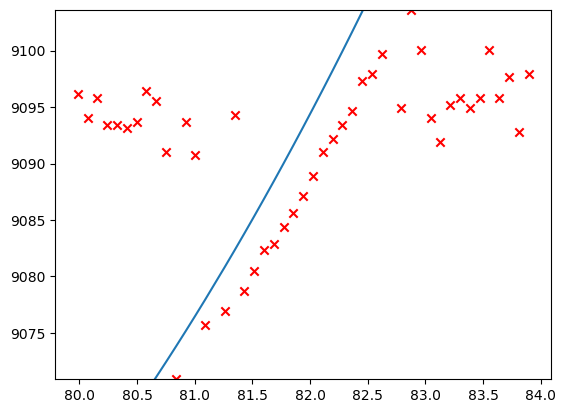

21 Roll = 1.28°


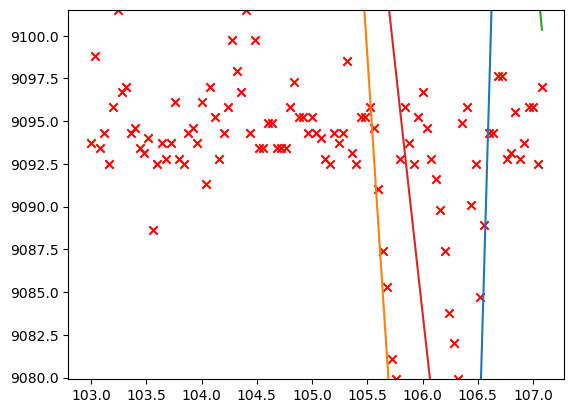

22 Roll = 1.28°


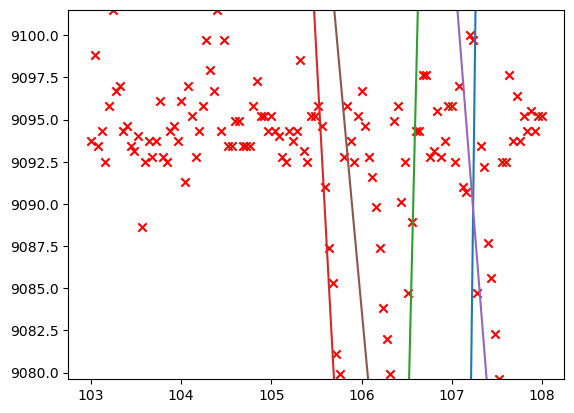

23 Roll = 0.28°


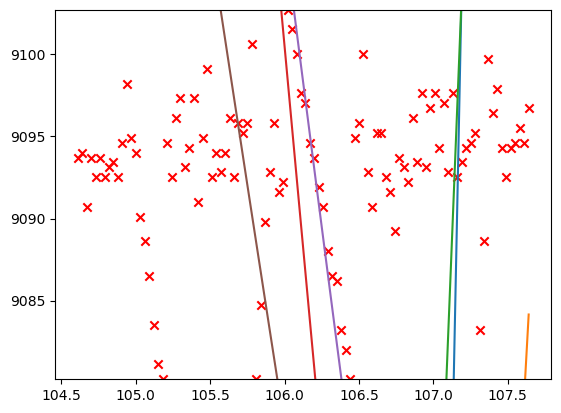

24 Roll = 1.28°


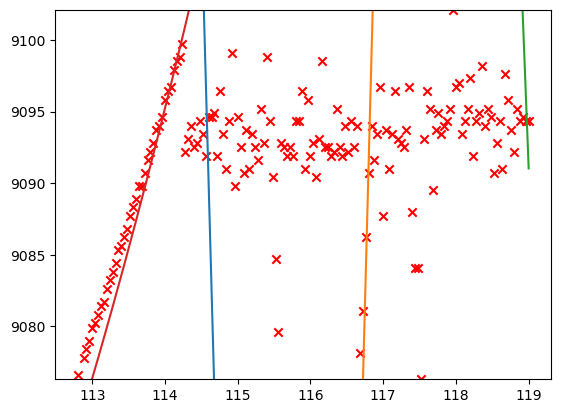

25 Roll = 0.28°


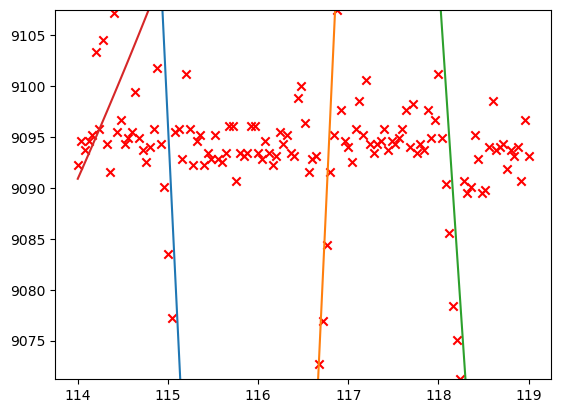

26 Roll = 0.28°


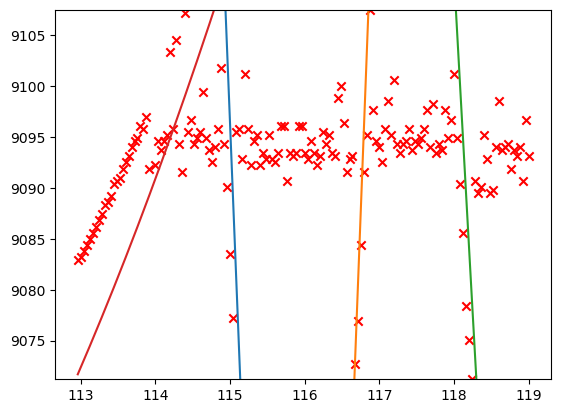

27 Roll = 0.00°


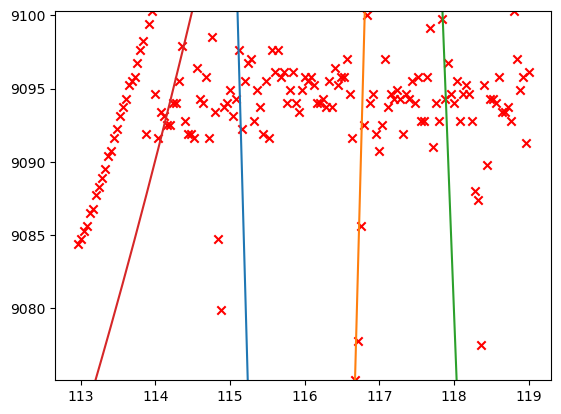

28 Roll = 1.28°


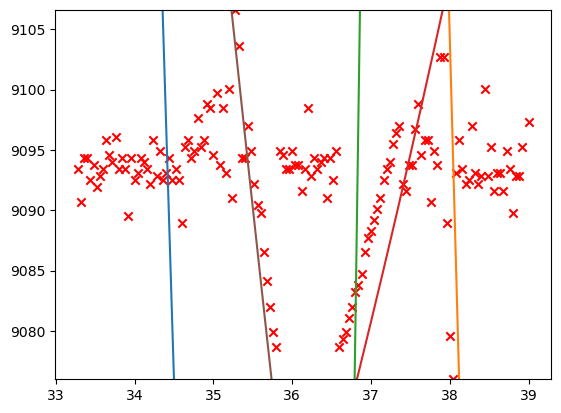

29 Roll = 1.28°


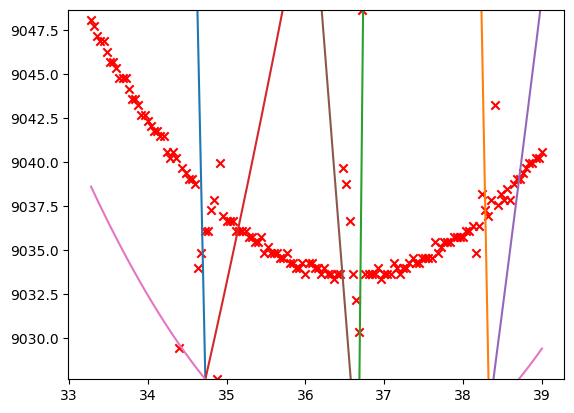

30 Roll = 0.28°


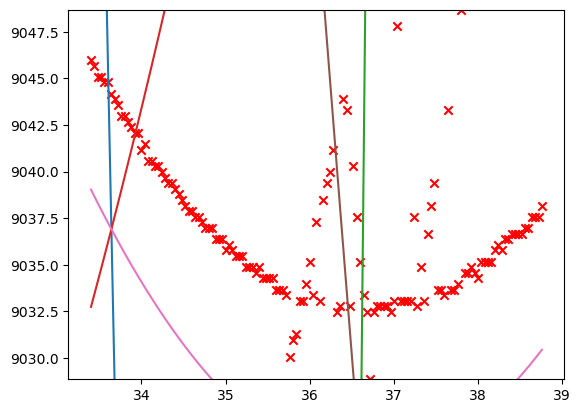

31 Roll = 1.28°


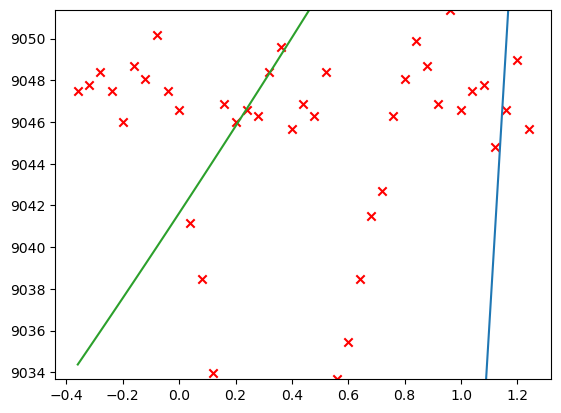

32 Roll = 0.66°


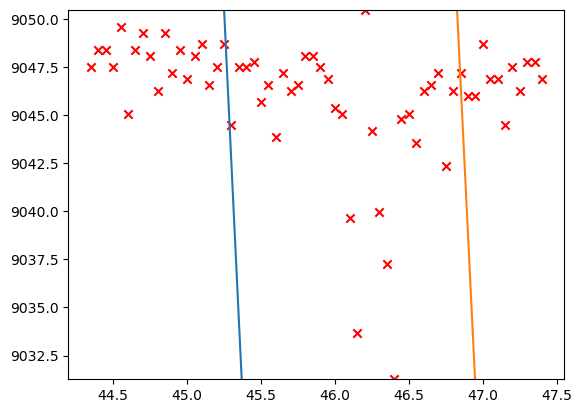

33 Roll = 0.40°


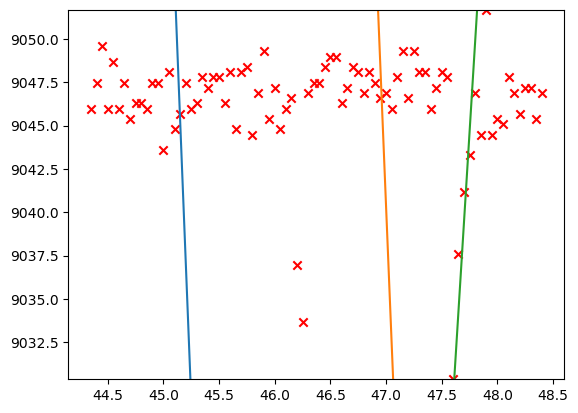

34 Roll = 1.40°


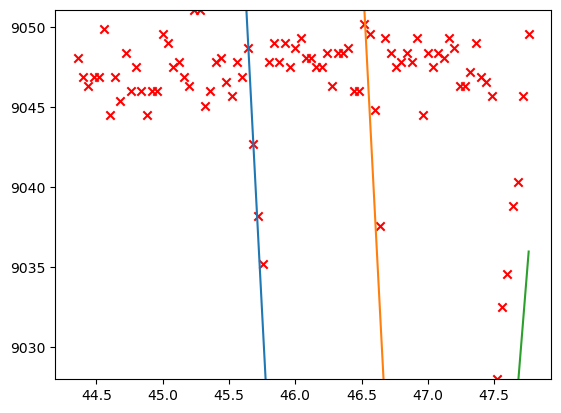

35 Roll = 1.20°


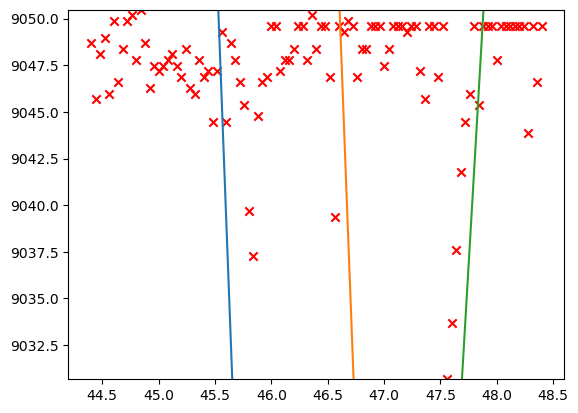

36 Roll = 0.00°


RuntimeError: Some Problems in the routine occured.
Switching back to original angles.

<Figure size 640x480 with 0 Axes>

In [ ]:
for m in range(len(pitch_dict)):#1):#
    
    plt.figure()
    pitches = pitch_dict[str(m+1)]
    roll = roll_dict[str(m+1)]
    print(m,f"Roll = {roll:.2f}°")
    Eph_seed = np.array(seeding_energy_dict[str(m+1)])
    Pitch = np.deg2rad(pitches+dPconv)
    bmir.cryst.yaw = np.deg2rad(dYconv)
    if m != 0:
        PreSampling = bmir.BraggCurvesEvsAngles_inRange((Eph_seed.min()-30,Eph_seed.max()+30),PitchRange=[Pitch.min(),Pitch.max()],RollRange=np.deg2rad(roll+dRconv)+np.abs(np.pi/2-np.mean(Pitch))*dRPconv,numPreSampling=1000)
        Hquery_i = PreSampling[1]
    else:
        Hquery_i = [np.array([4,0,0])]
    plt.scatter(pitches,Eph_seed,marker='x',color='red')
    for Hidx, H in enumerate(Hquery_i):
        #print(lidx)
        #P0 = P0s[lidx]
        
        EBragg = getBragg_wPRcorr(Pitch,np.deg2rad(roll+dRconv),np.deg2rad(dYconv),dRPconv,H)+Ecorrconv

        #print(peval_sub.min(),peval_sub.max())
        plt.plot(pitches,EBragg)
        if m!=0:
            plt.ylim(Eph_seed.min(),Eph_seed.max())
    plt.show()

    

## Bayesian optimization of the roll, yaw and alpha parameters with respect to the extracted lines

In [ ]:

# Define the black box function to optimize.
def black_box_function(dthy, dthr, alpha):
    hmax = 8
    kmax = 8
    lmax = 8
    phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll_angle, pitch)
    for phen, pangle, gid in zip(phen_list, p_angle_list, gid_list):
        ph_axis, pa_axis = [], []
        for ph_value, pa_value in zip(phen, pangle):
            # Only keep photon energies within a close range of the spectrometer image range
            if ph_value > np.min(seed_energy)-40 and ph_value < np.max(seed_energy)+40:
                global_ph.append(ph_value)
                global_pa.append(pa_value-dthp)
                global_gid.append(gid)
    dic = {'pitch_angle': global_pa, 'seed_energy_model': global_ph, 'gid': global_gid}
    df_model = pd.DataFrame(dic)
    df_model["pitch_angle"] = pd.to_numeric(df_model["pitch_angle"])
    # Create dataframe with the slope and intercept for each line found in this area
    res = df_model.groupby('gid').apply(lambda x: stats.linregress(x['pitch_angle'], x['seed_energy_model']))
    model_stats_df = pd.DataFrame(res.tolist(), index=res.index).reset_index().round(2)
    
    # Merge the measured and model data points
    df_meas = pd.merge(df, df_model, how="inner", on=["pitch_angle"])
    res = df_meas.groupby('gid').apply(lambda x: stats.linregress(x['pitch_angle'], x['seed_energy']))
    meas_stats_df = pd.DataFrame(res.tolist(), index=res.index).reset_index().round(2)
    meas_stats_df = meas_stats_df[meas_stats_df.pvalue < 0.5]

    # Merge the measured and model statistics dataframes
    df_merged = pd.merge(model_stats_df[['gid', 'slope', 'intercept']], meas_stats_df[['gid', 'slope', 'intercept']], how="inner", on=["gid"])
    df_merged['slope_delta'] = abs(df_merged['slope_x']-df_merged['slope_y'])
    df_merged['intercept_delta'] = abs(df_merged['intercept_x']-df_merged['intercept_y'])
    
    slope_cost=sum(df_merged['slope_delta'])**2
    intercept_cost=sum(df_merged['intercept_delta'])**2
    total_cost = 1/(slope_cost + (intercept_cost/10000))
    return total_cost


global_ph, global_pa, global_gid = [], [], []
seed_energy = np.array(seeding_energy)


# Measured data is fitted to lines
dic = {'pitch_angle': pitch, 'seed_energy': seed_energy}
df = pd.DataFrame(dic)
df["pitch_angle"] = pd.to_numeric(df["pitch_angle"])
df=df.drop_duplicates(['pitch_angle'])
    
# bayes_opt requires this to be a dictionary.
pbounds = {"dthy": [0.4, 0.45], "dthr": [0, 0.9], "alpha": [-0.005, 0]}# Create a BayesianOptimization optimizer,
# and optimize the given black_box_function.
optimizer = BayesianOptimization(f = black_box_function,
                                 pbounds = pbounds, verbose = 2,
                                 random_state = 4)
optimizer.maximize(init_points = 10, n_iter = 100)
print("Best result: {}; f(x) = {}.".format(optimizer.max["params"], optimizer.max["target"]))

|   iter    |  target   |   alpha   |   dthr    |   dthy    |
-------------------------------------------------------------
| 1         | 5.717e-07 | -0.000164 | 0.4925    | 0.4486    |
| 2         | 6.116e-07 | -0.001426 | 0.628     | 0.4108    |
| 3         | 6.446e-07 | -0.000118 | 0.005607  | 0.4126    |
| 4         | 6.491e-07 | -0.002826 | 0.7014    | 0.4099    |
| 5         | 6.68e-07  | -0.000685 | 0.8851    | 0.4082    |
| 6         | 7.147e-07 | -0.002013 | 0.008087  | 0.4193    |
| 7         | 7.267e-07 | -0.004779 | 0.861     | 0.4218    |
| 8         | 7.425e-07 | -0.000255 | 0.7077    | 0.4433    |
| 9         | 8.072e-07 | -0.004134 | 0.06745   | 0.43      |
| 10        | 7.992e-07 | -0.00416  | 0.66      | 0.4204    |
| 11        | 7.871e-07 | -0.001565 | 0.1325    | 0.427     |
| 12        | 7.748e-07 | -0.002921 | 0.876     | 0.4335    |
| 13        | 7.627e-07 | -0.002194 | 0.5785    | 0.441     |
| 14        | 7.529e-07 | -0.001912 | 0.3143    | 0.4373    |
| 15    

KeyboardInterrupt: 

## Plot the optimized model on top of the extracted measured lines

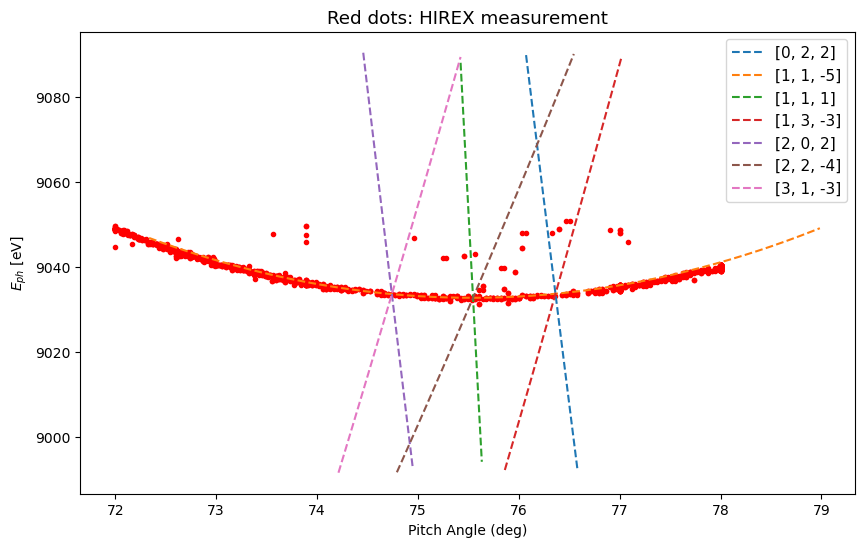

In [ ]:

dthy =optimizer.max["params"]['dthy']
dthr =optimizer.max["params"]['dthr']
alpha = optimizer.max["params"]['alpha']
dthp = 1.335


global_ph, global_pa, global_gid = [], [], []
seed_energy = np.array(seeding_energy)
pitch_list = np.linspace(min(pitch)-1,max(pitch),400) 
phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dthp, dthy, dthr, alpha, roll_angle, pitch_list)
fig, ax = plt.subplots(figsize=(10,6))
plt.plot(pitch, seed_energy, 'r.')

for phen, pangle, gid in zip(phen_list, p_angle_list, gid_list):
        ph_axis, pa_axis = [], []
        for ph_value, pa_value in zip(phen, pangle):
            # Only keep photon energies within a close range of the spectrometer image range
            if ph_value > np.min(seed_energy)-40 and ph_value < np.max(seed_energy)+40 and pa_value >= min(pitch_list)-1 and pa_value <= max(pitch_list)+1:
                ph_axis.append(ph_value)
                pa_axis.append(pa_value)
                
        if ph_axis == []:
            pass
        else:
            plt.plot(pa_axis, ph_axis, '--', label=gid)
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.rcParams.update({'font.size': 11})
#ax.set_ylim(np_phen[0], np_phen[-1])
#ax.set_xlim(doocs_scale[0], doocs_scale[-1])
ax.legend(loc='best')
plt.title('Red dots: HIREX measurement')
plt.show()
